# Agri-Food CO2 Emissions Prediction

## Project Goal
The goal of this project is to perform regression analysis and predict **Total Emissions** from agri-food systems based on various agricultural and land use features.

## Key Information
- **CO2 Measurement**: All emissions are recorded in kilotonnes (kt), where 1 kt = 1000 kg of CO2
- **Carbon Sink**: Forestland is the only feature that exhibits negative emissions due to its role as a carbon sink, absorbing CO2 from the atmosphere

Link to dataset: https://www.kaggle.com/datasets/alessandrolobello/agri-food-co2-emission-dataset-forecasting-ml/data


## Dataset Features:
- **Savanna fires:** Emissions from fires in savanna ecosystems.
- **Forest fires:** Emissions from fires in forested areas.
- **Crop Residues:** Emissions from burning or decomposing leftover plant material after crop harvesting.
- **Rice Cultivation:** Emissions from methane released during rice cultivation.
- **Drained organic soils (CO2):** Emissions from carbon dioxide released when draining organic soils.
- **Pesticides Manufacturing:** Emissions from the production of pesticides.
- **Food Transport:** Emissions from transporting food products.
- **Forestland:** Land covered by forests.
- **Net Forest conversion:** Change in forest area due to deforestation and afforestation.
- **Food Household Consumption:** Emissions from food consumption at the household level.
- **Food Retail:** Emissions from the operation of retail establishments selling food.
- **On-farm Electricity Use:** Electricity consumption on farms.
- **Food Packaging:** Emissions from the production and disposal of food packaging materials.
- **Agrifood Systems Waste Disposal:** Emissions from waste disposal in the agrifood system.
- **Food Processing:** Emissions from processing food products.
- **Fertilizers Manufacturing:** Emissions from the production of fertilizers.
- **IPPU:** Emissions from industrial processes and product use.
- **Manure applied to Soils:** Emissions from applying animal manure to agricultural soils.
- **Manure left on Pasture:** Emissions from animal manure on pasture or grazing land.
- **Manure Management:** Emissions from managing and treating animal manure.
- **Fires in organic soils:** Emissions from fires in organic soils.
- **Fires in humid tropical forests:** Emissions from fires in humid tropical forests.
- **On-farm energy use:** Energy consumption on farms.
- **Rural population:** Number of people living in rural areas.
- **Urban population:** Number of people living in urban areas.
- **Total Population - Male:** Total number of male individuals in the population.
- **Total Population - Female**: Total number of female individuals in the population.
- **total_emission:** Total greenhouse gas emissions from various sources.
- **Average Temperature °C:** The average increasing of temperature (by year) in degrees Celsius,

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.figure_factory as ff
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

import warnings
import seaborn as sns
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import OneHotEncoder

In [2]:
%matplotlib inline 
sns.set_theme(style="whitegrid")
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [3]:
df = pd.read_csv("data/Agrofood_co2_emission.csv")

# 1. - Exploratory Data Analysis

In [4]:
df.head()

,Area,Year,Savanna fires,Forest fires,Crop Residues,Rice Cultivation,Drained organic soils (CO2),Pesticides Manufacturing,Food Transport,Forestland,Net Forest conversion,Food Household Consumption,Food Retail,On-farm Electricity Use,Food Packaging,Agrifood Systems Waste Disposal,Food Processing,Fertilizers Manufacturing,IPPU,Manure applied to Soils,Manure left on Pasture,Manure Management,Fires in organic soils,Fires in humid tropical forests,On-farm energy use,Rural population,Urban population,Total Population - Male,Total Population - Female,total_emission,Average Temperature °C
0,Afghanistan,1990,14.7237,0.0557,205.6077,686.00,0.0,11.807483,63.1152,-2388.803,0.0,79.0851,109.6446,14.2666,67.631366,691.7888,252.21419,11.9970,209.9778,260.1431,1590.5319,319.1763,0.0,0.0,NaN,9655167.0,2593947.0,5348387.0,5346409.0,2198.963539,0.536167
1,Afghanistan,1991,14.7237,0.0557,209.4971,678.16,0.0,11.712073,61.2125,-2388.803,0.0,80.4885,116.6789,11.4182,67.631366,710.8212,252.21419,12.8539,217.0388,268.6292,1657.2364,342.3079,0.0,0.0,NaN,10230490.0,2763167.0,5372959.0,5372208.0,2323.876629,0.020667
2,Afghanistan,1992,14.7237,0.0557,196.5341,686.00,0.0,11.712073,53.3170,-2388.803,0.0,80.7692,126.1721,9.2752,67.631366,743.6751,252.21419,13.4929,222.1156,264.7898,1653.5068,349.1224,0.0,0.0,NaN,10995568.0,2985663.0,6028494.0,6028939.0,2356.304229,-0.259583
3,Afghanistan,1993,14.7237,0.0557,230.8175,686.00,0.0,11.712073,54.3617,-2388.803,0.0,85.0678,81.4607,9.0635,67.631366,791.9246,252.21419,14.0559,201.2057,261.7221,1642.9623,352.2947,0.0,0.0,NaN,11858090.0,3237009.0,7003641.0,7000119.0,2368.470529,0.101917
4,Afghanistan,1994,14.7237,0.0557,242.0494,705.60,0.0,11.712073,53.9874,-2388.803,0.0,88.8058,90.4008,8.3962,67.631366,831.9181,252.21419,15.1269,182.2905,267.6219,1689.3593,367.6784,0.0,0.0,NaN,12690115.0,3482604.0,7733458.0,7722096.0,2500.768729,0.372250


In [5]:
print(f"Number of rows: {df.shape[0]}, and columns: {df.shape[1]}")

Number of rows: 6965, and columns: 31


In [6]:
print("Number of duplicate rows: ", df.duplicated().sum())

Number of duplicate rows:  0


In [7]:
print("Varables in the dataset:")
for column in df.columns.tolist():
    print(column)

Varables in the dataset:
Area
Year
Savanna fires
Forest fires
Crop Residues
Rice Cultivation
Drained organic soils (CO2)
Pesticides Manufacturing
Food Transport
Forestland
Net Forest conversion
Food Household Consumption
Food Retail
On-farm Electricity Use
Food Packaging
Agrifood Systems Waste Disposal
Food Processing
Fertilizers Manufacturing
IPPU
Manure applied to Soils
Manure left on Pasture
Manure Management
Fires in organic soils
Fires in humid tropical forests
On-farm energy use
Rural population
Urban population
Total Population - Male
Total Population - Female
total_emission
Average Temperature °C


In [8]:
print("Missing values in each column:")
df.isna().sum()

Missing values in each column:


Area                                  0
Year                                  0
Savanna fires                        31
Forest fires                         93
Crop Residues                      1389
Rice Cultivation                      0
Drained organic soils (CO2)           0
Pesticides Manufacturing              0
Food Transport                        0
Forestland                          493
Net Forest conversion               493
Food Household Consumption          473
Food Retail                           0
On-farm Electricity Use               0
Food Packaging                        0
Agrifood Systems Waste Disposal       0
Food Processing                       0
Fertilizers Manufacturing             0
IPPU                                743
Manure applied to Soils             928
Manure left on Pasture                0
Manure Management                   928
Fires in organic soils                0
Fires in humid tropical forests     155
On-farm energy use                  956


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6965 entries, 0 to 6964
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Area                             6965 non-null   object 
 1   Year                             6965 non-null   int64  
 2   Savanna fires                    6934 non-null   float64
 3   Forest fires                     6872 non-null   float64
 4   Crop Residues                    5576 non-null   float64
 5   Rice Cultivation                 6965 non-null   float64
 6   Drained organic soils (CO2)      6965 non-null   float64
 7   Pesticides Manufacturing         6965 non-null   float64
 8   Food Transport                   6965 non-null   float64
 9   Forestland                       6472 non-null   float64
 10  Net Forest conversion            6472 non-null   float64
 11  Food Household Consumption       6492 non-null   float64
 12  Food Retail         

In [10]:
df.drop(columns=["Year"]).describe().round(1)

,Savanna fires,Forest fires,Crop Residues,Rice Cultivation,Drained organic soils (CO2),Pesticides Manufacturing,Food Transport,Forestland,Net Forest conversion,Food Household Consumption,Food Retail,On-farm Electricity Use,Food Packaging,Agrifood Systems Waste Disposal,Food Processing,Fertilizers Manufacturing,IPPU,Manure applied to Soils,Manure left on Pasture,Manure Management,Fires in organic soils,Fires in humid tropical forests,On-farm energy use,Rural population,Urban population,Total Population - Male,Total Population - Female,total_emission,Average Temperature °C
count,6934.0,6872.0,5576.0,6965.0,6965.0,6965.0,6965.0,6472.0,6472.0,6492.0,6965.0,6965.0,6965.0,6965.0,6965.0,6965.0,6222.0,6037.0,6965.0,6037.0,6965.0,6810.0,6009.0,6965.0,6965.0,6965.0,6965.0,6965.0,6965.0
mean,1188.4,919.3,998.7,4259.7,3503.2,333.4,1939.6,-17828.3,17605.6,4847.6,2043.2,1626.7,1658.6,6018.4,3872.7,3035.7,19991.5,923.2,3518.0,2263.3,1210.3,668.5,3009.0,17857735.4,16932297.0,17619629.6,17324469.3,64091.2,0.9
std,5246.3,3720.1,3700.3,17613.8,15861.4,1429.2,5616.7,81832.2,101157.5,25789.1,8494.2,9343.2,11481.3,22156.7,19838.2,11693.0,111420.9,3227.0,9103.6,7980.5,22669.8,3264.9,12637.9,89015213.8,65743619.6,76039931.0,72517113.5,228313.0,0.6
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-797183.1,0.0,0.0,0.0,0.0,0.0,0.3,0.0,0.0,0.0,0.0,0.0,0.4,0.0,0.0,0.0,0.0,0.0,250.0,270.0,-391884.1,-1.4
25%,0.0,0.0,11.0,181.3,0.0,6.0,28.0,-2848.4,0.0,11.4,26.8,8.0,67.6,86.7,209.6,360.4,39.0,16.3,139.7,37.6,0.0,0.0,13.3,97311.0,217386.0,201326.0,207890.0,5221.2,0.5
50%,1.7,0.5,103.7,534.8,0.0,13.0,205.0,-62.9,44.4,155.5,172.0,29.1,74.0,901.3,344.8,1115.1,803.7,120.4,972.6,269.9,0.0,0.0,141.1,1595322.0,2357581.0,2469660.0,2444135.0,12147.7,0.8
75%,111.1,65.0,377.6,1536.6,690.4,116.3,1207.0,0.0,4701.7,1377.2,1076.0,499.9,281.8,3006.4,1236.9,2024.9,6155.2,460.1,2430.8,1126.8,0.0,9.6,1136.9,8177340.0,8277123.0,9075924.0,9112588.0,35139.7,1.2
max,114616.4,52227.6,33490.1,164915.3,241025.1,16459.0,67945.8,171121.1,1605106.1,466288.2,133784.1,165676.3,175741.3,213289.7,274253.5,170826.4,1861640.7,34677.4,92630.8,70592.6,991717.5,51771.3,248879.2,900099113.0,902077760.0,743586579.0,713341908.0,3115113.7,3.6


## 1.1 - Univariate analysis

### 1.1.1 - Categorical variables

#### Area - Nominal variable

In [11]:
print(
    f"Percent of missing values in Area variable: {(df["Area"].isna().sum() / df.shape[0] * 100).round(2)}%"
)

Percent of missing values in Area variable: 0.0%


In [12]:
print(f"Number of unique areas: {df['Area'].nunique()}")

Number of unique areas: 236


In [13]:
print("Area value counts:")
df["Area"].value_counts()

Area value counts:


Area
Afghanistan                                             31
Albania                                                 31
Algeria                                                 31
American Samoa                                          31
Andorra                                                 31
Angola                                                  31
Anguilla                                                31
Antigua and Barbuda                                     31
Argentina                                               31
Aruba                                                   31
Australia                                               31
Austria                                                 31
Cameroon                                                31
Bahamas                                                 31
Bahrain                                                 31
Bangladesh                                              31
Barbados                                           

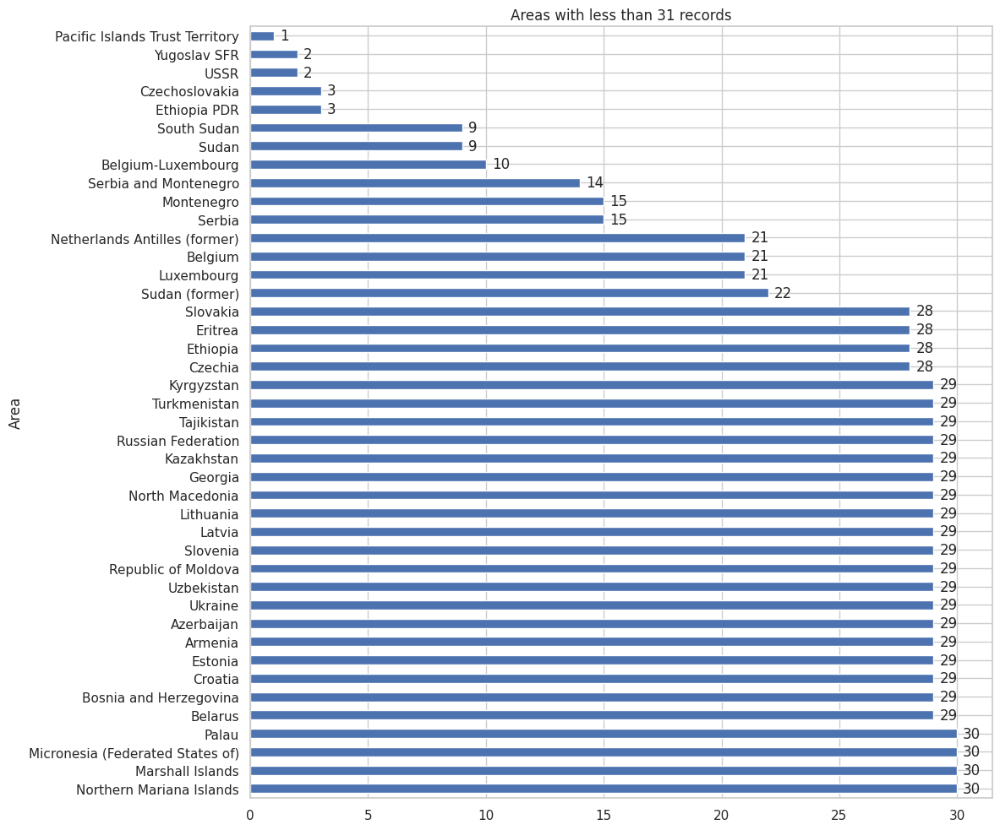

In [14]:
ax = (
    df["Area"]
    .value_counts()
    .loc[lambda x: x < 31]
    .plot(kind="barh", figsize=(12, 10), title="Areas with less than 31 records")
)

max_width = 0
for patch in ax.patches:
    width = patch.get_width()
    max_width = max(max_width, width)
    y = patch.get_y() + patch.get_height() / 2
    ax.text(width + 0.25, y, f"{int(width)}", va="center", ha="left")

ax.set_xlim(0, max_width * 1.05)

plt.tight_layout()

In [15]:
print(
    f"Number of areas with less than 31 (max number of records for the most countries) records: {df['Area'].value_counts(ascending=False).loc[lambda x: x < 31].count()}"
)

Number of areas with less than 31 (max number of records for the most countries) records: 42


Conclusions: 
- There are some countries that don't exist anymore, and some newly formed countries between areas with less than 31 records.
- This will not going to influence our prediction.
- There is no point in plotting the bar chart of whole Area variable, because there are 236 different areas. 

### 1.1.2 - Numerical variables

#### Year - Discrete variable

In [16]:
print(
    f"Percent of missing values in Year variable: {(df['Year'].isna().sum() / df.shape[0] * 100).round(2)}%"
)

Percent of missing values in Year variable: 0.0%


In [17]:
print("Max and Min year values:")
print(f"Max year: {df['Year'].max()}")
print(f"Min year: {df['Year'].min()}")

Max and Min year values:
Max year: 2020
Min year: 1990


In [18]:
print(f"Number of unique values in Year variable: {df['Year'].nunique()}")

Number of unique values in Year variable: 31


In [19]:
print("Year value counts:")
print(df["Year"].value_counts())

Year value counts:
Year
2014    227
2020    227
2019    227
2016    227
2015    227
2018    227
2017    227
2013    227
2008    227
2010    227
2012    227
2009    227
2006    227
2007    227
2002    226
2004    226
2003    226
2000    226
2001    226
2011    226
2005    226
1995    225
1994    225
1996    225
1997    225
1999    225
1998    225
1993    225
1992    223
1991    205
1990    202
Name: count, dtype: int64


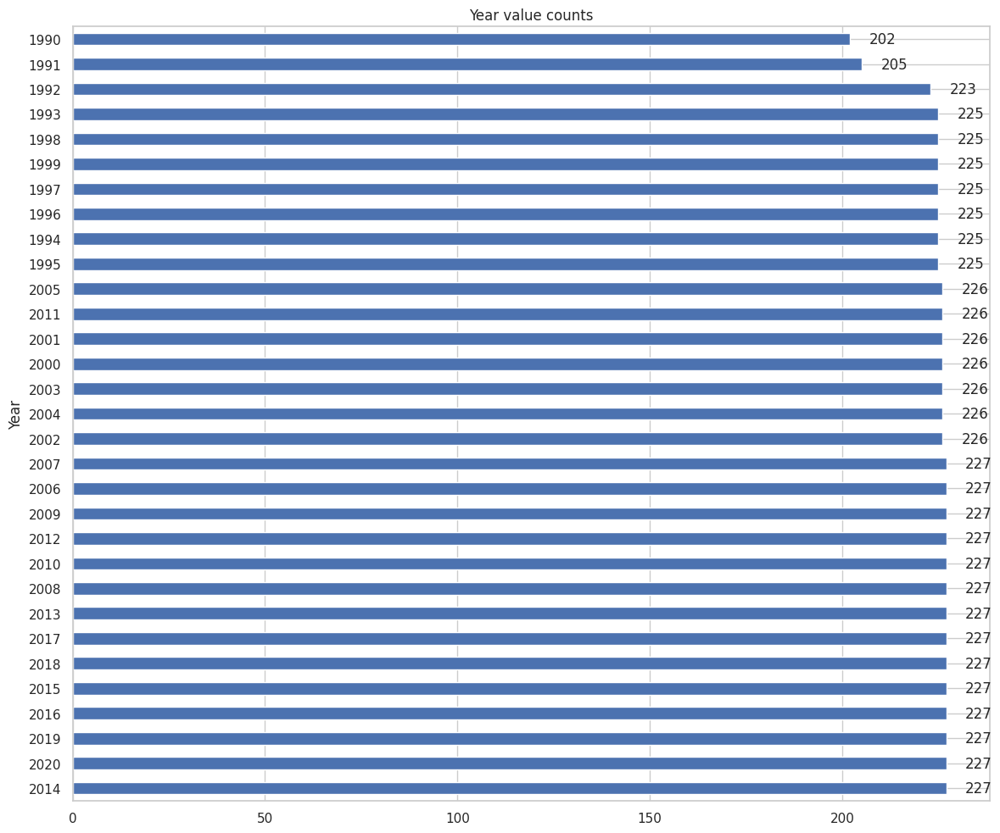

In [20]:
ax = (
    df["Year"]
    .value_counts()
    .plot(kind="barh", figsize=(12, 10), title="Year value counts")
)

max_width = 0
for patch in ax.patches:
    width = patch.get_width()
    max_width = max(max_width, width)
    y = patch.get_y() + patch.get_height() / 2
    ax.text(width + 5, y, f"{int(width)}", va="center", ha="left")

ax.set_xlim(0, max_width * 1.05)

plt.tight_layout()

#### Continuous variables:

In [21]:
def plot_distribution(x, name):
    """Plot distribution with automatic optimal binning for skewed data"""
    plt.figure(figsize=(12, 8))

    # Create subplots for different views
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))

    # 1. Auto bins with KDE
    sns.histplot(x, kde=True, stat="density", alpha=0.7, ax=axes[0, 0])
    axes[0, 0].set_title(f"{name} - Auto Bins")
    axes[0, 0].axvline(
        np.mean(x), color="red", linestyle="--", label=f"Mean: {np.mean(x):.2f}"
    )
    axes[0, 0].axvline(
        np.median(x), color="green", linestyle="--", label=f"Median: {np.median(x):.2f}"
    )
    axes[0, 0].legend()

    # 2. Log scale (better for skewed data)
    log_data = np.log1p(x)  # log(1+x) to handle zeros
    sns.histplot(log_data, kde=True, stat="density", alpha=0.7, ax=axes[0, 1])
    axes[0, 1].set_title(f"{name} - Log Scale")
    axes[0, 1].set_xlabel(f"log(1 + {name})")

    # 3. Sqrt transformation
    sqrt_data = np.sqrt(x)
    sns.histplot(sqrt_data, kde=True, stat="density", alpha=0.7, ax=axes[1, 0])
    axes[1, 0].set_title(f"{name} - Square Root Scale")
    axes[1, 0].set_xlabel(f"√{name}")

    # 4. Box plot for outlier context
    sns.boxplot(
        x=x,
        ax=axes[1, 1],
        showmeans=True,
        boxprops=dict(alpha=0.7),
        flierprops=dict(marker="o", markerfacecolor="red", markersize=8, alpha=0.6),
    )
    axes[1, 1].set_title(f"{name} - Box Plot")

    plt.tight_layout()
    plt.show()

In [22]:
def outliers_report(x):
    x = np.sort(x)
    q1 = np.percentile(x, 25)
    q3 = np.percentile(x, 75)
    iqr = q3 - q1
    lower_fence = q1 - 1.5 * iqr
    upper_fence = q3 + 1.5 * iqr
    lower_fence_outliers = x[x < lower_fence]
    upper_fence_outliers = x[x > upper_fence]
    outliers = np.concatenate((lower_fence_outliers, upper_fence_outliers))
    percent_outliers = (len(outliers) / len(x)) * 100

    report = {
        "Q1": q1,
        "Q3": q3,
        "IQR": iqr,
        "Lower fence": lower_fence,
        "Upper fence": upper_fence,
        "Number of Statistical Outlier Candidates": len(outliers),
        "Percent of Statistical Outlier Candidates": percent_outliers,
        "Top-5 below Lower fence Outliers": (
            lower_fence_outliers[:5]
            if len(lower_fence_outliers) >= 5
            else lower_fence_outliers
        ),
        "Top-5 above Upper fence Outliers": (
            upper_fence_outliers[-5:]
            if len(upper_fence_outliers) >= 5
            else upper_fence_outliers
        ),
    }

    print("Outliers Report:")
    for key, value in report.items():
        value = np.round(value, 2)
        if "Percent" in key:
            value = f"{value}%"
        print(f"{key}: {value}")

##### Savanna fires

- Emissions from fires in savanna ecosystems.

<Figure size 1200x800 with 0 Axes>

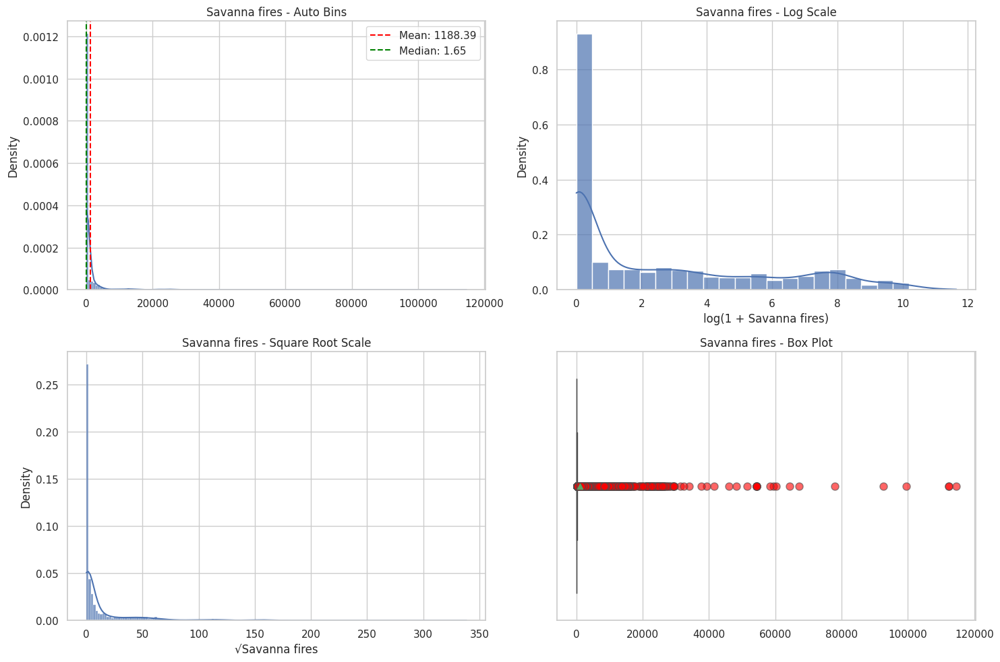

In [23]:
plot_distribution(df["Savanna fires"].dropna().values, "Savanna fires")

In [24]:
df["Savanna fires"].describe().round(2)

count      6934.00
mean       1188.39
std        5246.29
min           0.00
25%           0.00
50%           1.65
75%         111.08
max      114616.40
Name: Savanna fires, dtype: float64

In [25]:
print(
    f"Percent of missing values in Savanna fires variable: {(df['Savanna fires'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Savanna fires variable: {df['Savanna fires'].isna().sum()}"
)

Percent of missing values in Savanna fires variable: 0.45%
Absolute number of missing values in Savanna fires variable: 31


In [26]:
outliers_report(df["Savanna fires"].dropna().values)

Outliers Report:
Q1: 0.0
Q3: 111.08
IQR: 111.08
Lower fence: -166.62
Upper fence: 277.7
Number of Statistical Outlier Candidates: 1429
Percent of Statistical Outlier Candidates: 20.61%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [ 92588.61  99437.13 112373.83 112381.01 114616.4 ]


Notes: 
- IQR fences are heuristic, not formal outlier tests. Outliers depends on context and data-generating process.
- In this specific domain, we can not claim that those observations are outliers.
- Because of previous conclusions, we will not eliminate those observations.

---

##### Forest fires

Emissions from fires in forested areas.

<Figure size 1200x800 with 0 Axes>

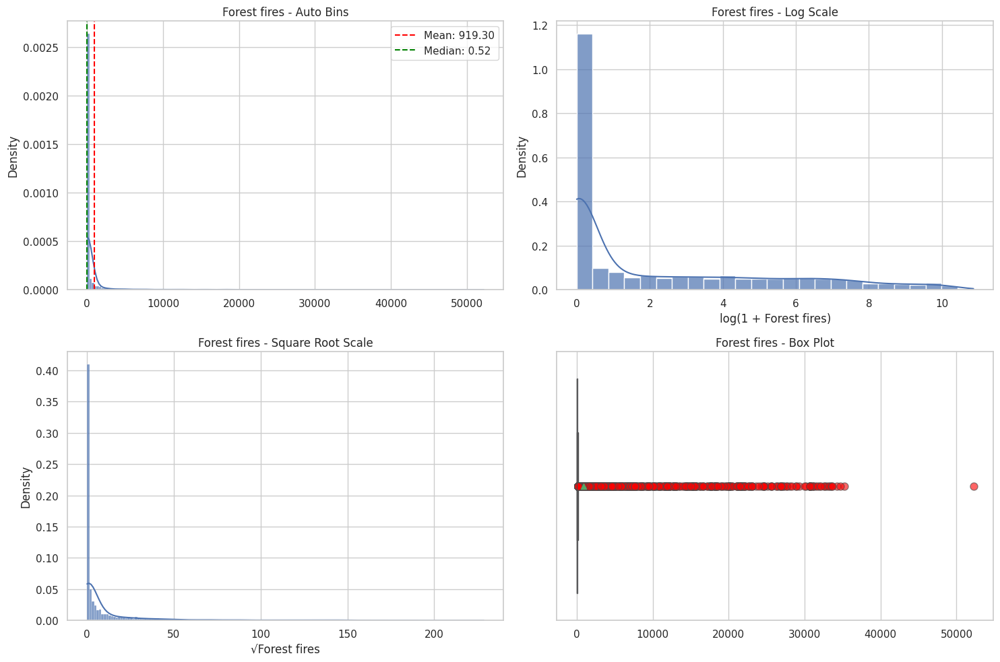

In [27]:
plot_distribution(df["Forest fires"].dropna().values, "Forest fires")

In [28]:
df["Forest fires"].describe().round(2)

count     6872.00
mean       919.30
std       3720.08
min          0.00
25%          0.00
50%          0.52
75%         64.95
max      52227.63
Name: Forest fires, dtype: float64

In [29]:
print(
    f"Percent of missing values in Forest fires variable: {(df['Forest fires'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Forest fires variable: {df['Forest fires'].isna().sum()}"
)

Percent of missing values in Forest fires variable: 1.34%
Absolute number of missing values in Forest fires variable: 93


In [30]:
outliers_report(df["Forest fires"].dropna().values)

Outliers Report:
Q1: 0.0
Q3: 64.95
IQR: 64.95
Lower fence: -97.43
Upper fence: 162.38
Number of Statistical Outlier Candidates: 1388
Percent of Statistical Outlier Candidates: 20.2%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [33595.86 34292.66 34718.93 35225.64 52227.63]


---

##### Crop Residues

Emissions from burning or decomposing leftover plant material after crop harvesting.

<Figure size 1200x800 with 0 Axes>

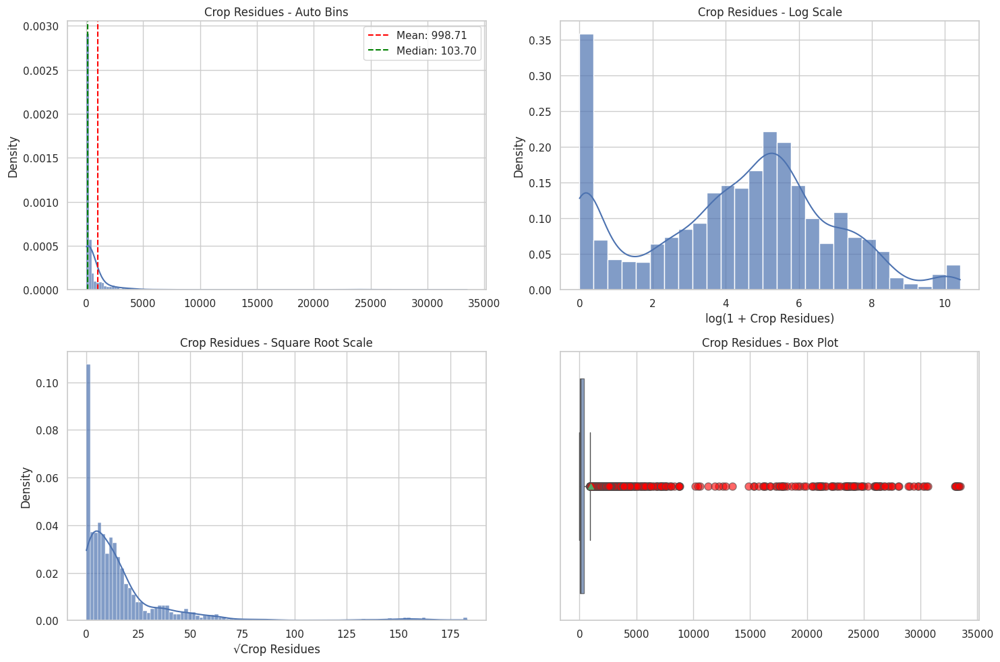

In [31]:
plot_distribution(df["Crop Residues"].dropna().values, "Crop Residues")

In [32]:
df["Crop Residues"].describe().round(2)

count     5576.00
mean       998.71
std       3700.35
min          0.00
25%         11.01
50%        103.70
75%        377.64
max      33490.07
Name: Crop Residues, dtype: float64

In [33]:
print(
    f"Percent of missing values in Crop Residues variable: {(df['Crop Residues'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Crop Residues variable: {df['Crop Residues'].isna().sum()}"
)

Percent of missing values in Crop Residues variable: 19.94%
Absolute number of missing values in Crop Residues variable: 1389


In [34]:
outliers_report(df["Crop Residues"].dropna().values)

Outliers Report:
Q1: 11.01
Q3: 377.64
IQR: 366.63
Lower fence: -538.95
Upper fence: 927.59
Number of Statistical Outlier Candidates: 891
Percent of Statistical Outlier Candidates: 15.98%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [33261.01 33277.04 33382.86 33384.81 33490.07]


---

##### Rice Cultivation

Emissions from methane released during rice cultivation.

<Figure size 1200x800 with 0 Axes>

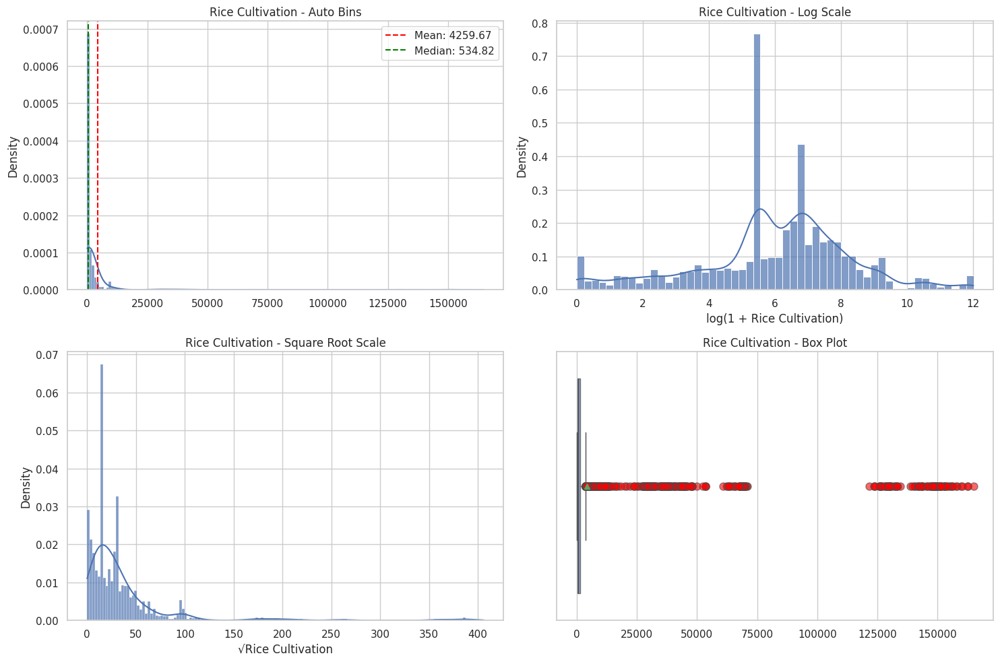

In [35]:
plot_distribution(df["Rice Cultivation"].dropna().values, "Rice Cultivation")

In [36]:
df["Rice Cultivation"].describe().round(2)

count      6965.00
mean       4259.67
std       17613.83
min           0.00
25%         181.26
50%         534.82
75%        1536.64
max      164915.26
Name: Rice Cultivation, dtype: float64

In [37]:
print(
    f"Percent of missing values in Rice Cultivation variable: {(df['Rice Cultivation'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Rice Cultivation variable: {df['Rice Cultivation'].isna().sum()}"
)

Percent of missing values in Rice Cultivation variable: 0.0%
Absolute number of missing values in Rice Cultivation variable: 0


In [38]:
outliers_report(df["Rice Cultivation"].dropna().values)

Outliers Report:
Q1: 181.26
Q3: 1536.64
IQR: 1355.38
Lower fence: -1851.81
Upper fence: 3569.71
Number of Statistical Outlier Candidates: 923
Percent of Statistical Outlier Candidates: 13.25%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [159831.97 160265.89 162451.06 162600.31 164915.26]


---

##### Drained organic soils (CO2)

Emissions from carbon dioxide released when draining organic soils.

<Figure size 1200x800 with 0 Axes>

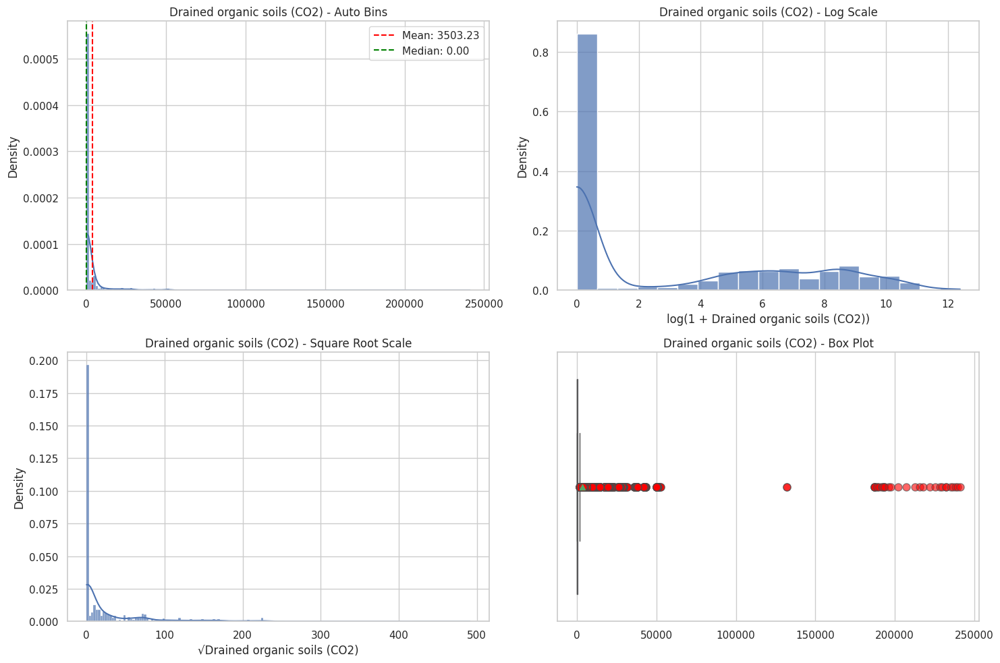

In [39]:
plot_distribution(
    df["Drained organic soils (CO2)"].dropna().values, "Drained organic soils (CO2)"
)

In [40]:
df["Drained organic soils (CO2)"].describe().round(2)

count      6965.00
mean       3503.23
std       15861.45
min           0.00
25%           0.00
50%           0.00
75%         690.41
max      241025.07
Name: Drained organic soils (CO2), dtype: float64

In [41]:
print(
    f"Percent of missing values in Drained organic soils (CO2) variable: {(df['Drained organic soils (CO2)'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Drained organic soils (CO2) variable: {df['Drained organic soils (CO2)'].isna().sum()}"
)

Percent of missing values in Drained organic soils (CO2) variable: 0.0%
Absolute number of missing values in Drained organic soils (CO2) variable: 0


In [42]:
outliers_report(df["Drained organic soils (CO2)"].dropna().values)

Outliers Report:
Q1: 0.0
Q3: 690.41
IQR: 690.41
Lower fence: -1035.61
Upper fence: 1726.02
Number of Statistical Outlier Candidates: 1361
Percent of Statistical Outlier Candidates: 19.54%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [235293.72 236348.42 237956.52 239396.48 241025.07]


---

##### Pesticides Manufacturing

Emissions from the production of pesticides.

<Figure size 1200x800 with 0 Axes>

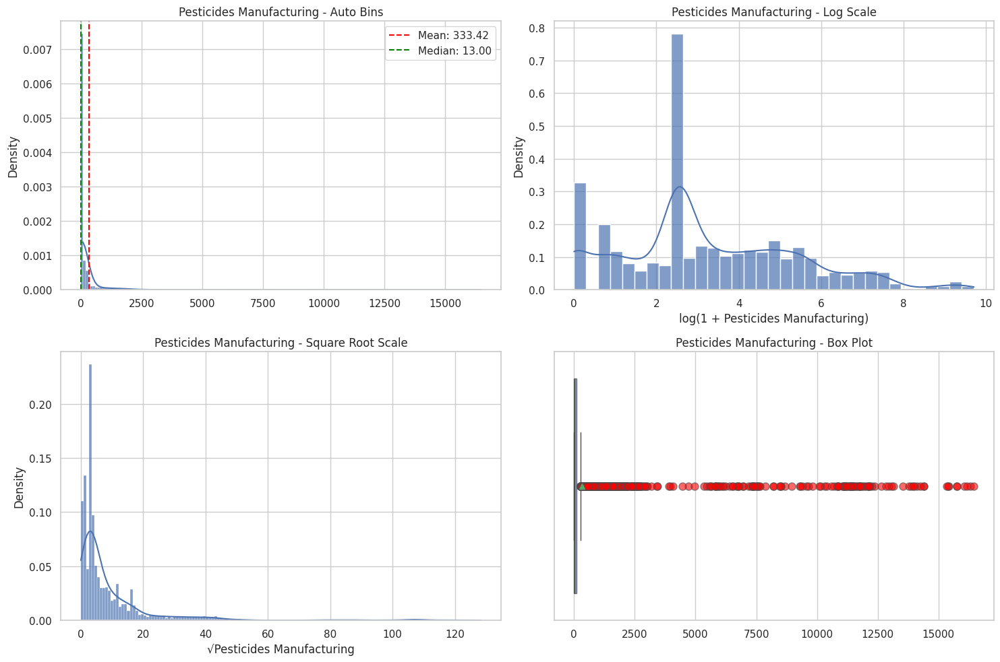

In [43]:
plot_distribution(
    df["Pesticides Manufacturing"].dropna().values, "Pesticides Manufacturing"
)

In [44]:
df["Pesticides Manufacturing"].describe().round(2)

count     6965.00
mean       333.42
std       1429.16
min          0.00
25%          6.00
50%         13.00
75%        116.33
max      16459.00
Name: Pesticides Manufacturing, dtype: float64

In [45]:
print(
    f"Percent of missing values in Pesticides Manufacturing variable: {(df['Pesticides Manufacturing'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Pesticides Manufacturing variable: {df['Pesticides Manufacturing'].isna().sum()}"
)

Percent of missing values in Pesticides Manufacturing variable: 0.0%
Absolute number of missing values in Pesticides Manufacturing variable: 0


In [46]:
outliers_report(df["Pesticides Manufacturing"].dropna().values)

Outliers Report:
Q1: 6.0
Q3: 116.33
IQR: 110.33
Lower fence: -159.49
Upper fence: 281.81
Number of Statistical Outlier Candidates: 946
Percent of Statistical Outlier Candidates: 13.58%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [15765. 16050. 16177. 16325. 16459.]


---

##### Food Transport

Emissions from transporting food products.

<Figure size 1200x800 with 0 Axes>

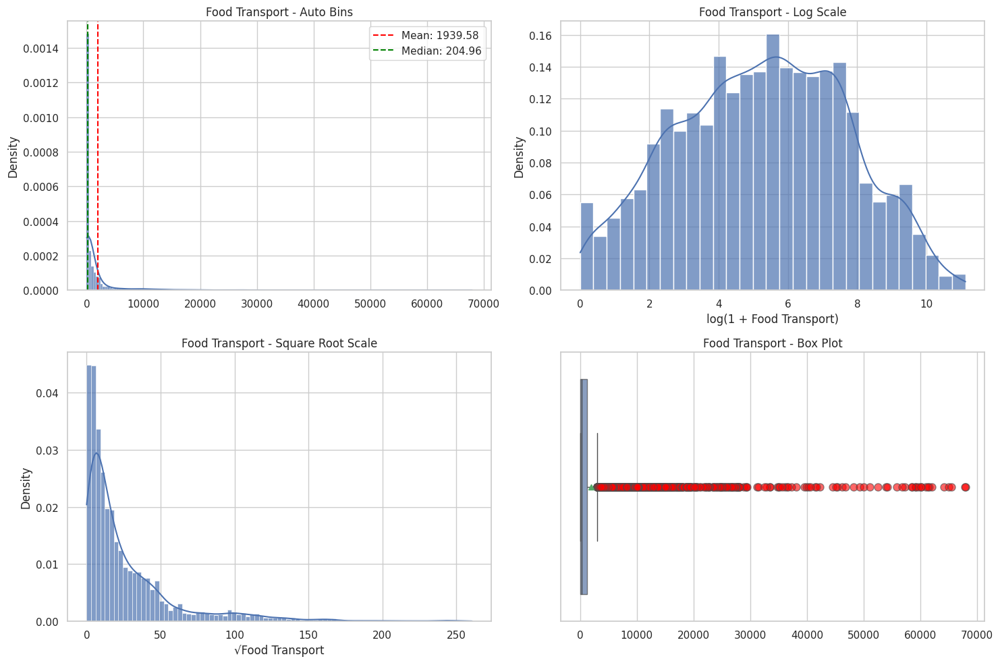

In [47]:
plot_distribution(df["Food Transport"].dropna().values, "Food Transport")

In [48]:
df["Food Transport"].describe().round(2)

count     6965.00
mean      1939.58
std       5616.75
min          0.00
25%         27.96
50%        204.96
75%       1207.00
max      67945.76
Name: Food Transport, dtype: float64

In [49]:
print(
    f"Percent of missing values in Food Transport variable: {(df['Food Transport'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Food Transport variable: {df['Food Transport'].isna().sum()}"
)

Percent of missing values in Food Transport variable: 0.0%
Absolute number of missing values in Food Transport variable: 0


In [50]:
outliers_report(df["Food Transport"].dropna().values)

Outliers Report:
Q1: 27.96
Q3: 1207.0
IQR: 1179.04
Lower fence: -1740.6
Upper fence: 2975.56
Number of Statistical Outlier Candidates: 890
Percent of Statistical Outlier Candidates: 12.78%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [64147.02 64980.68 65488.5  67843.58 67945.76]


---

##### Forestland

Land covered by forests.

<Figure size 1200x800 with 0 Axes>

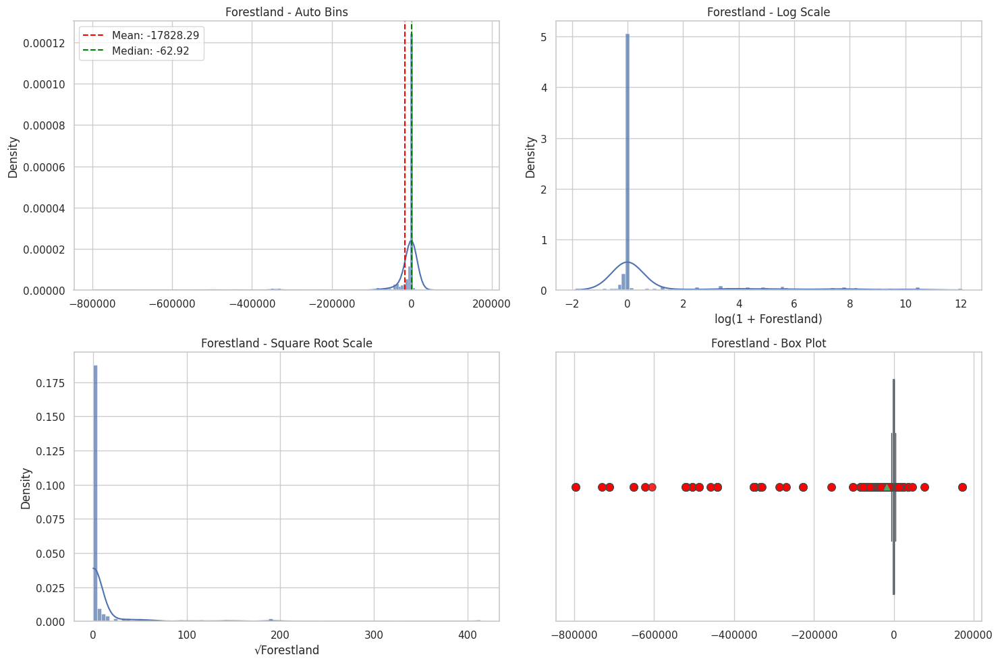

In [51]:
plot_distribution(df["Forestland"].dropna().values, "Forestland")

In [52]:
df["Forestland"].describe().round(2)

count      6472.00
mean     -17828.29
std       81832.21
min     -797183.08
25%       -2848.35
50%         -62.92
75%           0.00
max      171121.08
Name: Forestland, dtype: float64

In [53]:
print(
    f"Percent of missing values in Forestland variable: {(df['Forestland'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Forestland variable: {df['Forestland'].isna().sum()}"
)

Percent of missing values in Forestland variable: 7.08%
Absolute number of missing values in Forestland variable: 493


In [54]:
outliers_report(df["Forestland"].dropna().values)

Outliers Report:
Q1: -2848.35
Q3: 0.0
IQR: 2848.35
Lower fence: -7120.88
Upper fence: 4272.52
Number of Statistical Outlier Candidates: 1277
Percent of Statistical Outlier Candidates: 19.73%
Top-5 below Lower fence Outliers: [-797183.08 -797183.08 -797183.08 -797183.08 -797183.08]
Top-5 above Upper fence Outliers: [171121.08 171121.08 171121.08 171121.08 171121.08]


---

##### Net Forest conversion

Change in forest area due to deforestation and afforestation.

<Figure size 1200x800 with 0 Axes>

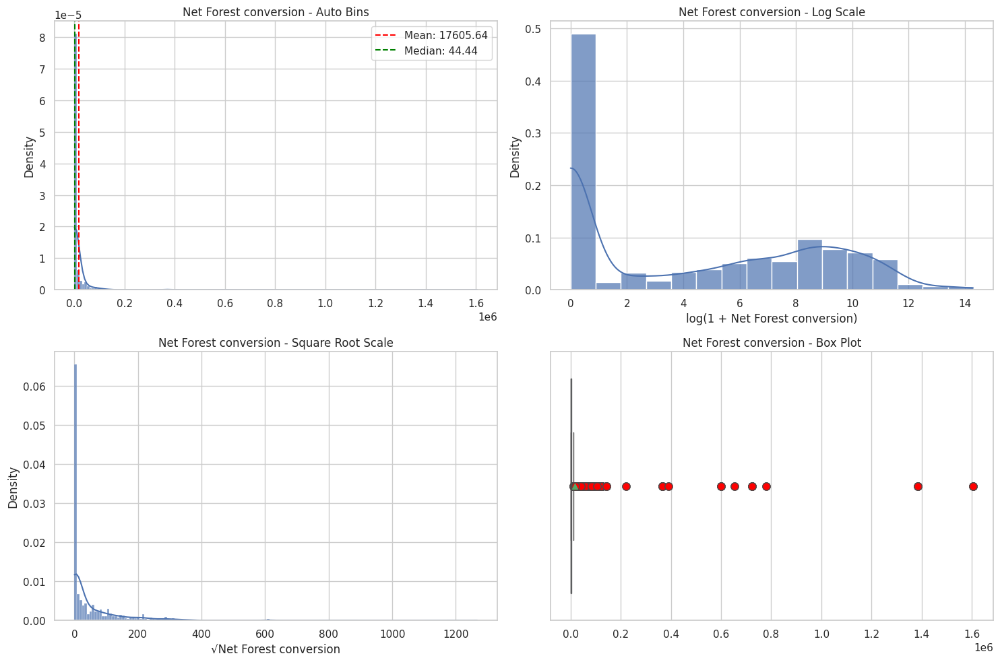

In [55]:
plot_distribution(df["Net Forest conversion"].dropna().values, "Net Forest conversion")

In [56]:
df["Net Forest conversion"].describe().round(2)

count       6472.00
mean       17605.64
std       101157.53
min            0.00
25%            0.00
50%           44.44
75%         4701.75
max      1605106.10
Name: Net Forest conversion, dtype: float64

In [57]:
print(
    f"Percent of missing values in Net Forest conversion variable: {(df['Net Forest conversion'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Net Forest conversion variable: {df['Net Forest conversion'].isna().sum()}"
)

Percent of missing values in Net Forest conversion variable: 7.08%
Absolute number of missing values in Net Forest conversion variable: 493


In [58]:
outliers_report(df["Net Forest conversion"].dropna().values)

Outliers Report:
Q1: 0.0
Q3: 4701.75
IQR: 4701.75
Lower fence: -7052.62
Upper fence: 11754.36
Number of Statistical Outlier Candidates: 1085
Percent of Statistical Outlier Candidates: 16.76%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [1605106.1 1605106.1 1605106.1 1605106.1 1605106.1]


---

##### Food Household Consumption

Emissions from food consumption at the household level.

<Figure size 1200x800 with 0 Axes>

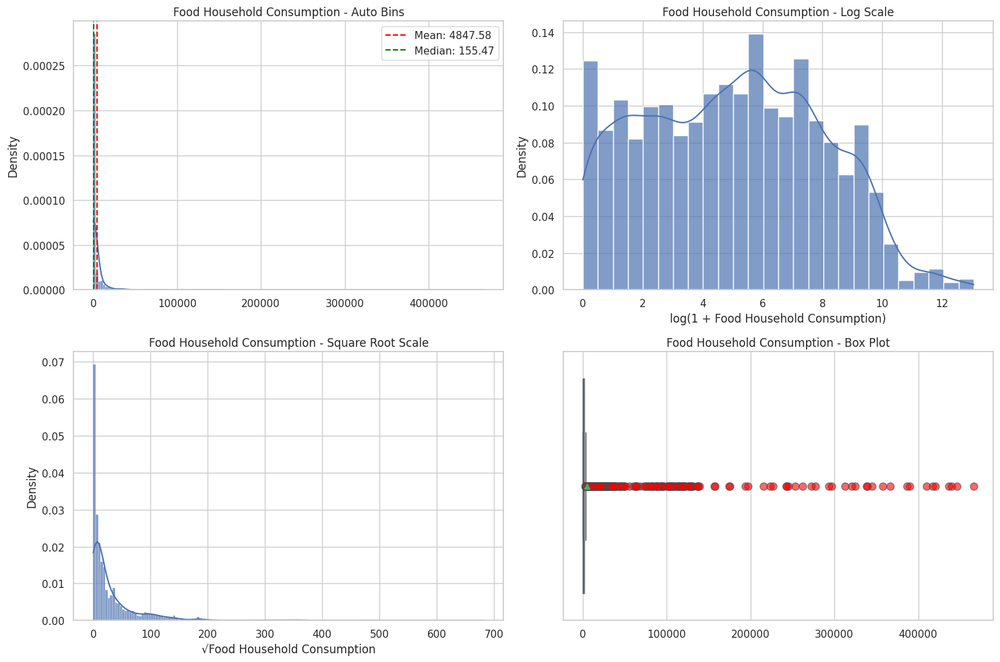

In [59]:
plot_distribution(
    df["Food Household Consumption"].dropna().values, "Food Household Consumption"
)

In [60]:
df["Food Household Consumption"].describe().round(2)

count      6492.00
mean       4847.58
std       25789.14
min           0.00
25%          11.40
50%         155.47
75%        1377.15
max      466288.20
Name: Food Household Consumption, dtype: float64

In [61]:
print(
    f"Percent of missing values in Food Household Consumption variable: {(df['Food Household Consumption'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Food Household Consumption variable: {df['Food Household Consumption'].isna().sum()}"
)

Percent of missing values in Food Household Consumption variable: 6.79%
Absolute number of missing values in Food Household Consumption variable: 473


In [62]:
outliers_report(df["Food Household Consumption"].dropna().values)

Outliers Report:
Q1: 11.4
Q3: 1377.15
IQR: 1365.75
Lower fence: -2037.23
Upper fence: 3425.78
Number of Statistical Outlier Candidates: 1079
Percent of Statistical Outlier Candidates: 16.62%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [420384.36 436570.2  439390.02 446192.1  466288.2 ]


---

##### Food Retail

Emissions from the operation of retail establishments selling food.

<Figure size 1200x800 with 0 Axes>

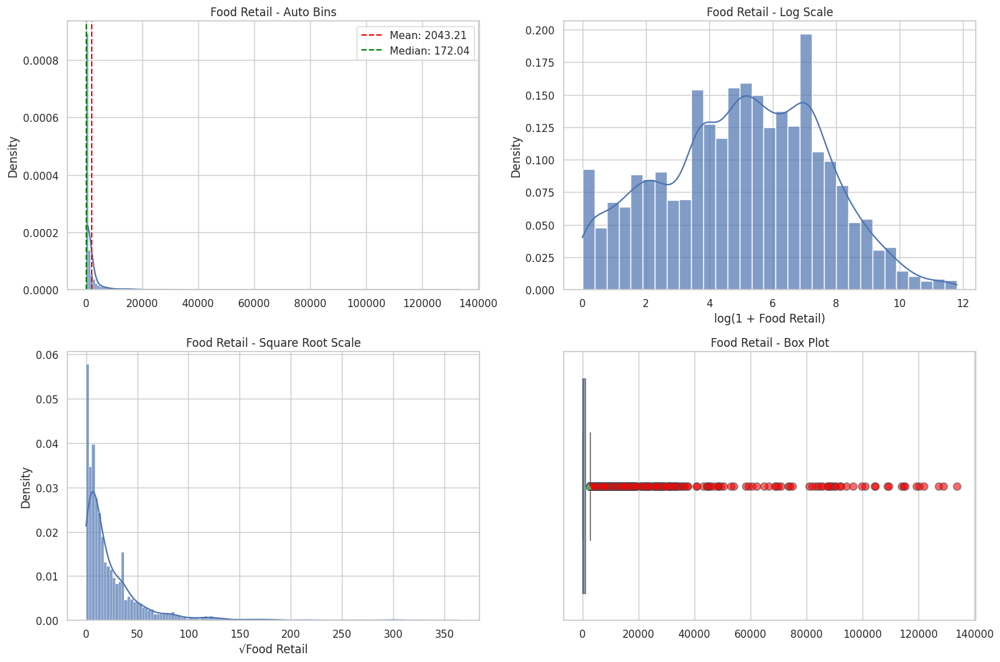

In [63]:
plot_distribution(df["Food Retail"].dropna().values, "Food Retail")

In [64]:
df["Food Retail"].describe().round(2)

count      6965.00
mean       2043.21
std        8494.25
min           0.00
25%          26.82
50%         172.04
75%        1076.00
max      133784.07
Name: Food Retail, dtype: float64

In [65]:
print(
    f"Percent of missing values in Food Retail variable: {(df['Food Retail'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Food Retail variable: {df['Food Retail'].isna().sum()}"
)

Percent of missing values in Food Retail variable: 0.0%
Absolute number of missing values in Food Retail variable: 0


In [66]:
outliers_report(df["Food Retail"].dropna().values)

Outliers Report:
Q1: 26.82
Q3: 1076.0
IQR: 1049.18
Lower fence: -1546.95
Upper fence: 2649.77
Number of Statistical Outlier Candidates: 871
Percent of Statistical Outlier Candidates: 12.51%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [120356.96 122070.99 127293.89 128863.19 133784.07]


---

##### On-farm Electricity Use

Electricity consumption on farms.

<Figure size 1200x800 with 0 Axes>

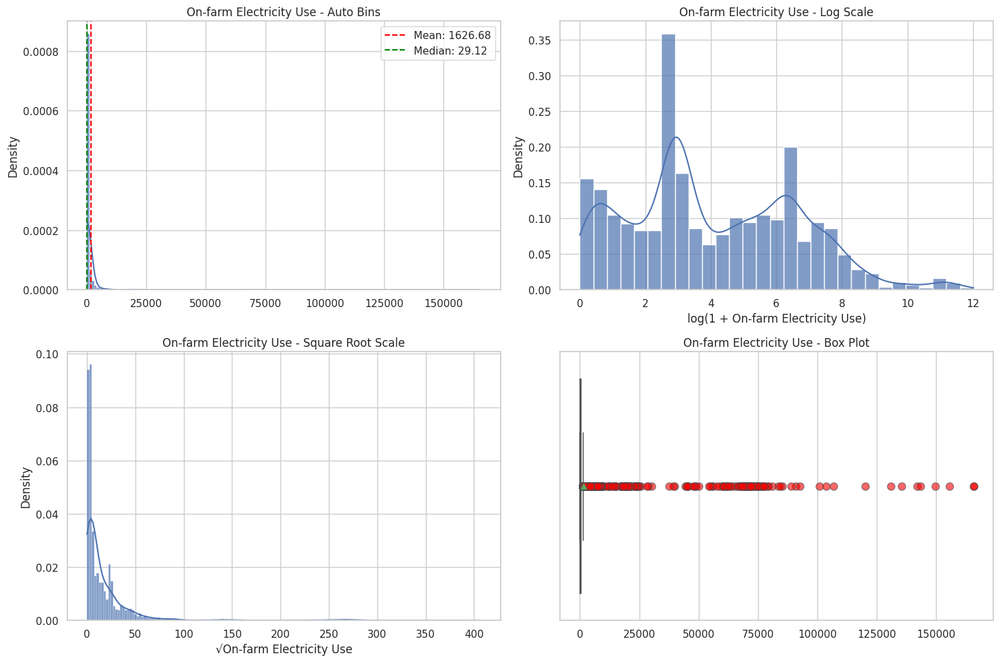

In [67]:
plot_distribution(
    df["On-farm Electricity Use"].dropna().values, "On-farm Electricity Use"
)

In [68]:
df["On-farm Electricity Use"].describe().round(2)

count      6965.00
mean       1626.68
std        9343.18
min           0.00
25%           8.04
50%          29.12
75%         499.94
max      165676.30
Name: On-farm Electricity Use, dtype: float64

In [69]:
print(
    f"Percent of missing values in On-farm Electricity Use variable: {(df['On-farm Electricity Use'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in On-farm Electricity Use variable: {df['On-farm Electricity Use'].isna().sum()}"
)

Percent of missing values in On-farm Electricity Use variable: 0.0%
Absolute number of missing values in On-farm Electricity Use variable: 0


In [70]:
outliers_report(df["On-farm Electricity Use"].dropna().values)

Outliers Report:
Q1: 8.04
Q3: 499.94
IQR: 491.91
Lower fence: -729.82
Upper fence: 1237.81
Number of Statistical Outlier Candidates: 917
Percent of Statistical Outlier Candidates: 13.17%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [143243.14 149522.6  155490.58 165676.3  165676.3 ]


---

##### Food Packaging

Emissions from the production and disposal of food packaging materials.

<Figure size 1200x800 with 0 Axes>

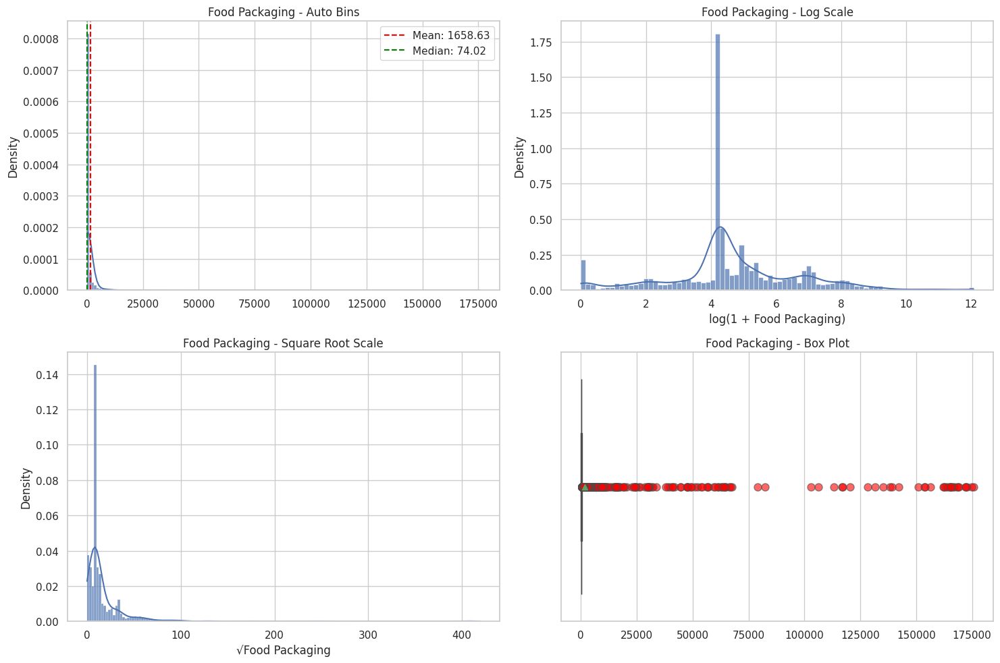

In [71]:
plot_distribution(df["Food Packaging"].dropna().values, "Food Packaging")

In [72]:
df["Food Packaging"].describe().round(2)

count      6965.00
mean       1658.63
std       11481.34
min           0.00
25%          67.63
50%          74.02
75%         281.79
max      175741.31
Name: Food Packaging, dtype: float64

In [73]:
print(
    f"Percent of missing values in Food Packaging variable: {(df['Food Packaging'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Food Packaging variable: {df['Food Packaging'].isna().sum()}"
)

Percent of missing values in Food Packaging variable: 0.0%
Absolute number of missing values in Food Packaging variable: 0


In [74]:
outliers_report(df["Food Packaging"].dropna().values)

Outliers Report:
Q1: 67.63
Q3: 281.79
IQR: 214.16
Lower fence: -253.61
Upper fence: 603.03
Number of Statistical Outlier Candidates: 1358
Percent of Statistical Outlier Candidates: 19.5%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [172122.99 172153.41 172690.28 174770.56 175741.31]


---

##### Agrifood Systems Waste Disposal

Emissions from waste disposal in the agrifood system.

<Figure size 1200x800 with 0 Axes>

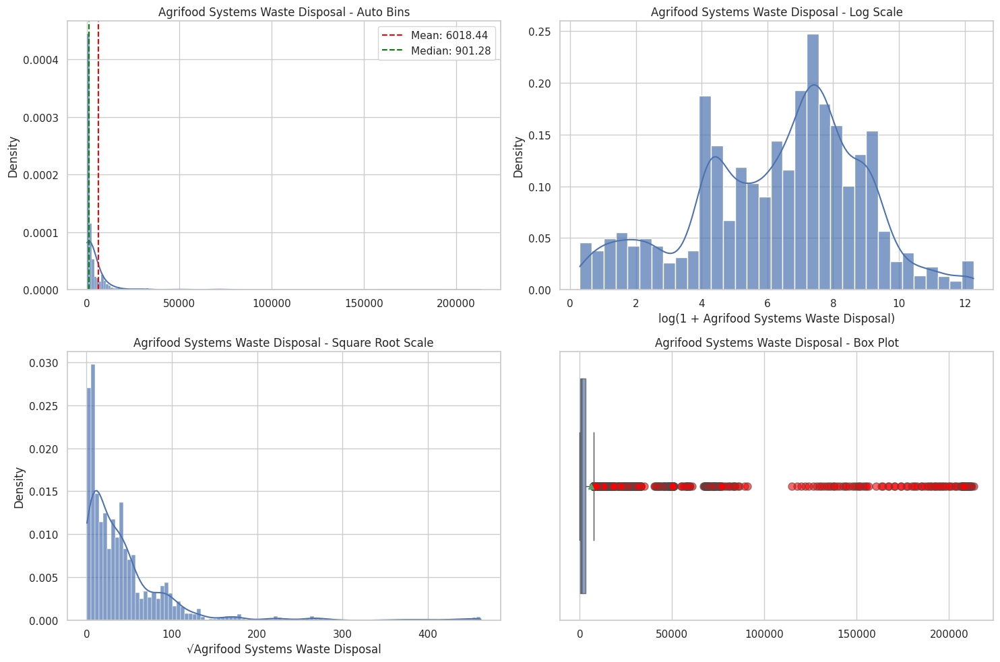

In [75]:
plot_distribution(
    df["Agrifood Systems Waste Disposal"].dropna().values,
    "Agrifood Systems Waste Disposal",
)

In [76]:
df["Agrifood Systems Waste Disposal"].describe().round(2)

count      6965.00
mean       6018.44
std       22156.74
min           0.34
25%          86.68
50%         901.28
75%        3006.44
max      213289.70
Name: Agrifood Systems Waste Disposal, dtype: float64

In [77]:
print(
    f"Percent of missing values in Agrifood Systems Waste Disposal variable: {(df['Agrifood Systems Waste Disposal'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Agrifood Systems Waste Disposal variable: {df['Agrifood Systems Waste Disposal'].isna().sum()}"
)

Percent of missing values in Agrifood Systems Waste Disposal variable: 0.0%
Absolute number of missing values in Agrifood Systems Waste Disposal variable: 0


In [78]:
outliers_report(df["Agrifood Systems Waste Disposal"].dropna().values)

Outliers Report:
Q1: 86.68
Q3: 3006.44
IQR: 2919.76
Lower fence: -4292.96
Upper fence: 7386.08
Number of Statistical Outlier Candidates: 1028
Percent of Statistical Outlier Candidates: 14.76%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [211666.05 211723.34 211974.98 212281.   213289.7 ]


---

##### Food Processing

Emissions from processing food products.

<Figure size 1200x800 with 0 Axes>

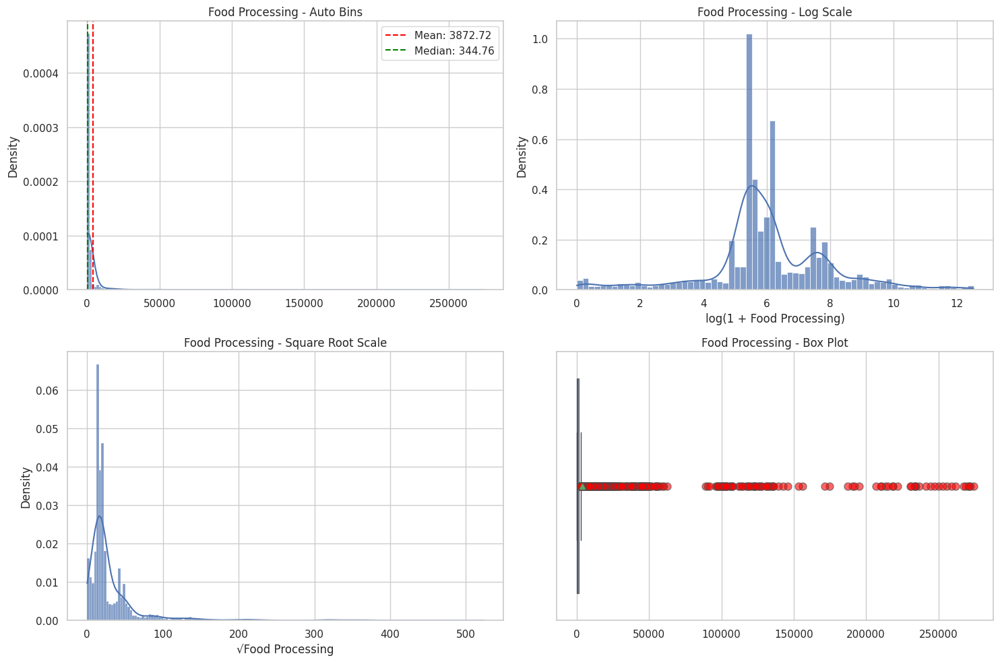

In [79]:
plot_distribution(df["Food Processing"].dropna().values, "Food Processing")

In [80]:
df["Food Processing"].describe().round(2)

count      6965.00
mean       3872.72
std       19838.22
min           0.00
25%         209.59
50%         344.76
75%        1236.91
max      274253.51
Name: Food Processing, dtype: float64

In [81]:
print(
    f"Percent of missing values in Food Processing variable: {(df['Food Processing'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Food Processing variable: {df['Food Processing'].isna().sum()}"
)

Percent of missing values in Food Processing variable: 0.0%
Absolute number of missing values in Food Processing variable: 0


In [82]:
outliers_report(df["Food Processing"].dropna().values)

Outliers Report:
Q1: 209.59
Q3: 1236.91
IQR: 1027.33
Lower fence: -1331.4
Upper fence: 2777.9
Number of Statistical Outlier Candidates: 851
Percent of Statistical Outlier Candidates: 12.22%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [268919.3  270746.25 271002.75 272130.68 274253.51]


---

##### Fertilizers Manufacturing

Emissions from the production of fertilizers.

<Figure size 1200x800 with 0 Axes>

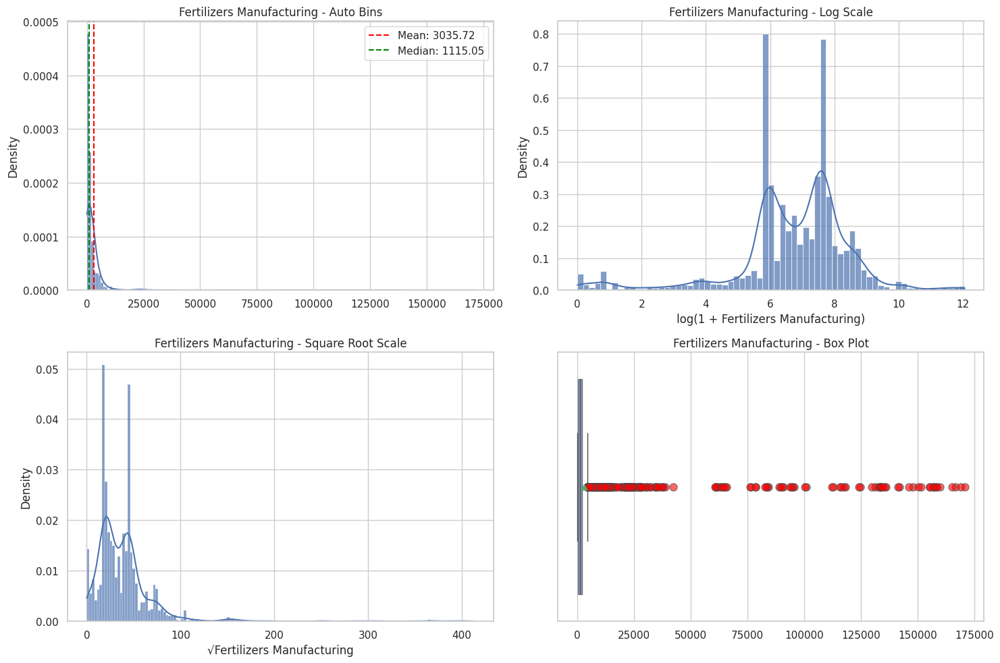

In [83]:
plot_distribution(
    df["Fertilizers Manufacturing"].dropna().values, "Fertilizers Manufacturing"
)

In [84]:
df["Fertilizers Manufacturing"].describe().round(2)

count      6965.00
mean       3035.72
std       11693.03
min           0.00
25%         360.36
50%        1115.05
75%        2024.87
max      170826.42
Name: Fertilizers Manufacturing, dtype: float64

In [85]:
print(
    f"Percent of missing values in Fertilizers Manufacturing variable: {(df['Fertilizers Manufacturing'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Fertilizers Manufacturing variable: {df['Fertilizers Manufacturing'].isna().sum()}"
)

Percent of missing values in Fertilizers Manufacturing variable: 0.0%
Absolute number of missing values in Fertilizers Manufacturing variable: 0


In [86]:
outliers_report(df["Fertilizers Manufacturing"].dropna().values)

Outliers Report:
Q1: 360.36
Q3: 2024.87
IQR: 1664.51
Lower fence: -2136.41
Upper fence: 4521.64
Number of Statistical Outlier Candidates: 778
Percent of Statistical Outlier Candidates: 11.17%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [159874.96 165323.76 166750.43 169173.96 170826.42]


---

##### IPPU

Emissions from industrial processes and product use.

<Figure size 1200x800 with 0 Axes>

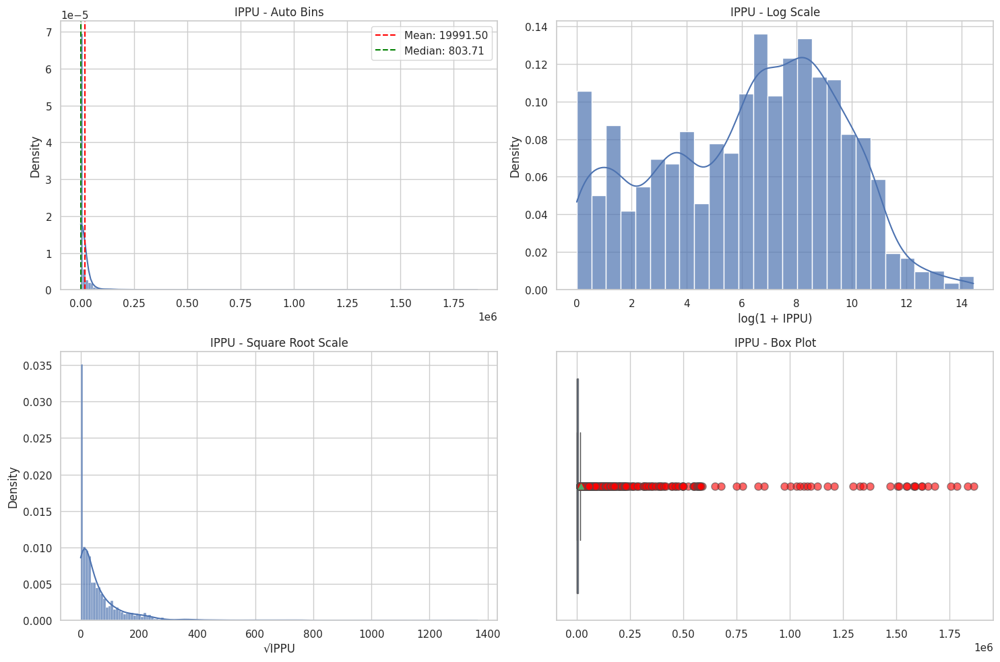

In [87]:
plot_distribution(df["IPPU"].dropna().values, "IPPU")

In [88]:
df["IPPU"].describe().round(2)

count       6222.00
mean       19991.50
std       111420.85
min            0.00
25%           39.03
50%          803.71
75%         6155.17
max      1861640.66
Name: IPPU, dtype: float64

In [89]:
print(
    f"Percent of missing values in IPPU variable: {(df['IPPU'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(f"Absolute number of missing values in IPPU variable: {df['IPPU'].isna().sum()}")

Percent of missing values in IPPU variable: 10.67%
Absolute number of missing values in IPPU variable: 743


In [90]:
outliers_report(df["IPPU"].dropna().values)

Outliers Report:
Q1: 39.03
Q3: 6155.17
IQR: 6116.14
Lower fence: -9135.18
Upper fence: 15329.39
Number of Statistical Outlier Candidates: 955
Percent of Statistical Outlier Candidates: 15.35%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [1678880.37 1755039.12 1783793.23 1833401.21 1861640.66]


---

##### Manure applied to Soils

Emissions from applying animal manure to agricultural soils.

<Figure size 1200x800 with 0 Axes>

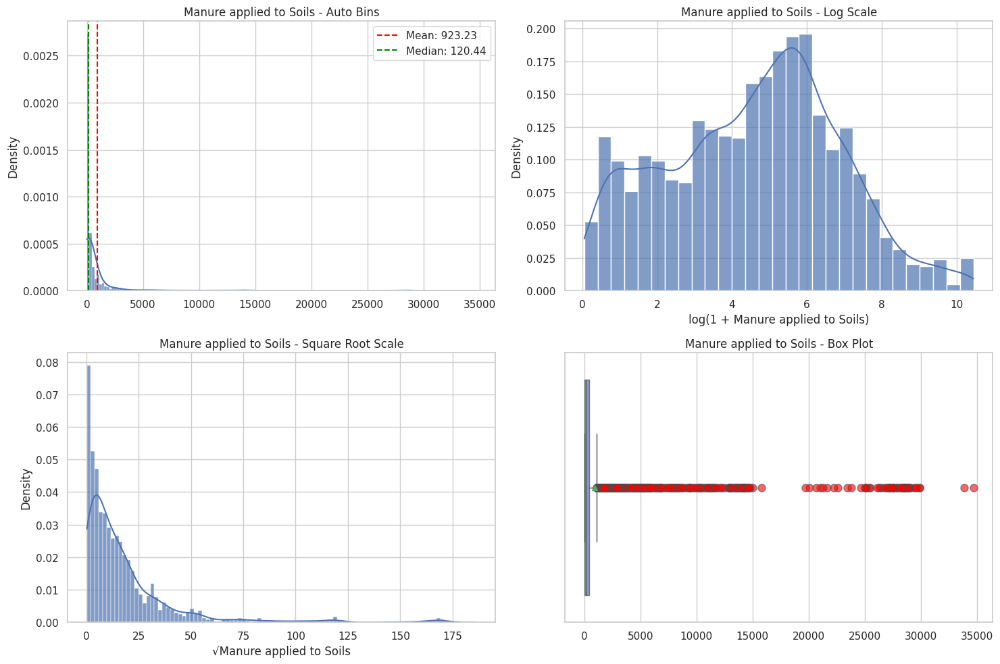

In [91]:
plot_distribution(
    df["Manure applied to Soils"].dropna().values, "Manure applied to Soils"
)

In [92]:
df["Manure applied to Soils"].describe().round(2)

count     6037.00
mean       923.23
std       3226.99
min          0.05
25%         16.30
50%        120.44
75%        460.12
max      34677.36
Name: Manure applied to Soils, dtype: float64

In [93]:
print(
    f"Percent of missing values in Manure applied to Soils variable: {(df['Manure applied to Soils'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Manure applied to Soils variable: {df['Manure applied to Soils'].isna().sum()}"
)

Percent of missing values in Manure applied to Soils variable: 13.32%
Absolute number of missing values in Manure applied to Soils variable: 928


In [94]:
outliers_report(df["Manure applied to Soils"].dropna().values)

Outliers Report:
Q1: 16.3
Q3: 460.12
IQR: 443.82
Lower fence: -649.42
Upper fence: 1125.85
Number of Statistical Outlier Candidates: 796
Percent of Statistical Outlier Candidates: 13.19%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [29558.85 29865.25 29865.39 33855.97 34677.36]


---

##### Manure left on Pasture

Emissions from animal manure on pasture or grazing land.

<Figure size 1200x800 with 0 Axes>

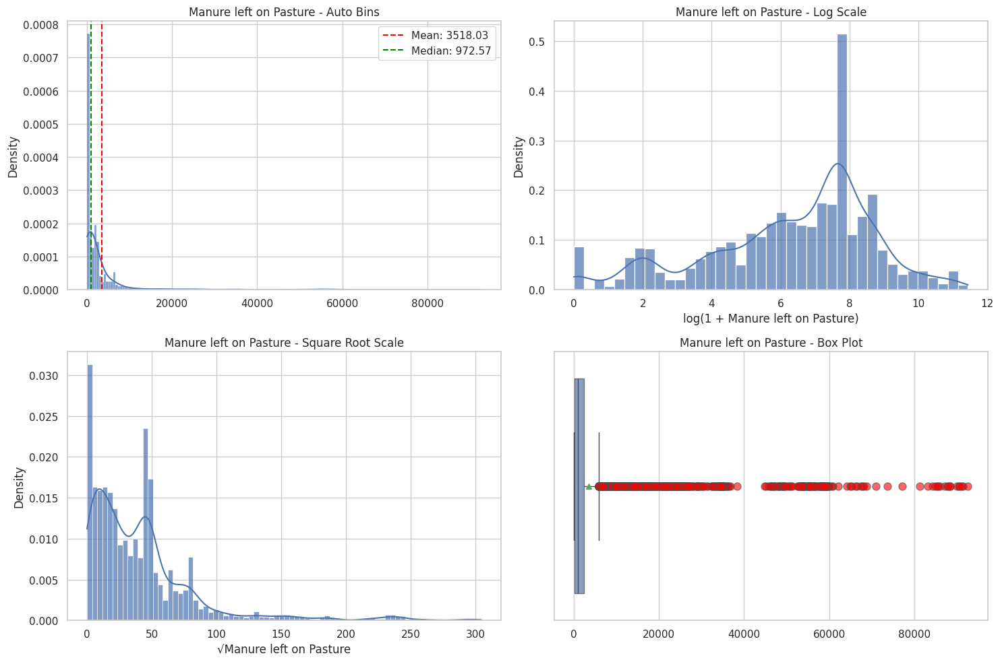

In [95]:
plot_distribution(
    df["Manure left on Pasture"].dropna().values, "Manure left on Pasture"
)

In [96]:
df["Manure left on Pasture"].describe().round(2)

count     6965.00
mean      3518.03
std       9103.56
min          0.00
25%        139.67
50%        972.57
75%       2430.79
max      92630.76
Name: Manure left on Pasture, dtype: float64

In [97]:
print(
    f"Percent of missing values in Manure left on Pasture variable: {(df['Manure left on Pasture'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Manure left on Pasture variable: {df['Manure left on Pasture'].isna().sum()}"
)

Percent of missing values in Manure left on Pasture variable: 0.0%
Absolute number of missing values in Manure left on Pasture variable: 0


In [98]:
outliers_report(df["Manure left on Pasture"].dropna().values)

Outliers Report:
Q1: 139.67
Q3: 2430.79
IQR: 2291.12
Lower fence: -3297.01
Upper fence: 5867.48
Number of Statistical Outlier Candidates: 911
Percent of Statistical Outlier Candidates: 13.08%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [90508.86 90699.89 91165.53 91482.3  92630.76]


---

##### Manure Management

Emissions from managing and treating animal manure.

<Figure size 1200x800 with 0 Axes>

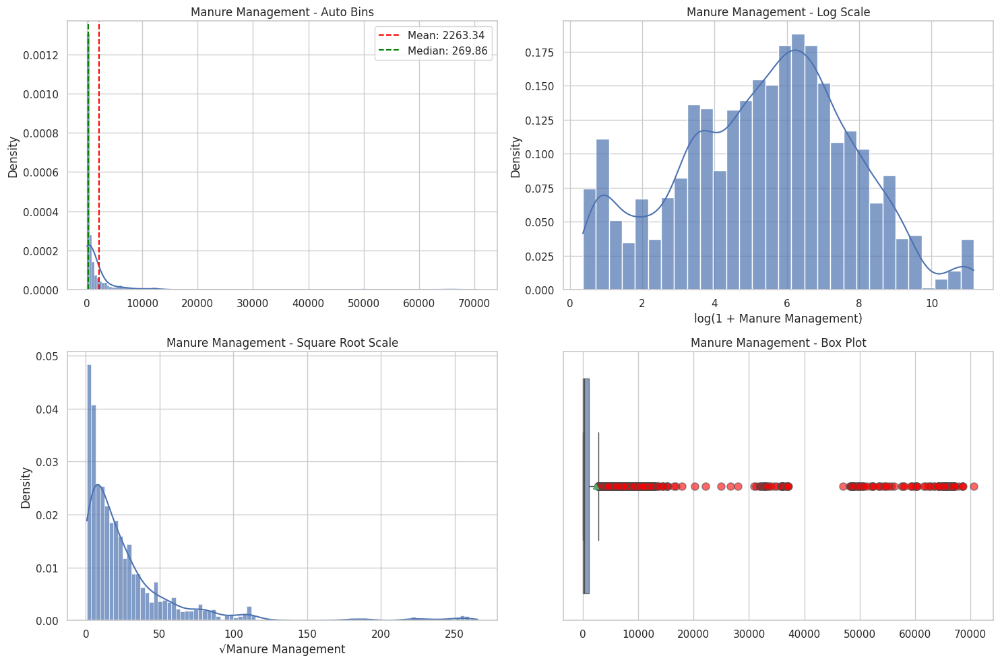

In [99]:
plot_distribution(df["Manure Management"].dropna().values, "Manure Management")

In [100]:
df["Manure Management"].describe().round(2)

count     6037.00
mean      2263.34
std       7980.54
min          0.43
25%         37.63
50%        269.86
75%       1126.82
max      70592.65
Name: Manure Management, dtype: float64

In [101]:
print(
    f"Percent of missing values in Manure Management variable: {(df['Manure Management'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Manure Management variable: {df['Manure Management'].isna().sum()}"
)

Percent of missing values in Manure Management variable: 13.32%
Absolute number of missing values in Manure Management variable: 928


In [102]:
outliers_report(df["Manure Management"].dropna().values)

Outliers Report:
Q1: 37.63
Q3: 1126.82
IQR: 1089.19
Lower fence: -1596.15
Upper fence: 2760.6
Number of Statistical Outlier Candidates: 850
Percent of Statistical Outlier Candidates: 14.08%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [67787.87 68487.35 68496.85 68645.05 70592.65]


---

##### Fires in organic soils

Emissions from fires in organic soils.

<Figure size 1200x800 with 0 Axes>

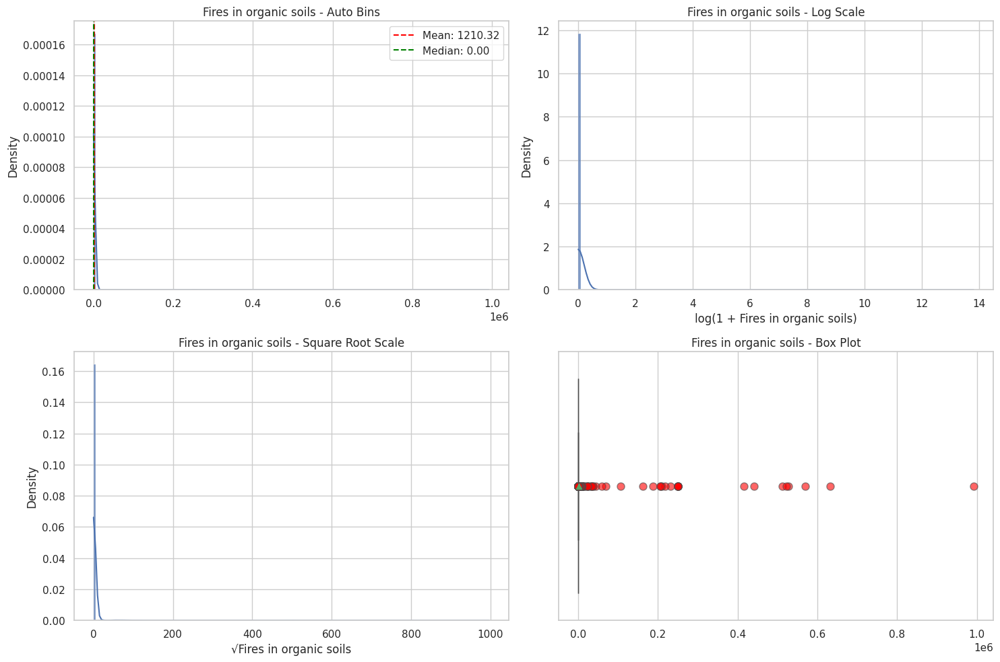

In [103]:
plot_distribution(
    df["Fires in organic soils"].dropna().values, "Fires in organic soils"
)

In [104]:
df["Fires in organic soils"].describe().round(2)

count      6965.00
mean       1210.32
std       22669.85
min           0.00
25%           0.00
50%           0.00
75%           0.00
max      991717.54
Name: Fires in organic soils, dtype: float64

In [105]:
print(
    f"Percent of missing values in Fires in organic soils variable: {(df['Fires in organic soils'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Fires in organic soils variable: {df['Fires in organic soils'].isna().sum()}"
)

Percent of missing values in Fires in organic soils variable: 0.0%
Absolute number of missing values in Fires in organic soils variable: 0


In [106]:
outliers_report(df["Fires in organic soils"].dropna().values)

Outliers Report:
Q1: 0.0
Q3: 0.0
IQR: 0.0
Lower fence: 0.0
Upper fence: 0.0
Number of Statistical Outlier Candidates: 309
Percent of Statistical Outlier Candidates: 4.44%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [523099.07 527497.85 569991.24 631416.75 991717.54]


---

##### Fires in humid tropical forests

Emissions from fires in humid tropical forests.

<Figure size 1200x800 with 0 Axes>

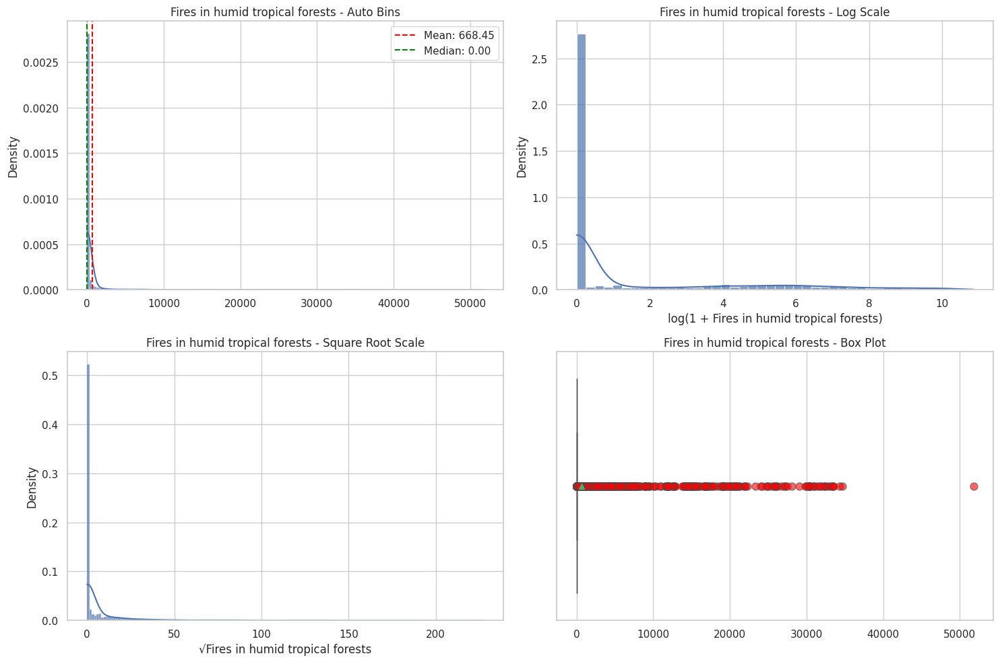

In [107]:
plot_distribution(
    df["Fires in humid tropical forests"].dropna().values,
    "Fires in humid tropical forests",
)

In [108]:
df["Fires in humid tropical forests"].describe().round(2)

count     6810.00
mean       668.45
std       3264.88
min          0.00
25%          0.00
50%          0.00
75%          9.58
max      51771.26
Name: Fires in humid tropical forests, dtype: float64

In [109]:
print(
    f"Percent of missing values in Fires in humid tropical forests variable: {(df['Fires in humid tropical forests'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Fires in humid tropical forests variable: {df['Fires in humid tropical forests'].isna().sum()}"
)

Percent of missing values in Fires in humid tropical forests variable: 2.23%
Absolute number of missing values in Fires in humid tropical forests variable: 155


In [110]:
outliers_report(df["Fires in humid tropical forests"].dropna().values)

Outliers Report:
Q1: 0.0
Q3: 9.58
IQR: 9.58
Lower fence: -14.37
Upper fence: 23.94
Number of Statistical Outlier Candidates: 1555
Percent of Statistical Outlier Candidates: 22.83%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [33396.75 33527.45 34332.26 34679.92 51771.26]


---

##### On-farm energy use

Energy consumption on farms.

<Figure size 1200x800 with 0 Axes>

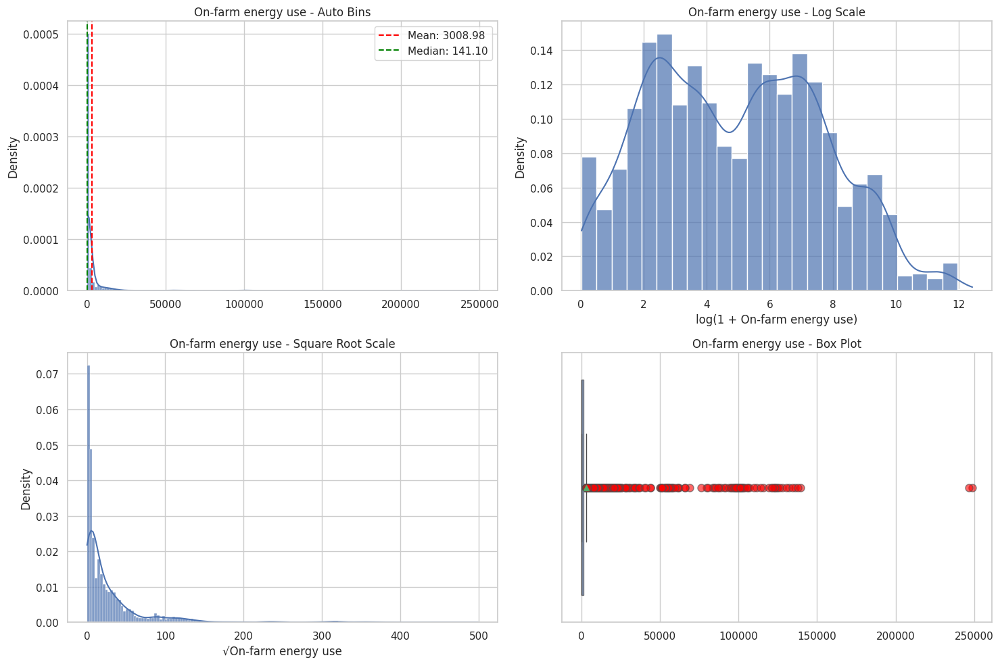

In [111]:
plot_distribution(df["On-farm energy use"].dropna().values, "On-farm energy use")

In [112]:
df["On-farm energy use"].describe().round(2)

count      6009.00
mean       3008.98
std       12637.86
min           0.03
25%          13.29
50%         141.10
75%        1136.93
max      248879.18
Name: On-farm energy use, dtype: float64

In [113]:
print(
    f"Percent of missing values in On-farm energy use variable: {(df['On-farm energy use'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in On-farm energy use variable: {df['On-farm energy use'].isna().sum()}"
)

Percent of missing values in On-farm energy use variable: 13.73%
Absolute number of missing values in On-farm energy use variable: 956


In [114]:
outliers_report(df["On-farm energy use"].dropna().values)

Outliers Report:
Q1: 13.29
Q3: 1136.93
IQR: 1123.63
Lower fence: -1672.16
Upper fence: 2822.38
Number of Statistical Outlier Candidates: 874
Percent of Statistical Outlier Candidates: 14.54%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [136025.13 137830.45 139388.92 246785.5  248879.18]


---

##### Rural population

Number of people living in rural areas.

<Figure size 1200x800 with 0 Axes>

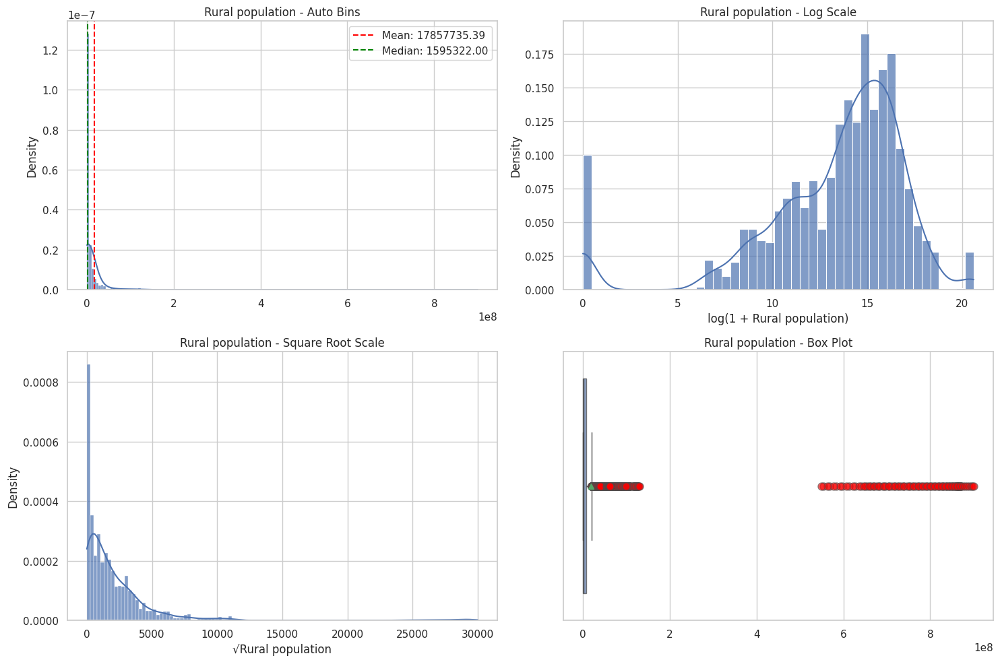

In [115]:
plot_distribution(df["Rural population"].dropna().values, "Rural population")

In [116]:
df["Rural population"].describe().round(2)

count    6.965000e+03
mean     1.785774e+07
std      8.901521e+07
min      0.000000e+00
25%      9.731100e+04
50%      1.595322e+06
75%      8.177340e+06
max      9.000991e+08
Name: Rural population, dtype: float64

In [117]:
print(
    f"Percent of missing values in Rural population variable: {(df['Rural population'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Rural population variable: {df['Rural population'].isna().sum()}"
)

Percent of missing values in Rural population variable: 0.0%
Absolute number of missing values in Rural population variable: 0


In [118]:
outliers_report(df["Rural population"].dropna().values)

Outliers Report:
Q1: 97311.0
Q3: 8177340.0
IQR: 8080029.0
Lower fence: -12022732.5
Upper fence: 20297383.5
Number of Statistical Outlier Candidates: 758
Percent of Statistical Outlier Candidates: 10.88%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [8.84779655e+08 8.89216746e+08 8.93272090e+08 8.96909218e+08
 9.00099113e+08]


---

##### Urban population

Number of people living in urban areas.

<Figure size 1200x800 with 0 Axes>

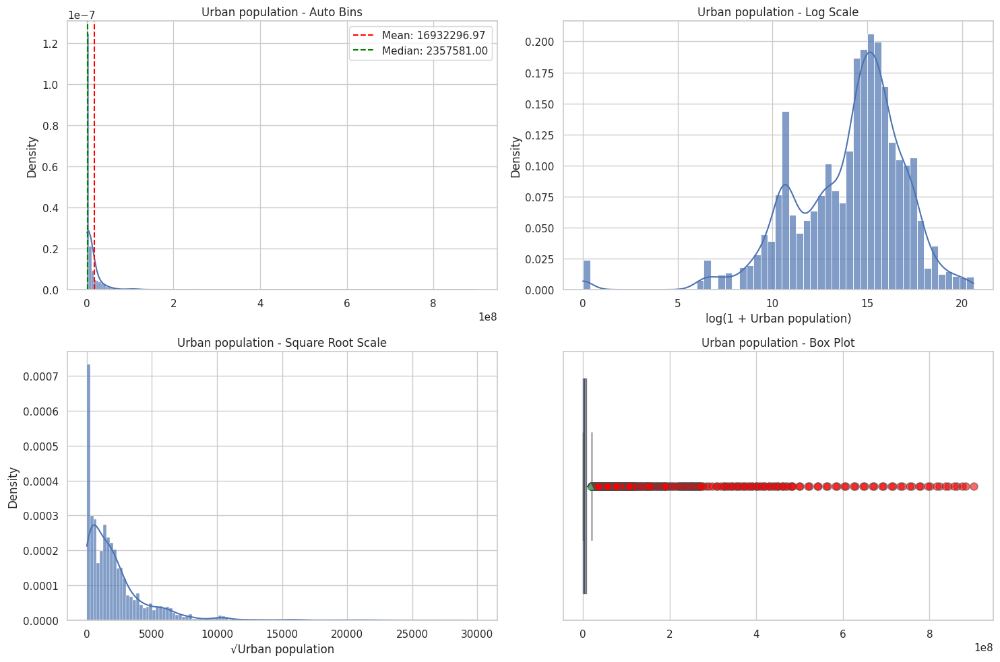

In [119]:
plot_distribution(df["Urban population"].dropna().values, "Urban population")

In [120]:
df["Urban population"].describe().round(2)

count    6.965000e+03
mean     1.693230e+07
std      6.574362e+07
min      0.000000e+00
25%      2.173860e+05
50%      2.357581e+06
75%      8.277123e+06
max      9.020778e+08
Name: Urban population, dtype: float64

In [121]:
print(
    f"Percent of missing values in Urban population variable: {(df['Urban population'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Urban population variable: {df['Urban population'].isna().sum()}"
)

Percent of missing values in Urban population variable: 0.0%
Absolute number of missing values in Urban population variable: 0


In [122]:
outliers_report(df["Urban population"].dropna().values)

Outliers Report:
Q1: 217386.0
Q3: 8277123.0
IQR: 8059737.0
Lower fence: -11872219.5
Upper fence: 20366728.5
Number of Statistical Outlier Candidates: 1001
Percent of Statistical Outlier Candidates: 14.37%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [8.56409297e+08 8.63601691e+08 8.75075919e+08 8.83204937e+08
 9.02077760e+08]


---

##### Total Population - Male

Total number of male individuals in the population.

<Figure size 1200x800 with 0 Axes>

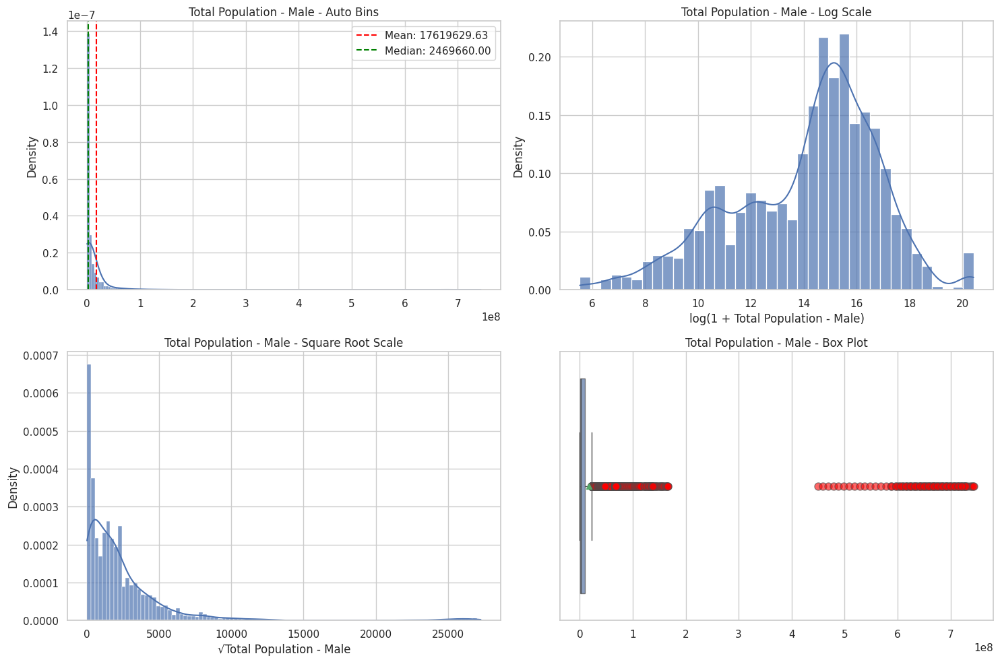

In [123]:
plot_distribution(
    df["Total Population - Male"].dropna().values, "Total Population - Male"
)

In [124]:
df["Total Population - Male"].describe().round(2)

count    6.965000e+03
mean     1.761963e+07
std      7.603993e+07
min      2.500000e+02
25%      2.013260e+05
50%      2.469660e+06
75%      9.075924e+06
max      7.435866e+08
Name: Total Population - Male, dtype: float64

In [125]:
print(
    f"Percent of missing values in Total Population - Male variable: {(df['Total Population - Male'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Total Population - Male variable: {df['Total Population - Male'].isna().sum()}"
)

Percent of missing values in Total Population - Male variable: 0.0%
Absolute number of missing values in Total Population - Male variable: 0


In [126]:
outliers_report(df["Total Population - Male"].dropna().values)

Outliers Report:
Q1: 201326.0
Q3: 9075924.0
IQR: 8874598.0
Lower fence: -13110571.0
Upper fence: 22387821.0
Number of Statistical Outlier Candidates: 826
Percent of Statistical Outlier Candidates: 11.86%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [7.32792543e+08 7.36919223e+08 7.40159360e+08 7.42358552e+08
 7.43586579e+08]


---

##### Total Population - Female

Total number of female individuals in the population.

<Figure size 1200x800 with 0 Axes>

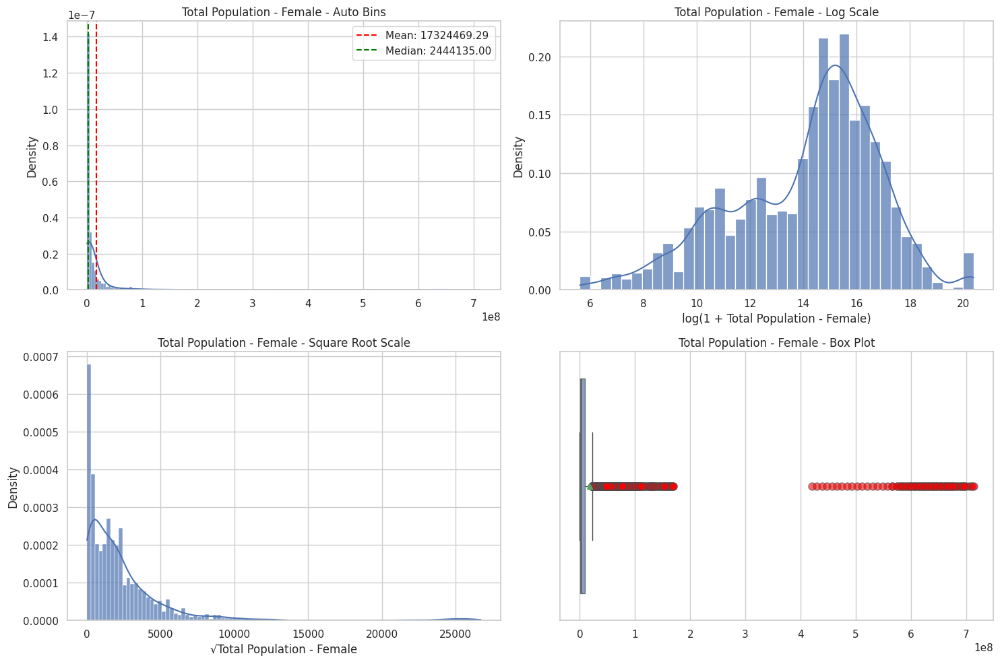

In [127]:
plot_distribution(
    df["Total Population - Female"].dropna().values, "Total Population - Female"
)

In [128]:
df["Total Population - Female"].describe().round(2)

count    6.965000e+03
mean     1.732447e+07
std      7.251711e+07
min      2.700000e+02
25%      2.078900e+05
50%      2.444135e+06
75%      9.112588e+06
max      7.133419e+08
Name: Total Population - Female, dtype: float64

In [129]:
print(
    f"Percent of missing values in Total Population - Female variable: {(df['Total Population - Female'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Total Population - Female variable: {df['Total Population - Female'].isna().sum()}"
)

Percent of missing values in Total Population - Female variable: 0.0%
Absolute number of missing values in Total Population - Female variable: 0


In [130]:
outliers_report(df["Total Population - Female"].dropna().values)

Outliers Report:
Q1: 207890.0
Q3: 9112588.0
IQR: 8904698.0
Lower fence: -13149157.0
Upper fence: 22469635.0
Number of Statistical Outlier Candidates: 858
Percent of Statistical Outlier Candidates: 12.32%
Top-5 below Lower fence Outliers: []
Top-5 above Upper fence Outliers: [7.00754224e+08 7.05121887e+08 7.08768840e+08 7.11442990e+08
 7.13341908e+08]


---

##### total_emission

Total greenhouse gas emissions from various sources.

<Figure size 1200x800 with 0 Axes>

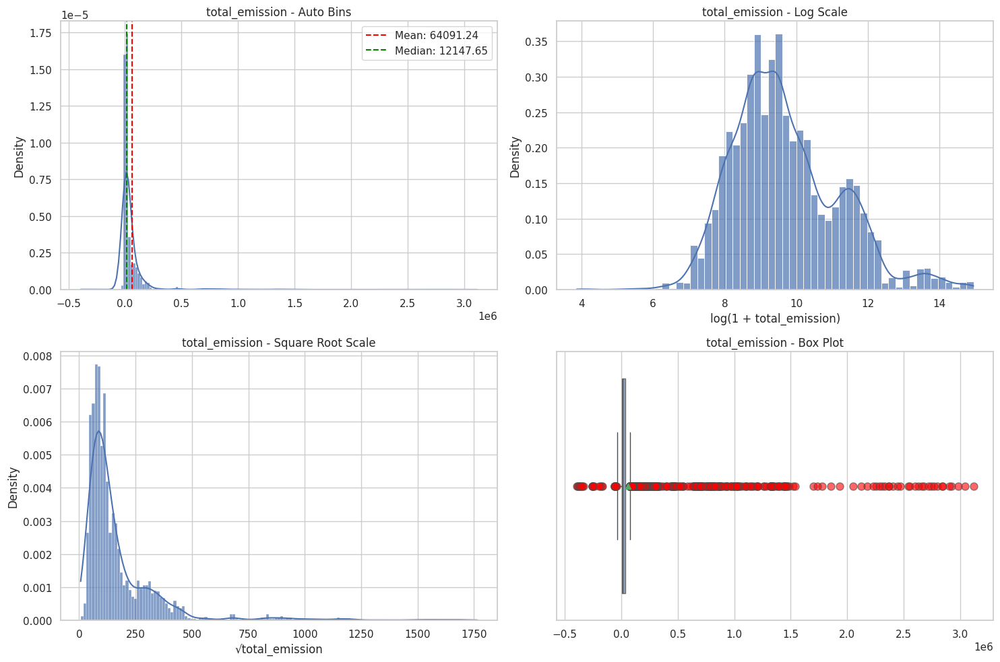

In [131]:
plot_distribution(df["total_emission"].dropna().values, "total_emission")

In [132]:
df["total_emission"].describe().round(2)

count       6965.00
mean       64091.24
std       228312.96
min      -391884.06
25%         5221.24
50%        12147.65
75%        35139.73
max      3115113.75
Name: total_emission, dtype: float64

In [133]:
print(
    f"Percent of missing values in total_emission variable: {(df['total_emission'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in total_emission variable: {df['total_emission'].isna().sum()}"
)

Percent of missing values in total_emission variable: 0.0%
Absolute number of missing values in total_emission variable: 0


In [134]:
outliers_report(df["total_emission"].dropna().values)

Outliers Report:
Q1: 5221.24
Q3: 35139.73
IQR: 29918.49
Lower fence: -39656.49
Upper fence: 80017.46
Number of Statistical Outlier Candidates: 1142
Percent of Statistical Outlier Candidates: 16.4%
Top-5 below Lower fence Outliers: [-391884.06 -387630.12 -378502.97 -375376.67 -365474.32]
Top-5 above Upper fence Outliers: [2902693.11 2919286.26 2978585.26 3039089.09 3115113.75]


---

##### Average Temperature °C

The average increasing of temperature (by year) in degrees Celsius

<Figure size 1200x800 with 0 Axes>

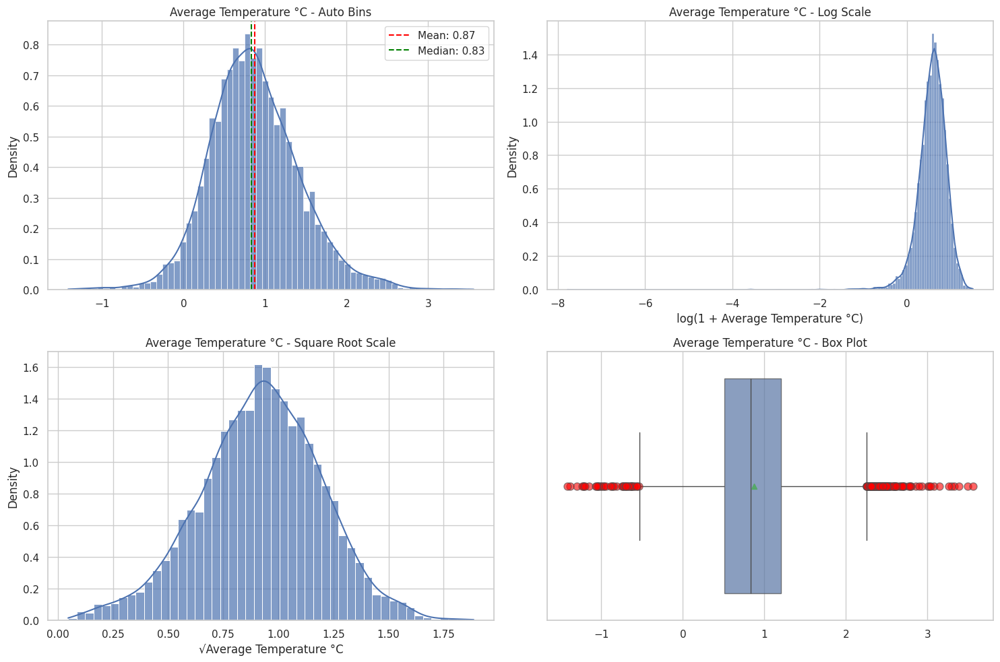

In [135]:
plot_distribution(
    df["Average Temperature °C"].dropna().values, "Average Temperature °C"
)

In [136]:
df["Average Temperature °C"].describe().round(2)

count    6965.00
mean        0.87
std         0.56
min        -1.42
25%         0.51
50%         0.83
75%         1.21
max         3.56
Name: Average Temperature °C, dtype: float64

In [137]:
print(
    f"Percent of missing values in Average Temperature °C variable: {(df['Average Temperature °C'].isna().sum() / df.shape[0] * 100).round(2)}%"
)
print(
    f"Absolute number of missing values in Average Temperature °C variable: {df['Average Temperature °C'].isna().sum()}"
)

Percent of missing values in Average Temperature °C variable: 0.0%
Absolute number of missing values in Average Temperature °C variable: 0


In [138]:
outliers_report(df["Average Temperature °C"].dropna().values)

Outliers Report:
Q1: 0.51
Q3: 1.21
IQR: 0.7
Lower fence: -0.53
Upper fence: 2.25
Number of Statistical Outlier Candidates: 155
Percent of Statistical Outlier Candidates: 2.23%
Top-5 below Lower fence Outliers: [-1.42 -1.38 -1.3  -1.24 -1.22]
Top-5 above Upper fence Outliers: [3.3  3.33 3.38 3.5  3.56]


---

## 1.2 - Multivariate Analysis

In [139]:
df_grouped = (
    df[(df["Year"] > 2000) & (df["Area"] != "China, mainland")]
    .groupby("Area", as_index=False)["total_emission"]
    .sum()
    .sort_values(by="total_emission", ascending=False)
    .round()
    .head(20)
)

In [140]:
df_grouped["Cumulative_Percentage"] = (
    df_grouped["total_emission"].cumsum() / df_grouped["total_emission"].sum() * 100
).round(2)

In [141]:
# Create subplots with a secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add the bar trace (Frequency)
fig.add_trace(
    go.Bar(
        x=df_grouped["Area"],
        y=df_grouped["total_emission"],
        name="total_emission",
        marker_color="rgb(34,163,192)",  # Customize bar color
    ),
    secondary_y=False,
)

# Add the line trace (Cumulative Percentage)
fig.add_trace(
    go.Scatter(
        x=df_grouped["Area"],
        y=df_grouped["Cumulative_Percentage"],
        name="Cumulative Percentage",
        mode="lines+markers",  # Add points to the line
        marker=dict(color="rgb(255,7,7)", size=8),
        line=dict(width=2.5),
    ),
    secondary_y=True,
)

# Customize the layout
fig.update_layout(
    title_text="Pareto Chart of Top 20 Areas by Total Emission (Post-2000)",
    xaxis_title="Areas",
    yaxis_title="Total Emission (kt)",
    yaxis2_title="Cumulative Percentage (%)",
    legend=dict(x=0.8, y=1.2, orientation="h"),  # Adjust legend position
    width=900,
    height=600,
)

# Ensure the secondary y-axis goes from 0 to 100%
fig.update_yaxes(range=[0, 105], secondary_y=True)

# Display the chart
fig.show()

In [142]:
df_grouped = (
    df[(df["Area"] != "China, mainland")]
    .groupby("Year", as_index=False)
    .agg({"total_emission": "sum", "Average Temperature °C": "mean"})
    .sort_values(by="Year", ascending=True)
    .round(2)
)

In [143]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x=df_grouped["Year"],
        y=df_grouped["total_emission"],
        name="Total Emission",
        yaxis="y1",
    )
)
fig.add_trace(
    go.Scatter(
        x=df_grouped["Year"],
        y=df_grouped["Average Temperature °C"],
        name="Average Temperature °C",
        yaxis="y2",
    )
)

fig.update_layout(
    title_text=f"Total Emission and Average Temperature increase in the World by Year",
    yaxis=dict(
        title=dict(text="Total Emission (kt)"),
        autoshift=True,
    ),
    yaxis2=dict(
        title=dict(text="Average Temperature Increase"),
        overlaying="y",
        side="right",
        autoshift=True,
        ticksuffix="°C",
    ),
    legend=dict(x=0.8, y=1.2, orientation="h"),
)

fig.update_xaxes(title_text="Year")
fig.show()

In [144]:
df_grouped = (
    df[(df["Area"] != "China, mainland")]
    .groupby("Year", as_index=False)
    .agg({"Urban population": "sum", "Average Temperature °C": "mean"})
    .sort_values(by="Year", ascending=True)
    .round(2)
)

In [145]:
df_grouped["Urban population_billion"] = (
    df_grouped["Urban population"] / 1_000_000_000
).round(2)

In [146]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x=df_grouped["Year"],
        y=df_grouped["Urban population_billion"],
        name="Urban Population (Billion)",
        yaxis="y1",
    )
)
fig.add_trace(
    go.Scatter(
        x=df_grouped["Year"],
        y=df_grouped["Average Temperature °C"],
        name="Average Temperature °C",
        yaxis="y2",
    )
)

fig.update_layout(
    title_text=f"Urban Population and Average Temperature increase in the World by Year",
    yaxis=dict(
        title=dict(text="Urban Population (Billion)"),
        autoshift=True,
    ),
    yaxis2=dict(
        title=dict(text="Average Temperature Increase"),
        overlaying="y",
        side="right",
        autoshift=True,
        ticksuffix="°C",
    ),
    legend=dict(x=0.8, y=1.2, orientation="h"),
)

fig.update_xaxes(title_text="Year")
fig.show()

In [147]:
df_grouped = (
    df[
        (
            df["Area"].isin(
                ["China", "Brazil", "United States of America", "India", "Indonesia"]
            )
        )
    ]
    .groupby(["Year", "Area"], as_index=False)["total_emission"]
    .sum()
    .sort_values(by=["Year", "total_emission"], ascending=True)
    .round(2)
)

In [148]:
df_grouped.head()

,Year,Area,total_emission
2,1990,India,262529.50
4,1990,United States of America,463050.94
1,1990,China,803112.70
3,1990,Indonesia,864475.08
0,1990,Brazil,1316385.30


In [149]:
fig = px.line(
    df_grouped,
    x="Year",
    y="total_emission",
    color="Area",
    title="Total Emission by Top 5 Polluting Areas Over Years",
    markers=True,
)
fig.show()

## 1.3 - Correlation

In [150]:
def plot_spearman_heatmap(df, title, mask_threshold=0.5):
    df = df.select_dtypes(include=np.number)
    df = df.dropna()

    # Calculate the Spearman correlation matrix
    spearman_corr = df.corr(method="spearman")

    # Create a mask for values between -0.5 and 0.5
    mask = np.logical_and(
        spearman_corr > -mask_threshold, spearman_corr < mask_threshold
    )
    mask = mask.values
    mask[np.triu_indices_from(mask)] = True

    # Set up the matplotlib figure
    plt.figure(figsize=(22, 18))

    # Draw the heatmap with the mask applied
    sns.heatmap(
        spearman_corr,
        annot=True,
        cmap="coolwarm",
        vmin=-1,
        vmax=1,
        mask=mask,
        square=True,
        cbar_kws={"shrink": 0.75},
        linecolor="grey",
        linewidths=0.65,
    )

    # Add title and adjust the layout
    plt.title(f"Spearman correlation heatmap - {title}", fontsize=10)
    plt.xlabel(xlabel="variable", labelpad=12)
    plt.ylabel(ylabel="variable", labelpad=12)
    plt.tight_layout()

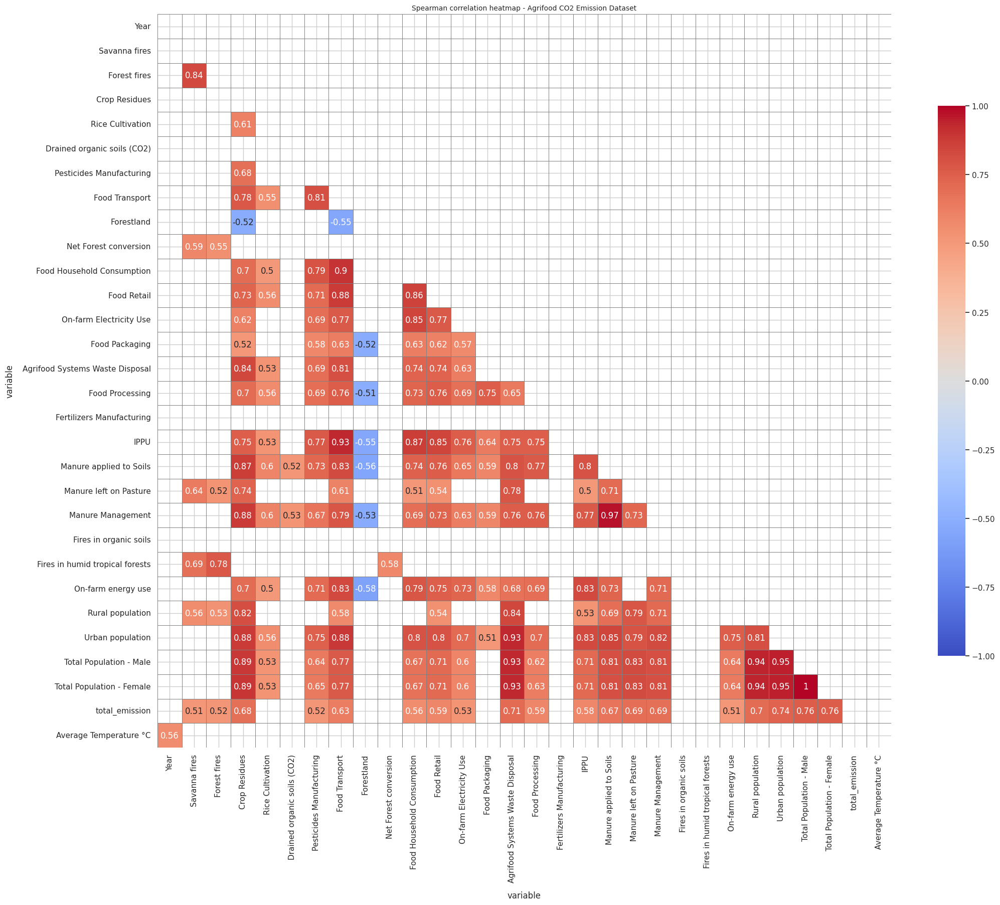

In [151]:
plot_spearman_heatmap(df, "Agrifood CO2 Emission Dataset", mask_threshold=0.5)

In [152]:
df.isna().sum()

Area                                  0
Year                                  0
Savanna fires                        31
Forest fires                         93
Crop Residues                      1389
Rice Cultivation                      0
Drained organic soils (CO2)           0
Pesticides Manufacturing              0
Food Transport                        0
Forestland                          493
Net Forest conversion               493
Food Household Consumption          473
Food Retail                           0
On-farm Electricity Use               0
Food Packaging                        0
Agrifood Systems Waste Disposal       0
Food Processing                       0
Fertilizers Manufacturing             0
IPPU                                743
Manure applied to Soils             928
Manure left on Pasture                0
Manure Management                   928
Fires in organic soils                0
Fires in humid tropical forests     155
On-farm energy use                  956


In [153]:
df.columns

Index(['Area', 'Year', 'Savanna fires', 'Forest fires', 'Crop Residues',
       'Rice Cultivation', 'Drained organic soils (CO2)',
       'Pesticides Manufacturing', 'Food Transport', 'Forestland',
       'Net Forest conversion', 'Food Household Consumption', 'Food Retail',
       'On-farm Electricity Use', 'Food Packaging',
       'Agrifood Systems Waste Disposal', 'Food Processing',
       'Fertilizers Manufacturing', 'IPPU', 'Manure applied to Soils',
       'Manure left on Pasture', 'Manure Management', 'Fires in organic soils',
       'Fires in humid tropical forests', 'On-farm energy use',
       'Rural population', 'Urban population', 'Total Population - Male',
       'Total Population - Female', 'total_emission',
       'Average Temperature °C'],
      dtype='object')

In [154]:
def correlation_ratio(categories, measurements):
    """
    Computes the correlation ratio eta for categorical->continuous.
    categories : array‑like of group labels
    measurements: array‑like of continuous values
    """
    df = pd.DataFrame({"cat": categories, "val": measurements})
    overall_mean = df["val"].mean()
    # group means and counts
    grp = df.groupby("cat")["val"]
    n_j = grp.count()
    mean_j = grp.mean()
    # numerator and denominator
    num = (n_j * (mean_j - overall_mean) ** 2).sum()
    den = ((df["val"] - overall_mean) ** 2).sum()
    return np.sqrt(num / den)


def calculate_correlation_ratio(df, variables, target_var):
    eta_vals = []

    for var in variables:
        eta = correlation_ratio(df[target_var], df[var])
        eta_vals.append(eta)

    data = (
        pd.DataFrame(data={"Var_1": target_var, "Var_2": variables, "Eta": eta_vals})
        .sort_values(by="Eta", ascending=False)
        .reset_index(drop=True)
    )

    styled_report = (
        data.style.background_gradient(subset=["Eta"], cmap="Blues")
        .format("{:.3f}", subset=["Eta"])
        .set_caption("Correlation Ratio η")
    )

    display(styled_report)

In [155]:
variables = df.select_dtypes(include=np.number).columns.tolist()
variables.remove("Year")
target_var = "Area"

In [156]:
calculate_correlation_ratio(df, variables, target_var)

,Var_1,Var_2,Eta
0,Area,Rice Cultivation,0.998
1,Area,Drained organic soils (CO2),0.996
2,Area,Manure Management,0.996
3,Area,Agrifood Systems Waste Disposal,0.996
4,Area,Total Population - Female,0.995
5,Area,Total Population - Male,0.995
6,Area,Manure applied to Soils,0.993
7,Area,Rural population,0.992
8,Area,Manure left on Pasture,0.991
9,Area,Crop Residues,0.988


# 2. - Feature Engineering

### 2.1 Splitting Data into Tran and Test datasets

In [157]:
def train_test_split(df, target, year):

    x_train = df.loc[df["Year"] < year]
    y_train = x_train[target]
    x_train = x_train.drop(columns=target)

    x_test = df.loc[df["Year"] >= year]
    y_test = x_test[target]
    x_test = x_test.drop(columns=target)

    return x_train, y_train, x_test, y_test

In [158]:
x_train, y_train, x_test, y_test = train_test_split(
    df, target="total_emission", year=2013
)

In [159]:
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((5149, 30), (5149,), (1816, 30), (1816,))

In [160]:
print(f"Test dataset percent share: {round(x_test.shape[0]/df.shape[0]*100, 2)}%")

Test dataset percent share: 26.07%


### 2.2 - Imputation of missing values

In [11]:
def iterative_imputing(x, estimator=None, train=True, ite_imp=None):
    """
    This function performs imputations of missing values with sklearns iterative imputer, with wanted estimator in wanted cols

    Parameters
    ----------
    x : array-like
        DataFrame with missing values
    estimator : str
        Estimator for imputation (Bayesian Ridge Regression(default), 'Extra Trees Regreessor', etc.)

    Returns
    -------
    DataFrame
        DataFrame with imputed values
    """
    if "Area" in x.columns:
        area_org = x["Area"].values.reshape(-1, 1)
        x = x.drop(columns=["Area"]).values

    if train:
        print("Fitting and transforming the training dataset...")
        ite_imp = IterativeImputer(random_state=0, estimator=estimator, max_iter=100)
        results = ite_imp.fit_transform(x)
        results = np.concatenate((area_org, results), axis=1)
        return results, ite_imp
    else:
        print("Transforming the testing dataset...")
        results = ite_imp.transform(x)
        results = np.concatenate((area_org, results), axis=1)
        return results

In [17]:
rfr_imp = RandomForestRegressor(
    # We tuned the hyperparameters of the RandomForestRegressor to get a good
    # enough predictive performance for a restricted execution time.
    n_estimators=800,
    max_depth=10,
    bootstrap=True,
    max_features="sqrt",
    # max_samples=0.8,
    n_jobs=-1,
    random_state=0,
)

- Train dataset - Imputation

In [163]:
print(f"Null values in x_train: {x_train.isna().sum().sum()} -> before imputation")
x_train.shape

Null values in x_train: 4991 -> before imputation


(5149, 30)

In [164]:
results, ite_imp = iterative_imputing(x_train, estimator=rfr_imp, train=True)

Fitting and transforming the training dataset...


In [165]:
print(f"Null values in x_train: {np.sum(pd.isna(results))} -> after imputation")
results.shape

Null values in x_train: 0 -> after imputation


(5149, 30)

In [166]:
x_train_imputed = pd.DataFrame(results, columns=x_train.columns)

---

- Test dataset - Imputation

In [167]:
results = iterative_imputing(x_test, train=False, ite_imp=ite_imp)

Transforming the testing dataset...


In [168]:
x_test_imputed = pd.DataFrame(results, columns=x_test.columns)

### 2.3 - Feature Selection Strategy

#### Excluding highly correlated variables to avoid Multicollinearity and variables with high missing values

**Analysis based on:** Spearman correlation heatmap, Correlation Ratio, and missing values analysis

---

#### **Variables to Exclude and Reasoning**

##### 1. **Total Population - Female** 
- **High correlations (≥ ±0.9) with:**
  - Agrifood Systems Waste Disposal
  - Rural population  
  - Urban Population
  - Total Population - Male
- **Actions:**
  - **Exclude:** Agrifood Systems Waste Disposal, Rural population, Urban Population   
  - **Combine:** Total Population - Female + Total Population - Male → **Total Population**

##### 2. **Manure Management**
- **High correlation (≥ ±0.9) with:** Manure applied to Soils
- **Action:** 
    - **Exclude:** Manure applied to Soils

##### 3. **Food Transport** *(Missing values: 0)*
- **High correlations (≥ ±0.9) with:** 
  - IPPU *(Missing values: 743)*
  - Food Household Consumption *(Missing values: 473)*
- **Action:** 
    - **Exclude:** IPPU, Food Household Consumption

##### 4. **Area**
- **Issue:** Correlation > 0.99 with several variables
- **Reasoning:** Excluding Area avoids both:
  - Multicollinearity issues
  - Dimensionality increase from one-hot encoding
- **Action:** 
    - **Exclude:** Area

##### 5. **Crop Residues**
- **Missing values:** 1,389 *(highest among all variables)*
- **Correlation:** 0.89 positive correlation with Total Population - Male/Female
- **Reasoning:** High missing values + redundancy with population variables
- **Action:** 
    - **Exclude:** Crop Residues

---

#### **Summary**
This feature selection strategy reduces multicollinearity while preserving the most informative variables for our CO2 emission prediction model.

In [12]:
def preprocessing(x: pd.DataFrame) -> pd.DataFrame:
    # New cols
    x["Total Population"] = (
        x["Total Population - Male"] + x["Total Population - Female"]
    )
    drop_cols = [
        "Agrifood Systems Waste Disposal",
        "Rural population",
        "Urban population",
        "Total Population - Male",
        "Total Population - Female",
        "Manure applied to Soils",
        "IPPU",
        "Food Household Consumption",
        "Area",
        "Crop Residues",
    ]
    print(f"Number of columns after Feature Selection: {x.shape[1]-len(drop_cols)}")
    return x.drop(columns=drop_cols)

In [170]:
x_train_selected = preprocessing(x_train_imputed)

Number of columns after Feature Selection: 21


In [171]:
x_test_selected = preprocessing(x_test_imputed)

Number of columns after Feature Selection: 21


In [172]:
# def log_transform(x):
#     for f in x.columns:
#         if f not in ["Average Temperature °C", "Year", "Forestland"]:
#             x[f] = np.log1p(x[f].astype(float).values)
#     return x

In [173]:
# x_train_selected = log_transform(x_train_selected)
# x_test_selected = log_transform(x_test_selected)

### 2.4 - Normalization

In [21]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

In [13]:
def normalization(df: pd.DataFrame, scaler, train=True) -> pd.DataFrame:
    if train:
        print("Fitting and transforming the training dataset...")
        scaler_fit = scaler.fit(df)
        df_scaled = scaler_fit.transform(df)
        return pd.DataFrame(df_scaled, columns=df.columns), scaler_fit
    else:
        print("Transforming the testing dataset...")
        df_scaled = scaler.transform(df)
        return pd.DataFrame(df_scaled, columns=df.columns)

In [176]:
x_train_scaled, scaler = normalization(
    x_train_selected, scaler=RobustScaler(), train=True
)

Fitting and transforming the training dataset...


In [177]:
x_test_scaled = normalization(x_test_selected, scaler=scaler, train=False)

Transforming the testing dataset...


In [178]:
x_train_scaled.shape, x_test_scaled.shape

((5149, 21), (1816, 21))

# 3. - Models Evaluation

In [14]:
import shap
from sklearn.tree import plot_tree
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Models:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor, AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR

In [15]:
def evaluate_models(models_dict, x_train, y_train, x_test, y_test):
    """
    Comprehensive model evaluation function that trains and evaluates multiple regression models.

    Parameters:
    -----------
    models_dict : dict
        Dictionary where keys are model names (str) and values are model objects
    x_train, y_train : array-like
        Training features and target
    x_test, y_test : array-like
        Testing features and target

    Returns:
    --------
    pd.DataFrame
        Results dataframe sorted by test RMSE (lowest to highest)
    """
    fitted_models = []
    results = []
    n_features = x_train.shape[1]
    n_train_samples = x_train.shape[0]

    for model_name, model in models_dict.items():
        print(f"Training {model_name}...")

        # Train the model
        model.fit(x_train, y_train)

        # Make predictions
        y_train_pred = model.predict(x_train)
        y_test_pred = model.predict(x_test)

        # Calculate metrics for training set
        train_mae = mean_absolute_error(y_train, y_train_pred)
        train_mse = mean_squared_error(y_train, y_train_pred)
        train_rmse = np.sqrt(train_mse)
        train_r2 = r2_score(y_train, y_train_pred)
        train_r2_adj = 1 - (1 - train_r2) * (n_train_samples - 1) / (
            n_train_samples - n_features - 1
        )

        # Calculate metrics for test set
        test_mae = mean_absolute_error(y_test, y_test_pred)
        test_mse = mean_squared_error(y_test, y_test_pred)
        test_rmse = np.sqrt(test_mse)
        test_r2 = r2_score(y_test, y_test_pred)
        n_test_samples = x_test.shape[0]
        test_r2_adj = 1 - (1 - test_r2) * (n_test_samples - 1) / (
            n_test_samples - n_features - 1
        )

        # Store results
        results.append(
            {
                "Model": model_name,
                "Train_MAE": train_mae,
                "Train_RMSE": train_rmse,
                "Train_MSE": train_mse,
                "Train_R2": train_r2,
                "Train_R2_Adj": train_r2_adj,
                "Test_MAE": test_mae,
                "Test_RMSE": test_rmse,
                "Test_MSE": test_mse,
                "Test_R2": test_r2,
                "Test_R2_Adj": test_r2_adj,
            }
        )
        fitted_models.append(model)
        # Special plots for specific models
        if "Random Forest" in model_name:
            # Plot feature importance
            importances = model.feature_importances_
            feature_names = (
                x_train.columns
                if hasattr(x_train, "columns")
                else [f"Feature_{i}" for i in range(len(importances))]
            )

            # Create DataFrame and sort by importance
            importance_df = pd.DataFrame(
                {"Feature": feature_names, "Importance": importances}
            ).sort_values("Importance", ascending=False)

            plt.figure(figsize=(10, 8))
            plt.barh(range(len(importance_df)), importance_df["Importance"])
            plt.yticks(range(len(importance_df)), importance_df["Feature"])
            plt.xlabel("Feature Importance")
            plt.title(f"{model_name} - Feature Importance")
            plt.gca().invert_yaxis()  # Most important at top
            plt.tight_layout()
            plt.show()

        elif "Decision Tree" in model_name:
            # Plot decision tree
            plt.figure(figsize=(20, 12))
            feature_names = x_train.columns if hasattr(x_train, "columns") else None
            plot_tree(
                model,
                feature_names=feature_names,
                filled=True,
                rounded=True,
                fontsize=10,
                max_depth=3,
            )  # Limit depth for readability
            plt.title(f"{model_name} - Decision Tree Visualization")
            plt.tight_layout()
            plt.show()

            train_shap_values = shap.TreeExplainer(model).shap_values(x_train)
            # Test SHAP values
            test_shap_values = shap.TreeExplainer(model).shap_values(x_test)

            # Plot summary on the training data
            # Training SHAP values
            plt.subplot(2, 1, 1)
            plt.title(f"Training SHAP - {model_name}")
            shap.summary_plot(train_shap_values, x_train, plot_type="bar")

            # Test SHAP Values
            plt.subplot(2, 1, 2)
            plt.title(f"Test SHAP - {model_name}")
            shap.summary_plot(test_shap_values, x_test, plot_type="bar")

    # Create results DataFrame
    results_df = pd.DataFrame(results)

    # Sort by test RMSE (lowest to highest)
    results_df = results_df.sort_values("Test_RMSE", ascending=True).reset_index(
        drop=True
    )

    # Define metrics for styling
    error_metrics = [
        "Train_MAE",
        "Train_RMSE",
        "Train_MSE",
        "Test_MAE",
        "Test_RMSE",
        "Test_MSE",
    ]
    r2_metrics = ["Train_R2", "Train_R2_Adj", "Test_R2", "Test_R2_Adj"]

    # Create styled version
    styled_df = (
        results_df.style.background_gradient(
            subset=error_metrics,
            cmap="Reds",  # Red gradient for error metrics (high is bad)
        )
        .background_gradient(
            subset=r2_metrics,
            cmap="Blues",  # Blue gradient for R^2 metrics (high is good)
        )
        .format(
            {
                "Train_MAE": "{:.2f}",
                "Train_RMSE": "{:.2f}",
                "Train_MSE": "{:.2f}",
                "Train_R2": "{:.2f}",
                "Train_R2_Adj": "{:.2f}",
                "Test_MAE": "{:.2f}",
                "Test_RMSE": "{:.2f}",
                "Test_MSE": "{:.2f}",
                "Test_R2": "{:.2f}",
                "Test_R2_Adj": "{:.2f}",
            }
        )
        .set_caption("Model Performance Comparison - Sorted by Test RMSE")
    )

    # Display styled DataFrame
    display(styled_df)

    return results_df, fitted_models

In [30]:
models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(),
    "Lasso Regression": Lasso(),
    "ElasticNet Regression": ElasticNet(),
    "KNN Regressor": KNeighborsRegressor(),
    "Decision Tree Regressor": DecisionTreeRegressor(),
    "Bagging Regressor": BaggingRegressor(),
    "Random Forest Regressor": RandomForestRegressor(),
    "AdaBoost Regressor": AdaBoostRegressor(),
    "XGBoost Regressor": XGBRegressor(),
    "Support Vector Regressor": SVR(),
}

Training Linear Regression...
Training Ridge Regression...
Training Lasso Regression...
Training ElasticNet Regression...
Training KNN Regressor...
Training Decision Tree Regressor...


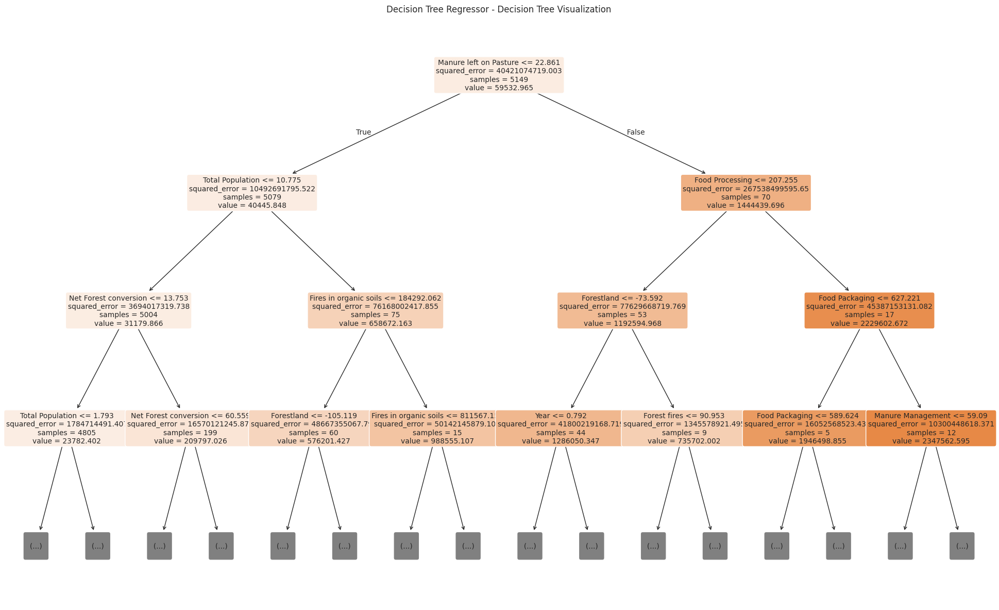

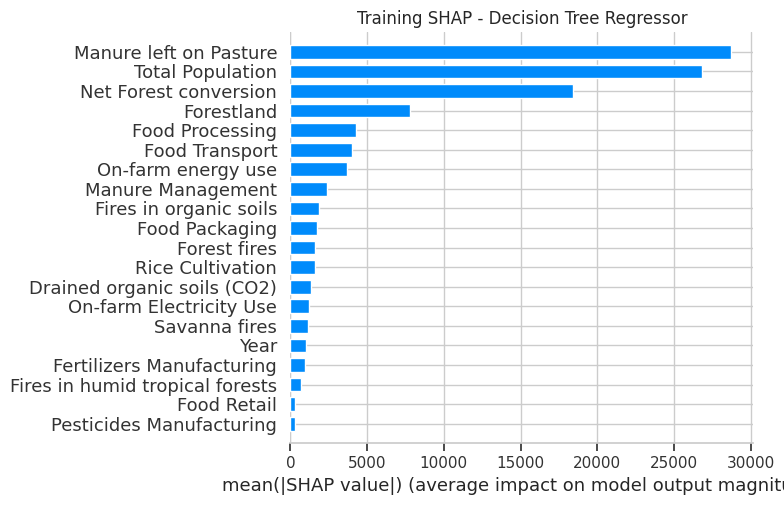

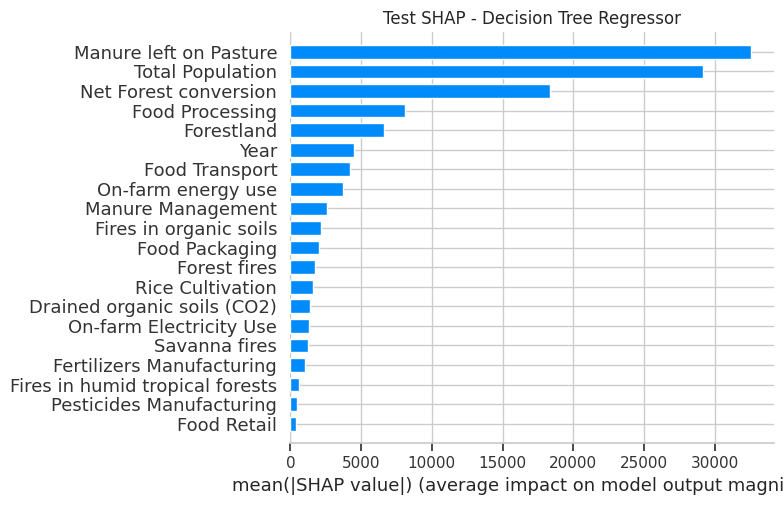

Training Bagging Regressor...
Training Random Forest Regressor...


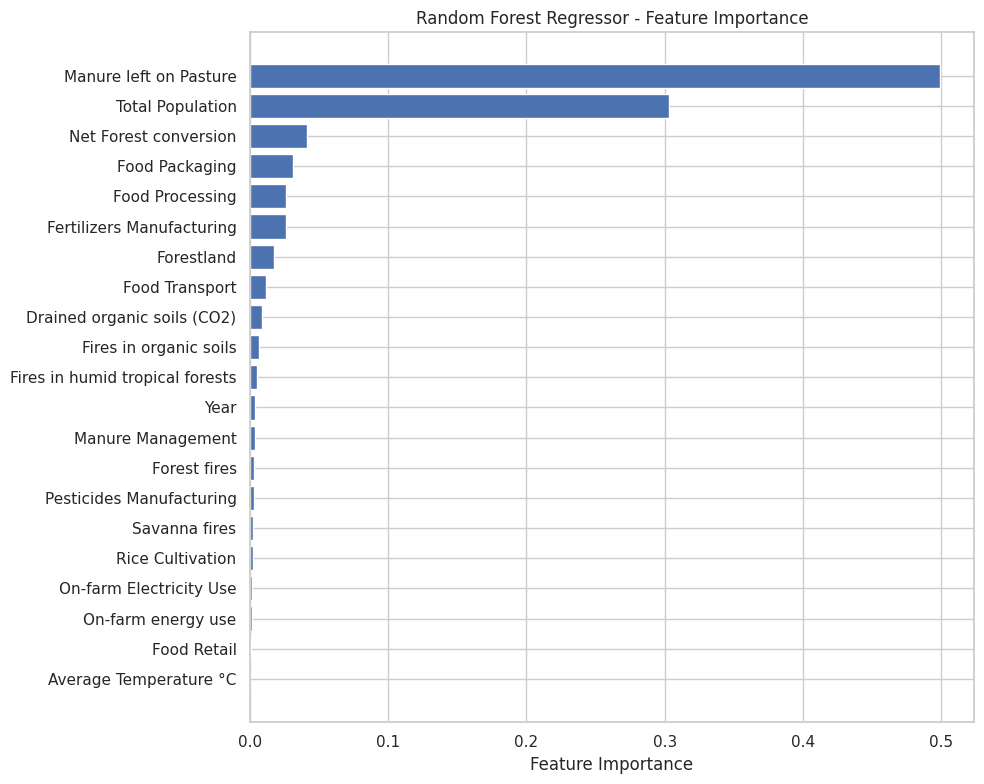

Training AdaBoost Regressor...
Training XGBoost Regressor...
Training Support Vector Regressor...


,Model,Train_MAE,Train_RMSE,Train_MSE,Train_R2,Train_R2_Adj,Test_MAE,Test_RMSE,Test_MSE,Test_R2,Test_R2_Adj
0,ElasticNet Regression,6212.33,13742.44,188854710.49,1.00,1.00,10459.75,40555.34,1644735503.52,0.98,0.98
1,Ridge Regression,6750.31,13607.93,185175771.48,1.00,1.00,10983.73,41185.06,1696209020.33,0.98,0.98
2,Lasso Regression,6750.13,13607.93,185175779.79,1.00,1.00,10982.59,41185.22,1696222316.78,0.98,0.98
3,Linear Regression,6750.65,13607.93,185175770.44,1.00,1.00,10984.19,41185.64,1696257089.22,0.98,0.98
4,Bagging Regressor,1745.44,12441.48,154790502.19,1.00,1.00,15386.79,62232.55,3872889829.42,0.95,0.95
5,KNN Regressor,4282.73,23565.52,555333750.29,0.99,0.99,17953.82,63534.57,4036641494.68,0.95,0.95
6,Random Forest Regressor,1286.60,7781.74,60555513.93,1.00,1.00,15419.49,67682.07,4580863093.13,0.95,0.95
7,Decision Tree Regressor,0.00,0.00,0.00,1.00,1.00,15599.20,69195.09,4787960166.74,0.94,0.94
8,XGBoost Regressor,609.67,947.10,897004.79,1.00,1.00,15197.18,75891.72,5759552734.71,0.93,0.93
9,AdaBoost Regressor,39521.43,48438.23,2346262076.23,0.94,0.94,47696.78,78040.63,6090340368.46,0.93,0.93


In [182]:
dfm_results, _ = evaluate_models(models, x_train_scaled, y_train, x_test_scaled, y_test)

## 3.1 - Parameter Optimization

In [43]:
from sklearn.model_selection import GridSearchCV, KFold, RandomizedSearchCV

In [42]:
def tune_hyperparameters(models_dict, param_grid_dict, x_train, y_train):
    """
    Perform Grid Search Cross-Validation to find the best hyperparameters for a given model.

    Parameters:
    -----------
    model : estimator object
        The machine learning model for which to tune hyperparameters.
    param_grid : dict
        Dictionary with parameters names (str) as keys and lists of parameter settings to try as values.
    x_train, y_train : array-like
        Training features and target.

    Returns:
    --------
    best_model : estimator object
        The model with the best found hyperparameters.
    best_params : dict
        The best hyperparameters found during the search.
    """
    new_models_dict = {}
    models_params = {}
    cv = KFold(n_splits=5, shuffle=True, random_state=42)

    for model_name, model in models_dict.items():

        param_grid = param_grid_dict.get(model_name, {})

        grid_search = RandomizedSearchCV(
            estimator=model,
            param_distributions=param_grid,
            scoring="neg_root_mean_squared_error",
            cv=cv,
            n_jobs=-1,
            verbose=1,
            n_iter=20,
        )

        grid_search.fit(x_train, y_train)

        best_model = grid_search.best_estimator_
        best_params = grid_search.best_params_

        print(f"Model: {model_name}")
        print(f"Best RMSE: {-grid_search.best_score_}")
        print(f"Best Hyperparameters: {best_params}")
        print(30 * "-")

        new_models_dict[model_name] = best_model
        models_params[model_name] = best_params

    return new_models_dict, models_params

In [39]:
models_po = {
    "Linear Regression PO": LinearRegression(n_jobs=-1),
    "Ridge Regression PO": Ridge(random_state=0),
    "Lasso Regression PO": Lasso(random_state=0),
    "ElasticNet Regression PO": ElasticNet(random_state=0),
    "KNN Regressor PO": KNeighborsRegressor(n_jobs=-1),
    "Decision Tree Regressor PO": DecisionTreeRegressor(random_state=0),
    "Bagging Regressor PO": BaggingRegressor(n_jobs=-1, random_state=0),
    "Random Forest Regressor PO": RandomForestRegressor(n_jobs=-1, random_state=0),
    "AdaBoost Regressor PO": AdaBoostRegressor(random_state=0),
    "XGBoost Regressor PO": XGBRegressor(device="cuda", random_state=0),
    "Support Vector Regressor PO": SVR(),
}

In [40]:
params_dict = {
    "Linear Regression PO": {},
    "Ridge Regression PO": {
        "alpha": np.logspace(-4, 4, 20),
    },
    "Lasso Regression PO": {
        "alpha": np.logspace(-5, 1, 20),
        "max_iter": [1000, 5000, 20000],
    },
    "ElasticNet Regression PO": {
        "alpha": np.logspace(-5, 1, 20),
        "l1_ratio": np.linspace(0, 1, 10),
        "max_iter": [5000, 20000],
    },
    "KNN Regressor PO": {
        "n_neighbors": [3, 5, 7, 9, 11],
        "weights": ["uniform", "distance"],
        "p": [1, 2],
    },
    "Decision Tree Regressor PO": {
        "max_depth": [10, 20, None],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4],
        "max_features": [1, "sqrt", "log2"],
        "ccp_alpha": [0] + np.logspace(-6, -2, 4).tolist(),
    },
    "Bagging Regressor PO": {
        "n_estimators": [100, 300, 500],
        "max_samples": [0.6, 0.8, 1.0],
        "max_features": [0.6, 0.8, 1.0],
    },
    "Random Forest Regressor PO": {
        "n_estimators": [100, 300, 500],
        "max_depth": [10, 20, None],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4],
        "bootstrap": [True, False],
        "max_features": [1, "sqrt", "log2"],
    },
    "AdaBoost Regressor PO": {
        "n_estimators": [100, 300, 500],
        "learning_rate": [0.01, 0.05, 0.1, 0.2],
        "loss": ["linear", "square", "exponential"],
    },
    "XGBoost Regressor PO": {
        "n_estimators": [300, 800],
        "learning_rate": [0.03, 0.1],
        "max_depth": [3, 6],
        "min_child_weight": [1, 5, 10],
        "gamma": [0, 0.1, 1.0],
        "subsample": [0.8, 1.0],
        "colsample_bytree": [0.8, 1.0],
        "reg_lambda": [1.0, 5.0, 10.0],
        "reg_alpha": [0.0, 0.1, 1.0],
    },
    "Support Vector Regressor PO": {
        "C": [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
        "epsilon": [0.1, 0.2, 0.5],
        # "gamma": ["scale", 0.001, 0.01, 0.1, 1.0],
        "kernel": [
            # "linear",
            "rbf",
            "poly",
        ],
    },
}

In [187]:
tuned_models, models_opt_params = tune_hyperparameters(
    models_po, params_dict, x_train_scaled, y_train
)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Model: Linear Regression PO
Best RMSE: 13985.256977684598
Best Hyperparameters: {}
------------------------------
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Model: Ridge Regression PO
Best RMSE: 13983.437572896433
Best Hyperparameters: {'alpha': np.float64(206.913808111479)}
------------------------------
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Model: Lasso Regression PO
Best RMSE: 13984.74602679431
Best Hyperparameters: {'max_iter': 20000, 'alpha': np.float64(10.0)}
------------------------------
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Model: ElasticNet Regression PO
Best RMSE: 13983.825655140081
Best Hyperparameters: {'max_iter': 5000, 'l1_ratio': np.float64(0.2222222222222222), 'alpha': np.float64(0.029763514416313162)}
------------------------------
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Model: KNN Regressor PO
Best RMSE: 25060.19393401839

Training Linear Regression PO...
Training Ridge Regression PO...
Training Lasso Regression PO...
Training ElasticNet Regression PO...
Training KNN Regressor PO...
Training Decision Tree Regressor PO...


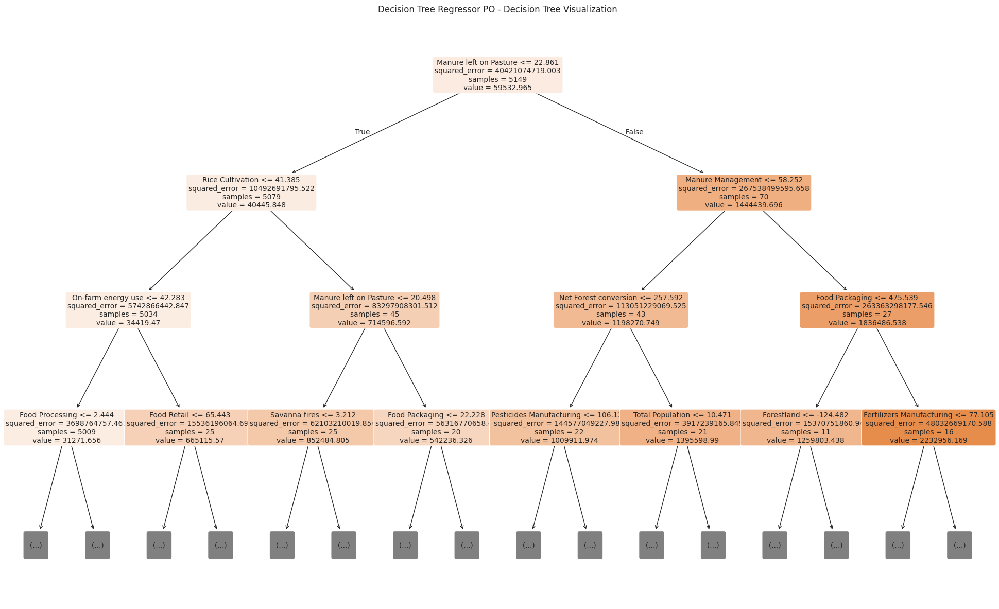

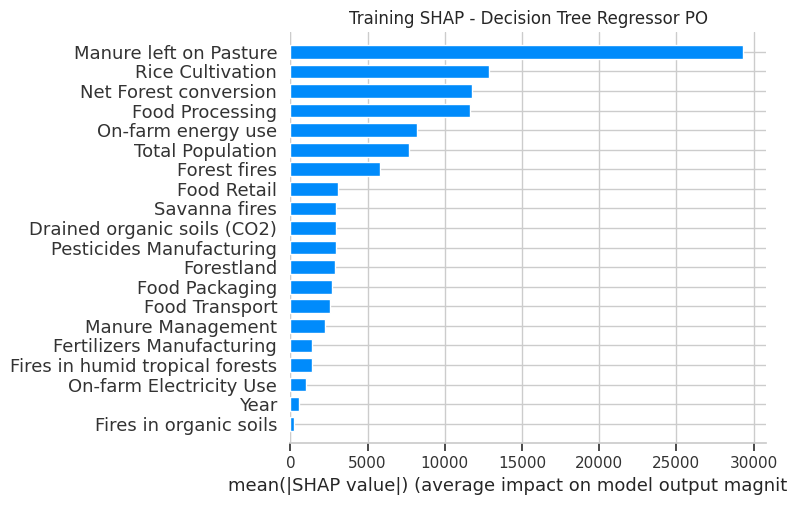

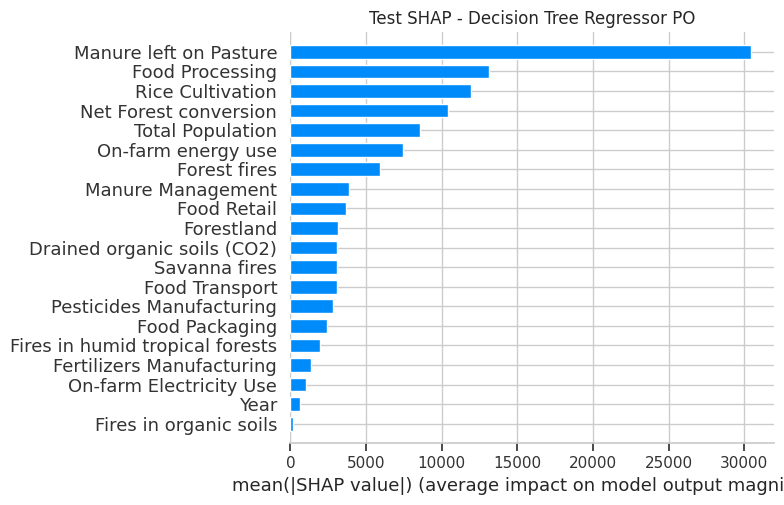

Training Bagging Regressor PO...
Training Random Forest Regressor PO...


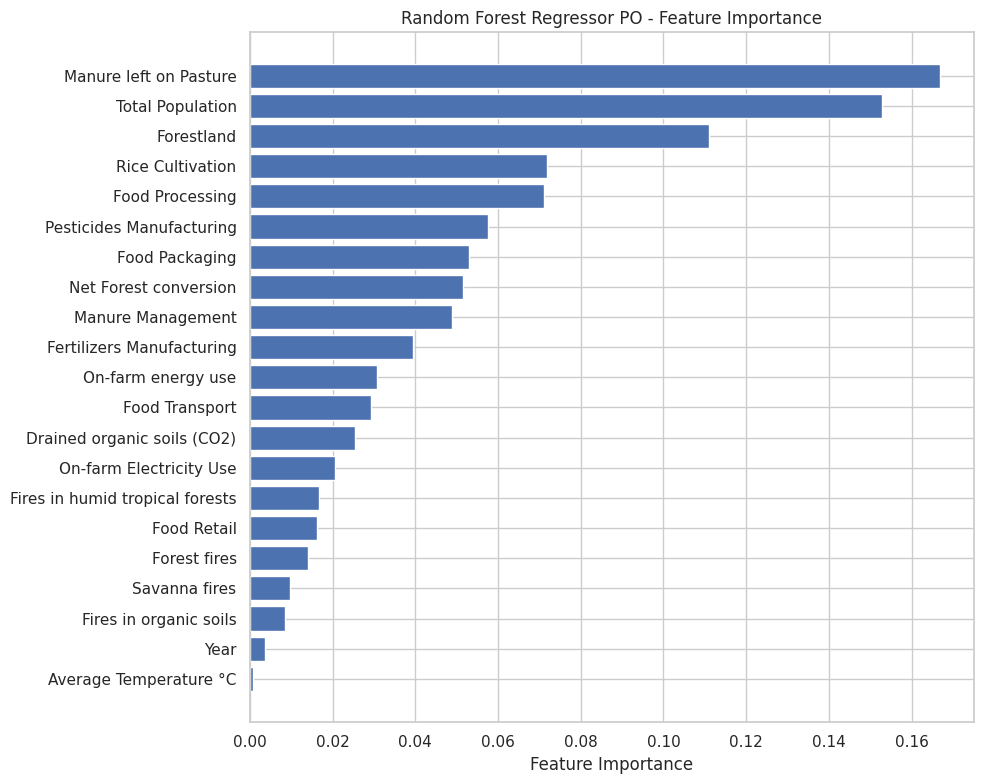

Training AdaBoost Regressor PO...
Training XGBoost Regressor PO...
Training Support Vector Regressor PO...


,Model,Train_MAE,Train_RMSE,Train_MSE,Train_R2,Train_R2_Adj,Test_MAE,Test_RMSE,Test_MSE,Test_R2,Test_R2_Adj
0,Ridge Regression PO,6684.13,13609.44,185216793.26,1.00,1.00,10899.46,41074.44,1687110013.01,0.98,0.98
1,ElasticNet Regression PO,6711.51,13608.45,185189820.31,1.00,1.00,10933.19,41119.35,1690801104.25,0.98,0.98
2,Lasso Regression PO,6746.11,13607.95,185176348.45,1.00,1.00,10969.73,41185.00,1696204224.00,0.98,0.98
3,Linear Regression PO,6750.65,13607.93,185175770.44,1.00,1.00,10984.19,41185.64,1696257089.22,0.98,0.98
4,KNN Regressor PO,0.00,0.00,0.00,1.00,1.00,16315.30,61324.43,3760685914.04,0.96,0.96
5,Bagging Regressor PO,1264.45,7308.88,53419677.13,1.00,1.00,14490.08,61502.02,3782498104.64,0.96,0.96
6,Random Forest Regressor PO,799.83,2736.06,7486033.74,1.00,1.00,13998.26,64733.88,4190475156.49,0.95,0.95
7,XGBoost Regressor PO,2105.35,3746.45,14035889.63,1.00,1.00,14734.48,66835.77,4467020668.85,0.95,0.95
8,AdaBoost Regressor PO,39195.36,49057.37,2406625925.14,0.94,0.94,48000.27,79193.58,6271623248.09,0.93,0.93
9,Decision Tree Regressor PO,1555.57,9548.04,91165069.32,1.00,1.00,21978.41,132317.24,17507850757.55,0.79,0.79


In [188]:
pom_results, _ = evaluate_models(
    tuned_models, x_train_scaled, y_train, x_test_scaled, y_test
)

## 3.2 - Dimensionality Reduction

In [189]:
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression

### 3.2.1 - Principal Component Analysis - PCA

In [190]:
# Taking the best model to use it in the pipeline with PCA
best_model_name = pom_results.iloc[0]["Model"]
best_model = tuned_models[best_model_name]
print(f"Best model selected for PCA pipeline: {best_model_name}")

Best model selected for PCA pipeline: Ridge Regression PO


In [191]:
pipe = Pipeline([("pca", PCA(random_state=0)), ("model", best_model)])

param_grid = {
    "pca__n_components": [0.90, 0.95, 0.99],
}

cv = KFold(n_splits=10, shuffle=True, random_state=42)

grid = GridSearchCV(
    pipe,
    param_grid=param_grid,
    scoring="neg_root_mean_squared_error",
    cv=cv,
    n_jobs=-1,
    verbose=1,
)
grid.fit(x_train_scaled, y_train)

Fitting 10 folds for each of 3 candidates, totalling 30 fits


,estimator,Pipeline(step...om_state=0))])
,param_grid,"{'pca__n_components': [0.9, 0.95, ...]}"
,scoring,'neg_root_mean_squared_error'
,n_jobs,-1
,refit,True
,cv,KFold(n_split... shuffle=True)
,verbose,1
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,n_components,0.9


In [192]:
# Taking the best estimator from the grid search for PCA
pca = grid.best_estimator_.named_steps["pca"]
print(
    f"Explained variance ratio by PCA components: {pca.explained_variance_ratio_.round(4)}"
)
print(f"Number of PCA components selected: {pca.n_components_}")

Explained variance ratio by PCA components: [0.9999]
Number of PCA components selected: 1


In [193]:
x_train_pca = pca.transform(x_train_scaled)
x_test_pca = pca.transform(x_test_scaled)

In [194]:
x_train_pca.shape, x_test_pca.shape

((5149, 1), (1816, 1))

Training Linear Regression PO...
Training Ridge Regression PO...
Training Lasso Regression PO...
Training ElasticNet Regression PO...
Training KNN Regressor PO...
Training Decision Tree Regressor PO...


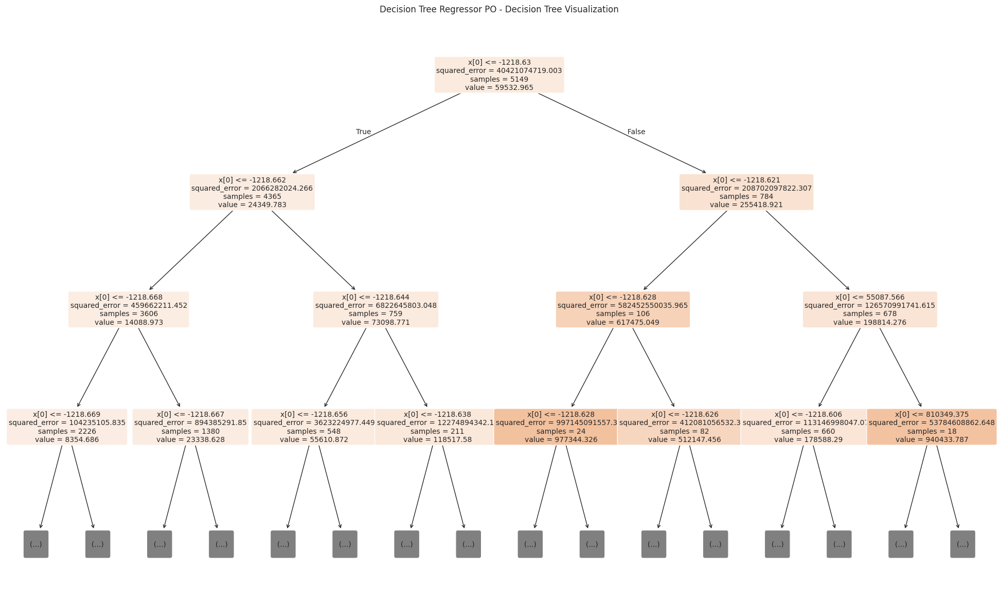

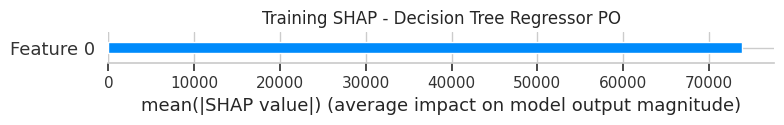

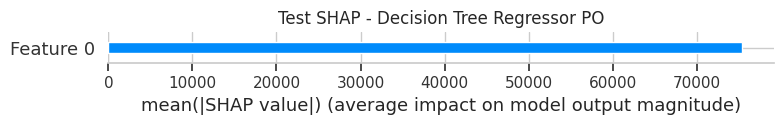

Training Bagging Regressor PO...
Training Random Forest Regressor PO...


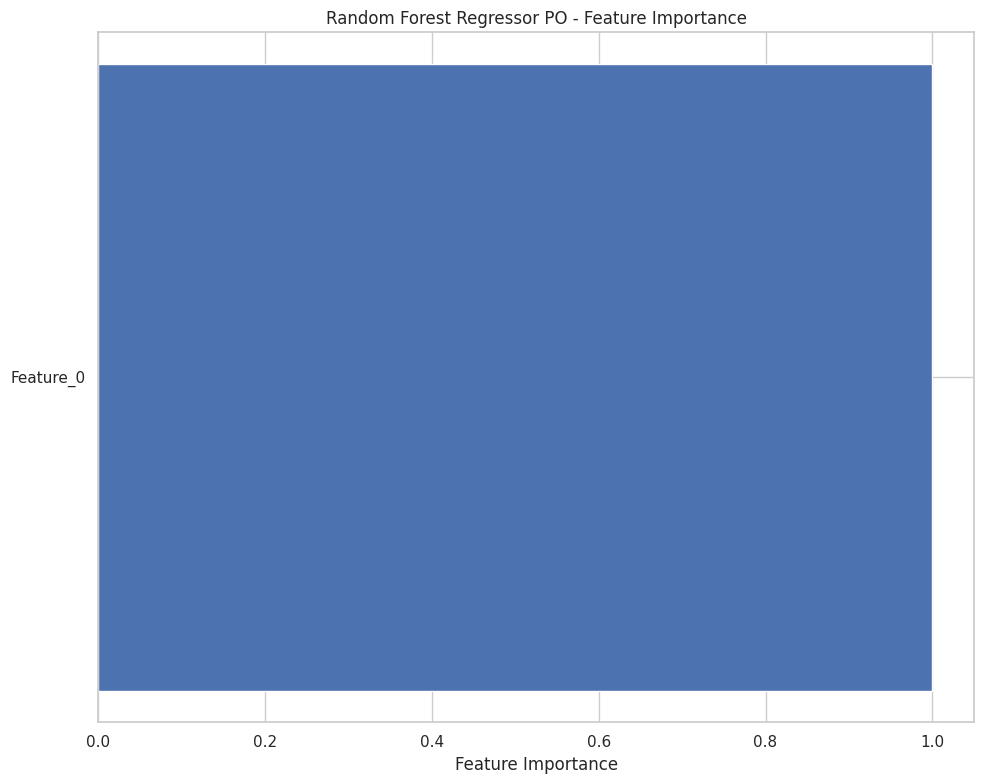

Training AdaBoost Regressor PO...
Training XGBoost Regressor PO...
Training Support Vector Regressor PO...


,Model,Train_MAE,Train_RMSE,Train_MSE,Train_R2,Train_R2_Adj,Test_MAE,Test_RMSE,Test_MSE,Test_R2,Test_R2_Adj
0,XGBoost Regressor PO,49486.25,154901.56,23994492222.97,0.41,0.41,70708.65,271863.27,73909638807.89,0.13,0.13
1,AdaBoost Regressor PO,84355.72,217951.82,47502994700.06,-0.18,-0.18,96789.94,277891.18,77223507642.97,0.09,0.09
2,KNN Regressor PO,34885.71,126829.02,16085600309.11,0.60,0.60,71452.36,280194.52,78508970961.89,0.08,0.08
3,Linear Regression PO,74819.11,194528.35,37841280567.85,0.06,0.06,87970.15,286030.19,81813268605.65,0.04,0.04
4,Ridge Regression PO,74819.11,194528.35,37841280567.85,0.06,0.06,87970.15,286030.19,81813268605.65,0.04,0.04
5,Lasso Regression PO,74819.11,194528.35,37841280567.85,0.06,0.06,87970.15,286030.19,81813268606.67,0.04,0.04
6,ElasticNet Regression PO,74819.11,194528.35,37841280567.85,0.06,0.06,87970.15,286030.19,81813268607.29,0.04,0.04
7,Bagging Regressor PO,28048.89,99612.48,9922645317.15,0.75,0.75,74796.71,295679.90,87426604402.79,-0.03,-0.03
8,Support Vector Regressor PO,56652.18,206688.09,42719967853.00,-0.06,-0.06,73398.97,298903.16,89343098359.69,-0.05,-0.05
9,Random Forest Regressor PO,27652.80,95099.55,9043925224.75,0.78,0.78,75312.53,299436.95,89662488064.77,-0.05,-0.05


In [195]:
pca_results, _ = evaluate_models(models_po, x_train_pca, y_train, x_test_pca, y_test)

In [196]:
dfm_results.round(2)

,Model,Train_MAE,Train_RMSE,Train_MSE,Train_R2,Train_R2_Adj,Test_MAE,Test_RMSE,Test_MSE,Test_R2,Test_R2_Adj
0,ElasticNet Regression,6212.33,13742.44,1.888547e+08,1.00,1.00,10459.75,40555.34,1.644736e+09,0.98,0.98
1,Ridge Regression,6750.31,13607.93,1.851758e+08,1.00,1.00,10983.73,41185.06,1.696209e+09,0.98,0.98
2,Lasso Regression,6750.13,13607.93,1.851758e+08,1.00,1.00,10982.59,41185.22,1.696222e+09,0.98,0.98
3,Linear Regression,6750.65,13607.93,1.851758e+08,1.00,1.00,10984.19,41185.64,1.696257e+09,0.98,0.98
4,Bagging Regressor,1745.44,12441.48,1.547905e+08,1.00,1.00,15386.79,62232.55,3.872890e+09,0.95,0.95
5,KNN Regressor,4282.73,23565.52,5.553338e+08,0.99,0.99,17953.82,63534.57,4.036641e+09,0.95,0.95
6,Random Forest Regressor,1286.60,7781.74,6.055551e+07,1.00,1.00,15419.49,67682.07,4.580863e+09,0.95,0.95
7,Decision Tree Regressor,0.00,0.00,0.000000e+00,1.00,1.00,15599.20,69195.09,4.787960e+09,0.94,0.94
8,XGBoost Regressor,609.67,947.10,8.970048e+05,1.00,1.00,15197.18,75891.72,5.759553e+09,0.93,0.93
9,AdaBoost Regressor,39521.43,48438.23,2.346262e+09,0.94,0.94,47696.78,78040.63,6.090340e+09,0.93,0.93


In [197]:
pom_results.round(2)

,Model,Train_MAE,Train_RMSE,Train_MSE,Train_R2,Train_R2_Adj,Test_MAE,Test_RMSE,Test_MSE,Test_R2,Test_R2_Adj
0,Ridge Regression PO,6684.13,13609.44,1.852168e+08,1.00,1.00,10899.46,41074.44,1.687110e+09,0.98,0.98
1,ElasticNet Regression PO,6711.51,13608.45,1.851898e+08,1.00,1.00,10933.19,41119.35,1.690801e+09,0.98,0.98
2,Lasso Regression PO,6746.11,13607.95,1.851763e+08,1.00,1.00,10969.73,41185.00,1.696204e+09,0.98,0.98
3,Linear Regression PO,6750.65,13607.93,1.851758e+08,1.00,1.00,10984.19,41185.64,1.696257e+09,0.98,0.98
4,KNN Regressor PO,0.00,0.00,0.000000e+00,1.00,1.00,16315.30,61324.43,3.760686e+09,0.96,0.96
5,Bagging Regressor PO,1264.45,7308.88,5.341968e+07,1.00,1.00,14490.08,61502.02,3.782498e+09,0.96,0.96
6,Random Forest Regressor PO,799.83,2736.06,7.486034e+06,1.00,1.00,13998.26,64733.88,4.190475e+09,0.95,0.95
7,XGBoost Regressor PO,2105.35,3746.45,1.403589e+07,1.00,1.00,14734.48,66835.77,4.467021e+09,0.95,0.95
8,AdaBoost Regressor PO,39195.36,49057.37,2.406626e+09,0.94,0.94,48000.27,79193.58,6.271623e+09,0.93,0.93
9,Decision Tree Regressor PO,1555.57,9548.04,9.116507e+07,1.00,1.00,21978.41,132317.24,1.750785e+10,0.79,0.79


### 3.2.2 - Partial Least Squares (PLS)

In [198]:
# PLS n_components must be <= number of features (and <= n_samples - 1 in practice)
max_components = min(x_train_scaled.shape[1], x_train_scaled.shape[0] - 1)
candidate_components = list(range(1, min(20, max_components) + 1))

In [199]:
pipe = Pipeline(
    [
        # If X is already standardized, set scale=False to avoid double scaling.
        # If X is NOT standardized, you can set scale=True (default) and pass raw X.
        ("pls", PLSRegression(scale=False))
    ]
)
param_grid = {"pls__n_components": candidate_components}

cv = KFold(n_splits=10, shuffle=True, random_state=42)
grid = GridSearchCV(
    pipe,
    param_grid=param_grid,
    scoring="neg_root_mean_squared_error",
    cv=cv,
    n_jobs=-1,
    verbose=1,
)
grid.fit(x_train_scaled, y_train)

Fitting 10 folds for each of 20 candidates, totalling 200 fits


,estimator,Pipeline(step...cale=False))])
,param_grid,"{'pls__n_components': [1, 2, ...]}"
,scoring,'neg_root_mean_squared_error'
,n_jobs,-1
,refit,True
,cv,KFold(n_split... shuffle=True)
,verbose,1
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,n_components,18


In [200]:
best_pls = grid.best_estimator_.named_steps["pls"]
print("Best n_components:", best_pls.n_components)
print("Best CV RMSE:", -grid.best_score_)
print("Best params:", grid.best_params_)

Best n_components: 18
Best CV RMSE: 13984.870528856962
Best params: {'pls__n_components': 18}


In [201]:
def vip_scores(pls: PLSRegression, X: np.ndarray) -> np.ndarray:
    """
    Compute VIP scores for a fitted PLSRegression (single-response or multi-response).
    Returns VIP per original feature (length = n_features).
    """
    T = pls.x_scores_  # (n_samples, n_components)
    W = pls.x_weights_  # (n_features, n_components)
    Q = (
        pls.y_loadings_
    )  # (n_targets, n_components) or (n_components,) depending on sklearn version

    # Ensure Q is 2D: (n_targets, n_components)
    Q = np.atleast_2d(Q)

    p, a = W.shape  # p features, a components

    # Sum of squares explained in Y by each component:
    # SS_a = ||t_a||^2 * ||q_a||^2  (for multi-target, q_a is vector -> squared norm)
    ss = np.zeros(a)
    for j in range(a):
        t = T[:, j]
        q = Q[:, j]
        ss[j] = np.sum(t**2) * np.sum(q**2)

    total_ss = np.sum(ss)
    if total_ss == 0:
        return np.zeros(p)

    vip = np.zeros(p)
    for i in range(p):
        # Weighted sum over components of normalized squared weights
        weight = 0.0
        for j in range(a):
            w_ij = W[i, j]
            w_norm = np.sum(W[:, j] ** 2)
            if w_norm == 0:
                continue
            weight += ss[j] * (w_ij**2) / w_norm
        vip[i] = np.sqrt(p * weight / total_ss)

    return vip

In [202]:
vip = vip_scores(best_pls, x_train_scaled)
feature_names = x_train_scaled.columns

In [203]:
vip_table = pd.DataFrame({"feature": feature_names, "VIP": vip}).sort_values(
    "VIP", ascending=False
)

##### Variable Importance in Projection (VIP) Scores for PLS Regression:
Rules of thumb:
- VIP > 1: important
- VIP between ~0.8–1: moderately important
- VIP < 0.8: less important

In [204]:
vip_table.head(25).style.background_gradient(subset=["VIP"], cmap="Blues").format(
    {"VIP": "{:.3f}"}
).set_caption("Feature Importance - Sorted by VIP Scores")

,feature,VIP
17,Fires in humid tropical forests,2.582
11,Food Packaging,2.202
8,Net Forest conversion,1.558
7,Forestland,1.185
16,Fires in organic soils,1.161
12,Food Processing,1.006
2,Forest fires,0.945
10,On-farm Electricity Use,0.695
5,Pesticides Manufacturing,0.629
1,Savanna fires,0.601


In [ ]:
pls_drop_vars = vip_table[vip_table["VIP"] < 0.6]["feature"].tolist()

## 3.3 - Different Years for test set (currently from 2013 to 2020)

##### - We choose the following representative years: 
["1993", "1996", "2000", "2005", "2008", "2013", "2018"]

---

Condition: 
- Doesn't have sharp picks or troughs in comparison with its neighbors 

In [5]:
rep_years = [1993, 1996, 2000, 2005, 2008, 2013, 2018]

In [6]:
def new_train_test_split(data_frame, target, years):
    df = data_frame.copy()
    x_train = df.loc[~df["Year"].isin(years)]
    y_train = x_train[target]
    x_train = x_train.drop(columns=target)

    x_test = df.loc[df["Year"].isin(years)]
    y_test = x_test[target]
    x_test = x_test.drop(columns=target)

    return x_train, y_train, x_test, y_test

In [7]:
x_train, y_train, x_test, y_test = new_train_test_split(
    df, target="total_emission", years=rep_years
)

In [8]:
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((5382, 30), (5382,), (1583, 30), (1583,))

In [9]:
print(f"Test dataset percent share: {round(x_test.shape[0]/df.shape[0]*100, 2)}%")

Test dataset percent share: 22.73%


In [18]:
# Imputing missing values
# Train
results, ite_imp = iterative_imputing(x_train, estimator=rfr_imp, train=True)
x_train_imputed = pd.DataFrame(results, columns=x_train.columns)
# Test
results = iterative_imputing(x_test, train=False, ite_imp=ite_imp)
x_test_imputed = pd.DataFrame(results, columns=x_test.columns)

Fitting and transforming the training dataset...
Transforming the testing dataset...


In [19]:
# Feature Selection
# Train
x_train_selected = preprocessing(x_train_imputed)
# Test
x_test_selected = preprocessing(x_test_imputed)

Number of columns after Feature Selection: 21
Number of columns after Feature Selection: 21


In [22]:
# Normalization
# Train
x_train_scaled, scaler = normalization(
    x_train_selected, scaler=RobustScaler(), train=True
)
# Test
x_test_scaled = normalization(x_test_selected, scaler=scaler, train=False)
x_train_scaled.shape, x_test_scaled.shape

Fitting and transforming the training dataset...
Transforming the testing dataset...


((5382, 21), (1583, 21))

#### 3.3.1 - Models evaluation - Base Models

Training Linear Regression...
Training Ridge Regression...
Training Lasso Regression...
Training ElasticNet Regression...
Training KNN Regressor...
Training Decision Tree Regressor...


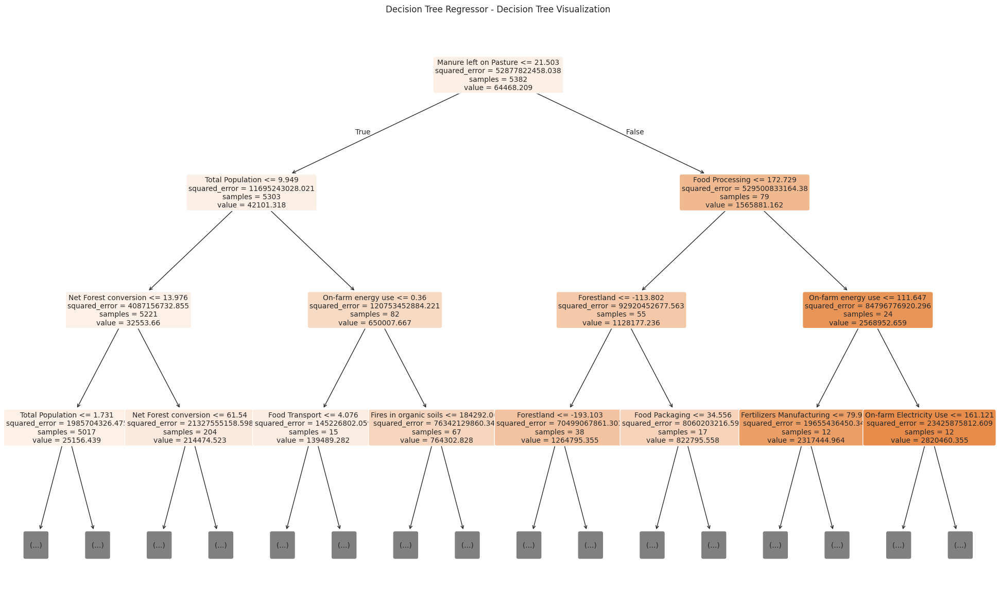

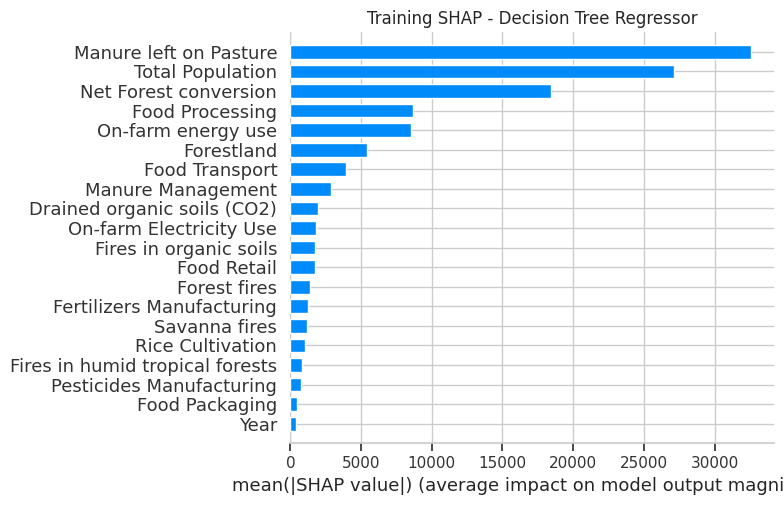

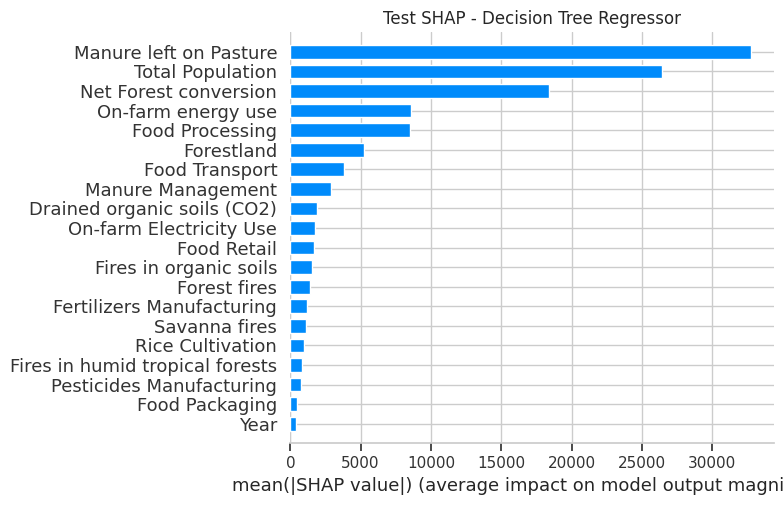

Training Bagging Regressor...
Training Random Forest Regressor...


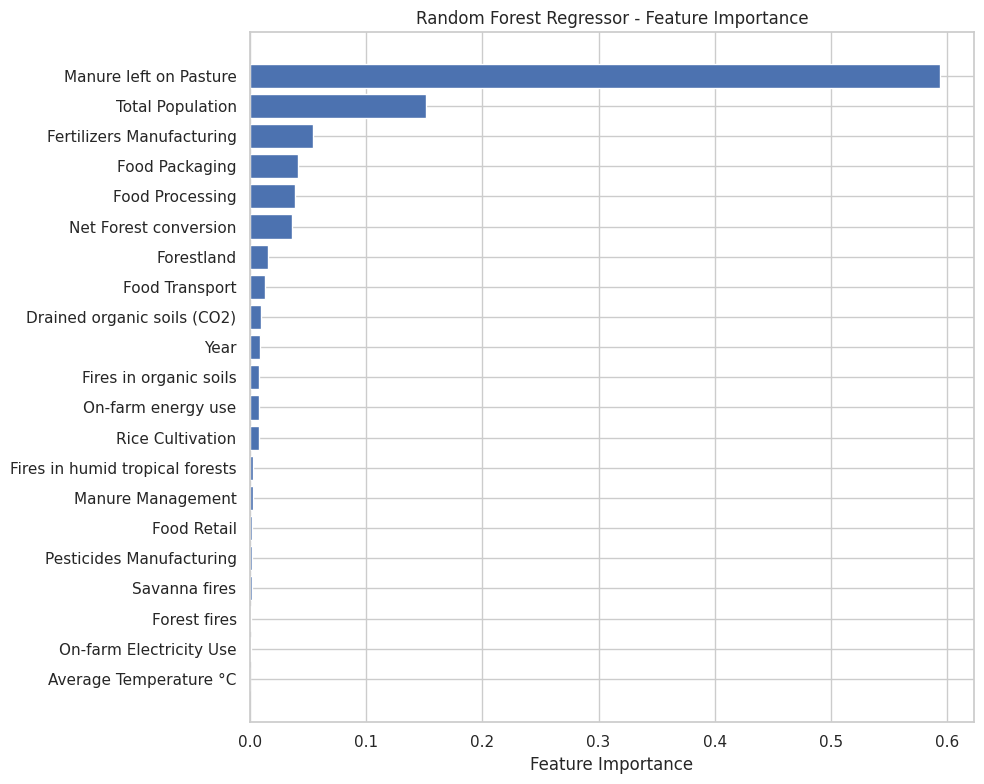

Training AdaBoost Regressor...
Training XGBoost Regressor...
Training Support Vector Regressor...


,Model,Train_MAE,Train_RMSE,Train_MSE,Train_R2,Train_R2_Adj,Test_MAE,Test_RMSE,Test_MSE,Test_R2,Test_R2_Adj
0,Random Forest Regressor,1405.84,7838.68,61444938.33,1.00,1.00,2369.03,11170.91,124789283.35,1.00,1.00
1,Bagging Regressor,2061.27,16423.37,269727178.95,0.99,0.99,3020.63,14927.56,222832093.96,1.00,1.00
2,XGBoost Regressor,788.53,1410.74,1990194.21,1.00,1.00,3329.33,15585.54,242908996.89,1.00,1.00
3,Lasso Regression,7445.84,17244.27,297365009.70,0.99,0.99,7410.80,15954.59,254549020.59,0.99,0.99
4,Ridge Regression,7446.02,17244.27,297364998.35,0.99,0.99,7411.23,15954.67,254551569.61,0.99,0.99
5,Linear Regression,7446.19,17244.27,297364997.30,0.99,0.99,7411.50,15954.72,254553127.18,0.99,0.99
6,ElasticNet Regression,7172.77,17343.59,300800059.76,0.99,0.99,7040.07,15984.31,255498214.91,0.99,0.99
7,Decision Tree Regressor,0.00,0.00,0.00,1.00,1.00,3233.95,17193.76,295625246.37,0.99,0.99
8,KNN Regressor,5306.88,25276.71,638912142.30,0.99,0.99,5894.57,26038.36,677995931.46,0.99,0.99
9,AdaBoost Regressor,48914.50,57561.65,3313343812.88,0.94,0.94,49473.84,58304.74,3399442362.47,0.93,0.93


In [213]:
dfm_results, _ = evaluate_models(models, x_train_scaled, y_train, x_test_scaled, y_test)

#### 3.3.2 - Models evaluation - Optimized Models

In [214]:
tuned_models, models_opt_params = tune_hyperparameters(
    models_po, params_dict, x_train_scaled, y_train
)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Model: Linear Regression PO
Best RMSE: 18119.546599290883
Best Hyperparameters: {}
------------------------------
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Model: Ridge Regression PO
Best RMSE: 18115.647841409973
Best Hyperparameters: {'alpha': np.float64(206.913808111479)}
------------------------------
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Model: Lasso Regression PO
Best RMSE: 18119.111940931754
Best Hyperparameters: {'max_iter': 1000, 'alpha': np.float64(4.832930238571752)}
------------------------------
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Model: ElasticNet Regression PO
Best RMSE: 18115.25860647471
Best Hyperparameters: {'max_iter': 5000, 'l1_ratio': np.float64(0.2222222222222222), 'alpha': np.float64(0.1274274985703132)}
------------------------------
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Model: KNN Regressor PO
Best RMSE: 30516.0

Training Linear Regression PO...
Training Ridge Regression PO...
Training Lasso Regression PO...
Training ElasticNet Regression PO...
Training KNN Regressor PO...
Training Decision Tree Regressor PO...


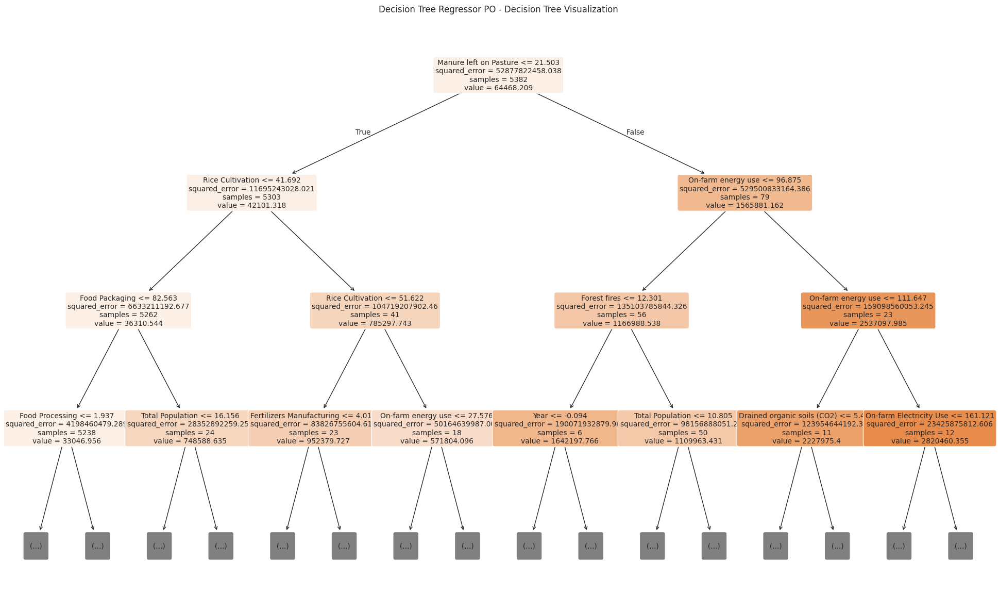

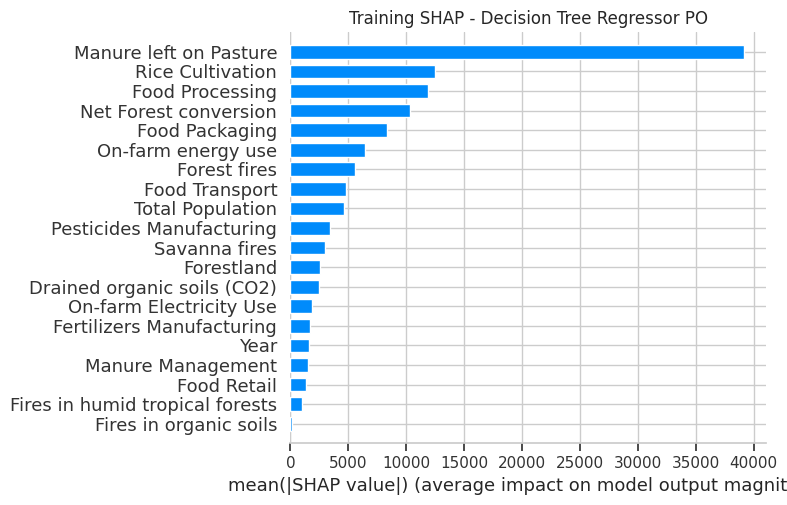

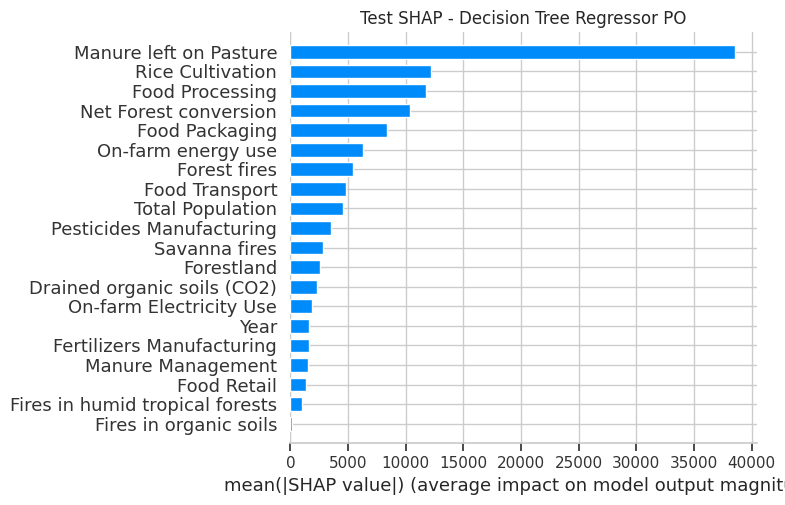

Training Bagging Regressor PO...
Training Random Forest Regressor PO...


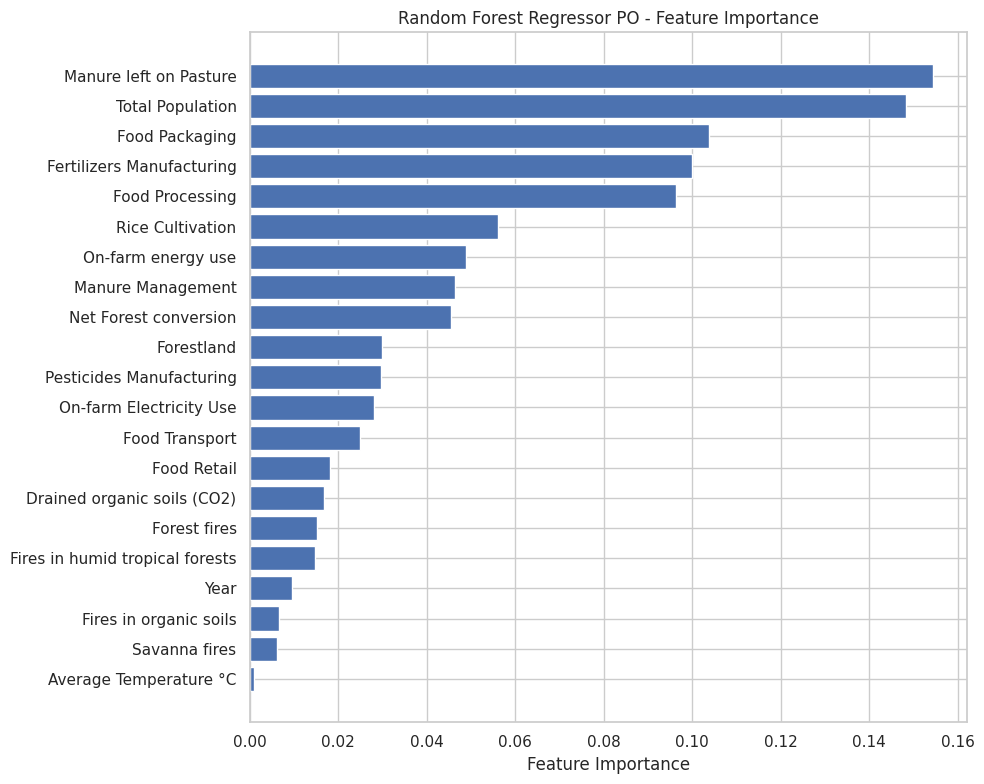

Training AdaBoost Regressor PO...
Training XGBoost Regressor PO...
Training Support Vector Regressor PO...


,Model,Train_MAE,Train_RMSE,Train_MSE,Train_R2,Train_R2_Adj,Test_MAE,Test_RMSE,Test_MSE,Test_R2,Test_R2_Adj
0,Bagging Regressor PO,1487.64,7453.85,55559907.37,1.00,1.00,2603.34,9690.98,93915009.74,1.00,1.00
1,Random Forest Regressor PO,1127.67,4156.39,17275585.75,1.00,1.00,2638.11,9986.00,99720111.70,1.00,1.00
2,XGBoost Regressor PO,2592.32,4618.29,21328582.01,1.00,1.00,4077.38,14348.18,205870180.30,1.00,1.00
3,ElasticNet Regression PO,7368.33,17250.51,297579976.76,0.99,0.99,7301.64,15940.33,254094140.39,0.99,0.99
4,Ridge Regression PO,7412.78,17245.39,297403400.48,0.99,0.99,7363.20,15946.75,254298917.36,0.99,0.99
5,Lasso Regression PO,7444.55,17244.28,297365285.57,0.99,0.99,7408.18,15954.10,254533449.59,0.99,0.99
6,Linear Regression PO,7446.19,17244.27,297364997.30,0.99,0.99,7411.50,15954.72,254553127.18,0.99,0.99
7,KNN Regressor PO,0.00,0.00,0.00,1.00,1.00,4144.03,21196.28,449282377.47,0.99,0.99
8,Decision Tree Regressor PO,1470.79,2928.33,8575134.81,1.00,1.00,6852.70,43040.16,1852455336.60,0.96,0.96
9,AdaBoost Regressor PO,36305.16,50177.41,2517772487.45,0.95,0.95,36183.79,49823.88,2482418892.67,0.95,0.95


In [215]:
pom_results, fitted_models = evaluate_models(
    tuned_models, x_train_scaled, y_train, x_test_scaled, y_test
)

In [216]:
error_metrics = [
    "Train_MAE",
    "Train_RMSE",
    "Train_MSE",
    "Test_MAE",
    "Test_RMSE",
    "Test_MSE",
]
r2_metrics = ["Train_R2", "Train_R2_Adj", "Test_R2", "Test_R2_Adj"]
dfm_results.style.background_gradient(
    subset=error_metrics, cmap="Reds"  # Red gradient for error metrics (high is bad)
).background_gradient(
    subset=r2_metrics, cmap="Blues"  # Blue gradient for R^2 metrics (high is good)
).format(
    {
        "Train_MAE": "{:.2f}",
        "Train_RMSE": "{:.2f}",
        "Train_MSE": "{:.2f}",
        "Train_R2": "{:.2f}",
        "Train_R2_Adj": "{:.2f}",
        "Test_MAE": "{:.2f}",
        "Test_RMSE": "{:.2f}",
        "Test_MSE": "{:.2f}",
        "Test_R2": "{:.2f}",
        "Test_R2_Adj": "{:.2f}",
    }
).set_caption(
    "Model Performance Comparison - Sorted by Test RMSE"
)

,Model,Train_MAE,Train_RMSE,Train_MSE,Train_R2,Train_R2_Adj,Test_MAE,Test_RMSE,Test_MSE,Test_R2,Test_R2_Adj
0,Random Forest Regressor,1405.84,7838.68,61444938.33,1.00,1.00,2369.03,11170.91,124789283.35,1.00,1.00
1,Bagging Regressor,2061.27,16423.37,269727178.95,0.99,0.99,3020.63,14927.56,222832093.96,1.00,1.00
2,XGBoost Regressor,788.53,1410.74,1990194.21,1.00,1.00,3329.33,15585.54,242908996.89,1.00,1.00
3,Lasso Regression,7445.84,17244.27,297365009.70,0.99,0.99,7410.80,15954.59,254549020.59,0.99,0.99
4,Ridge Regression,7446.02,17244.27,297364998.35,0.99,0.99,7411.23,15954.67,254551569.61,0.99,0.99
5,Linear Regression,7446.19,17244.27,297364997.30,0.99,0.99,7411.50,15954.72,254553127.18,0.99,0.99
6,ElasticNet Regression,7172.77,17343.59,300800059.76,0.99,0.99,7040.07,15984.31,255498214.91,0.99,0.99
7,Decision Tree Regressor,0.00,0.00,0.00,1.00,1.00,3233.95,17193.76,295625246.37,0.99,0.99
8,KNN Regressor,5306.88,25276.71,638912142.30,0.99,0.99,5894.57,26038.36,677995931.46,0.99,0.99
9,AdaBoost Regressor,48914.50,57561.65,3313343812.88,0.94,0.94,49473.84,58304.74,3399442362.47,0.93,0.93


In [53]:
error_metrics = [
    "Train_MAE",
    "Train_RMSE",
    "Train_MSE",
    "Test_MAE",
    "Test_RMSE",
    "Test_MSE",
]
r2_metrics = ["Train_R2", "Train_R2_Adj", "Test_R2", "Test_R2_Adj"]
reduced_results.style.background_gradient(
    subset=error_metrics, cmap="Reds"  # Red gradient for error metrics (high is bad)
).background_gradient(
    subset=r2_metrics, cmap="Blues"  # Blue gradient for R^2 metrics (high is good)
).format(
    {
        "Train_MAE": "{:.2f}",
        "Train_RMSE": "{:.2f}",
        "Train_MSE": "{:.2f}",
        "Train_R2": "{:.2f}",
        "Train_R2_Adj": "{:.2f}",
        "Test_MAE": "{:.2f}",
        "Test_RMSE": "{:.2f}",
        "Test_MSE": "{:.2f}",
        "Test_R2": "{:.2f}",
        "Test_R2_Adj": "{:.2f}",
    }
).set_caption(
    "Model Performance Comparison - Sorted by Test RMSE - REDUCED DIMENSIONALITY WITH PLS"
)

,Model,Train_MAE,Train_RMSE,Train_MSE,Train_R2,Train_R2_Adj,Test_MAE,Test_RMSE,Test_MSE,Test_R2,Test_R2_Adj
0,Random Forest Regressor PO,954.92,1520.81,2312851.44,1.00,1.00,3749.15,11452.84,131167622.15,1.00,1.00
1,Bagging Regressor PO,1972.22,8392.50,70433986.55,1.00,1.00,4179.57,15834.06,250717482.69,0.99,0.99
2,KNN Regressor PO,8.97,79.65,6343.51,1.00,1.00,5262.96,23455.88,550178249.21,0.99,0.99
3,Decision Tree Regressor PO,3487.34,13068.85,170794947.10,1.00,1.00,6079.64,23601.98,557053667.47,0.99,0.99
4,XGBoost Regressor PO,5782.51,10419.88,108573862.13,1.00,1.00,7779.97,25209.08,635497957.09,0.99,0.99
5,ElasticNet Regression PO,17198.12,40395.67,1631810503.21,0.97,0.97,16893.06,37987.07,1443017456.86,0.97,0.97
6,Ridge Regression PO,17198.12,40395.67,1631810503.21,0.97,0.97,16893.06,37987.07,1443017477.95,0.97,0.97
7,Lasso Regression PO,17198.12,40395.67,1631810503.21,0.97,0.97,16893.06,37987.07,1443017477.96,0.97,0.97
8,Linear Regression PO,17198.12,40395.67,1631810503.21,0.97,0.97,16893.06,37987.07,1443017477.98,0.97,0.97
9,AdaBoost Regressor PO,38691.93,59394.80,3527742558.39,0.93,0.93,38558.48,58753.00,3451914594.46,0.93,0.93


### 3.2.3 - Models evaluation - Applying dimension reduction from [PLS](#variable-importance-in-projection-vip-scores-for-pls-regression)

In [28]:
models_po = {
    "Linear Regression PO": LinearRegression(n_jobs=-1),
    "Ridge Regression PO": Ridge(random_state=0, alpha=np.float64(206.913808111479)),
    "Lasso Regression PO": Lasso(
        random_state=0, max_iter=1000, alpha=np.float64(4.832930238571752)
    ),
    "ElasticNet Regression PO": ElasticNet(
        random_state=0,
        max_iter=5000,
        l1_ratio=np.float64(0.2222222222222222),
        alpha=np.float64(0.1274274985703132),
    ),
    "KNN Regressor PO": KNeighborsRegressor(
        n_jobs=-1, **{"weights": "distance", "p": 1, "n_neighbors": 5}
    ),
    "Decision Tree Regressor PO": DecisionTreeRegressor(
        random_state=0,
        **{
            "min_samples_split": 2,
            "min_samples_leaf": 1,
            "max_features": "sqrt",
            "max_depth": 20,
            "ccp_alpha": 0.00046415888336127773,
        }
    ),
    "Bagging Regressor PO": BaggingRegressor(
        n_jobs=-1,
        random_state=0,
        **{"n_estimators": 500, "max_samples": 1.0, "max_features": 0.6}
    ),
    "Random Forest Regressor PO": RandomForestRegressor(
        n_jobs=-1,
        random_state=0,
        **{
            "n_estimators": 500,
            "min_samples_split": 5,
            "min_samples_leaf": 1,
            "max_features": "log2",
            "max_depth": 20,
            "bootstrap": False,
        }
    ),
    "AdaBoost Regressor PO": AdaBoostRegressor(
        random_state=0, **{"n_estimators": 300, "loss": "square", "learning_rate": 0.1}
    ),
    "XGBoost Regressor PO": XGBRegressor(
        device="cuda",
        random_state=0,
        **{
            "subsample": 0.8,
            "reg_lambda": 10.0,
            "reg_alpha": 1.0,
            "n_estimators": 800,
            "min_child_weight": 1,
            "max_depth": 3,
            "learning_rate": 0.1,
            "gamma": 1.0,
            "colsample_bytree": 0.8,
        }
    ),
    "Support Vector Regressor PO": SVR(
        **{"kernel": "poly", "epsilon": 0.5, "C": 0.0001}
    ),
}

#### - Reduce dimensionality:

In [ ]:
pls_drop_vars = [
    "Average Temperature °C",
    "Year",
    "Food Transport",
    "Manure left on Pasture",
    "Fertilizers Manufacturing",
    "Manure Management",
    "Food Retail",
    "Drained organic soils (CO2)",
    "Total Population",
    "On-farm energy use",
    "Rice Cultivation",
    # "Savanna fires", # VIP score 0.601
    # "Pesticides Manufacturing", # VIP score 0.629
    # "On-farm Electricity Use" # VIP score 0.695
]

In [50]:
x_train_reduced = x_train_scaled.drop(columns=pls_drop_vars)
x_test_reduced = x_test_scaled.drop(columns=pls_drop_vars)

In [51]:
tuned_red_models, models_opt_params = tune_hyperparameters(
    models_po, params_dict, x_train_reduced, y_train
)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Model: Linear Regression PO
Best RMSE: 41785.62593654994
Best Hyperparameters: {}
------------------------------
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Model: Ridge Regression PO
Best RMSE: 41785.62593673889
Best Hyperparameters: {'alpha': np.float64(0.0001)}
------------------------------
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Model: Lasso Regression PO
Best RMSE: 41785.62593670342
Best Hyperparameters: {'max_iter': 1000, 'alpha': np.float64(2.06913808111479e-05)}
------------------------------
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Model: ElasticNet Regression PO
Best RMSE: 41785.62604777828
Best Hyperparameters: {'max_iter': 5000, 'l1_ratio': np.float64(0.3333333333333333), 'alpha': np.float64(2.06913808111479e-05)}
------------------------------
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Model: KNN Regressor PO
Best RMSE: 32426.429280133

Training Linear Regression PO...
Training Ridge Regression PO...
Training Lasso Regression PO...
Training ElasticNet Regression PO...
Training KNN Regressor PO...
Training Decision Tree Regressor PO...


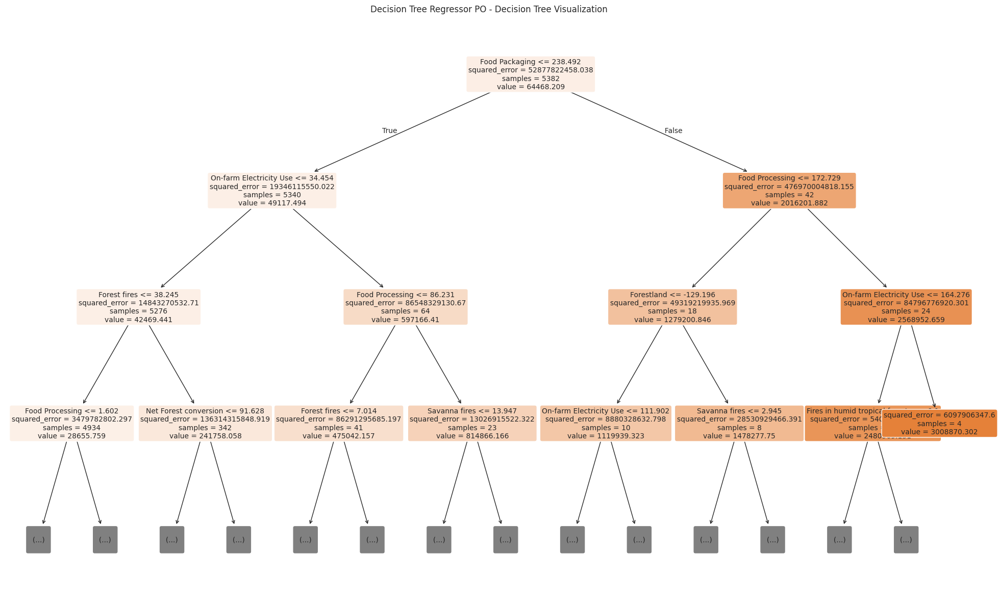

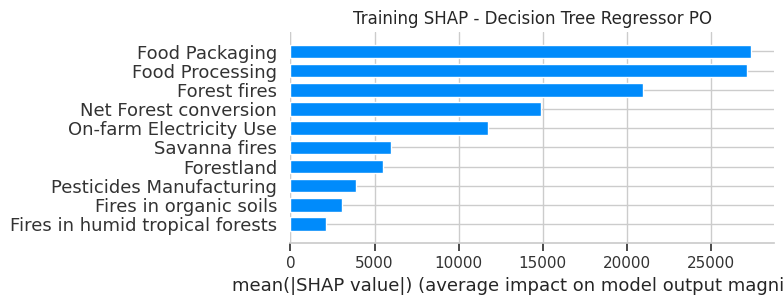

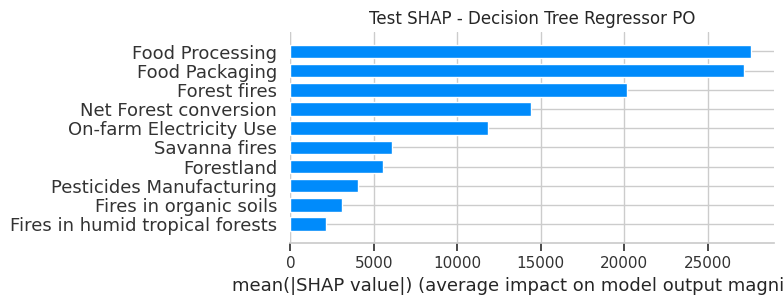

Training Bagging Regressor PO...
Training Random Forest Regressor PO...


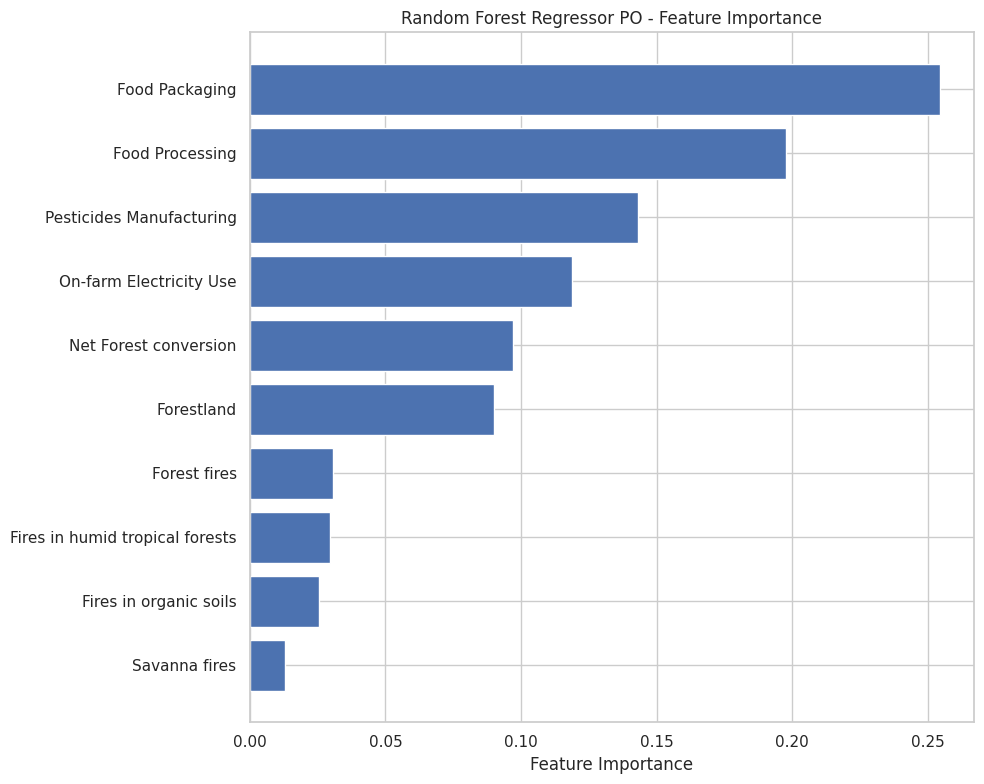

Training AdaBoost Regressor PO...
Training XGBoost Regressor PO...
Training Support Vector Regressor PO...


,Model,Train_MAE,Train_RMSE,Train_MSE,Train_R2,Train_R2_Adj,Test_MAE,Test_RMSE,Test_MSE,Test_R2,Test_R2_Adj
0,Random Forest Regressor PO,954.92,1520.81,2312851.44,1.00,1.00,3749.15,11452.84,131167622.15,1.00,1.00
1,Bagging Regressor PO,1972.22,8392.50,70433986.55,1.00,1.00,4179.57,15834.06,250717482.69,0.99,0.99
2,KNN Regressor PO,8.97,79.65,6343.51,1.00,1.00,5262.96,23455.88,550178249.21,0.99,0.99
3,Decision Tree Regressor PO,3487.34,13068.85,170794947.10,1.00,1.00,6079.64,23601.98,557053667.47,0.99,0.99
4,XGBoost Regressor PO,5782.51,10419.88,108573862.13,1.00,1.00,7779.97,25209.08,635497957.09,0.99,0.99
5,ElasticNet Regression PO,17198.12,40395.67,1631810503.21,0.97,0.97,16893.06,37987.07,1443017456.86,0.97,0.97
6,Ridge Regression PO,17198.12,40395.67,1631810503.21,0.97,0.97,16893.06,37987.07,1443017477.95,0.97,0.97
7,Lasso Regression PO,17198.12,40395.67,1631810503.21,0.97,0.97,16893.06,37987.07,1443017477.96,0.97,0.97
8,Linear Regression PO,17198.12,40395.67,1631810503.21,0.97,0.97,16893.06,37987.07,1443017477.98,0.97,0.97
9,AdaBoost Regressor PO,38691.93,59394.80,3527742558.39,0.93,0.93,38558.48,58753.00,3451914594.46,0.93,0.93


In [52]:
reduced_results, _ = evaluate_models(
    tuned_red_models, x_train_reduced, y_train, x_test_reduced, y_test
)

#### **Conclusions**: 
- We lost some information, and gained slightly less accurate results in comparison with **optimized models** on the **original dataset**
- We gained almost identical results as **base models** on the **original dataset**

# 4. - Exploration of Results of the Best Model

In [254]:
for model in fitted_models:
    model_name = type(model).__name__
    if model_name == "RandomForestRegressor":
        print("Random Forest returned!")
        best_model = model

Random Forest returned!


## 4.1 - SHAP Explanation

In [255]:
import shap

shap.initjs()

In [256]:
rand_obs = np.random.randint(
    0,
    x_test_scaled.shape[0],
)

In [257]:
prep_shap_values = x_test_scaled.iloc[rand_obs]

In [258]:
explainer = shap.TreeExplainer(best_model)

In [259]:
shap_values = explainer(x_test_scaled)

In [260]:
np.shape(shap_values)

(1583, 21)

### - Waterfall plot

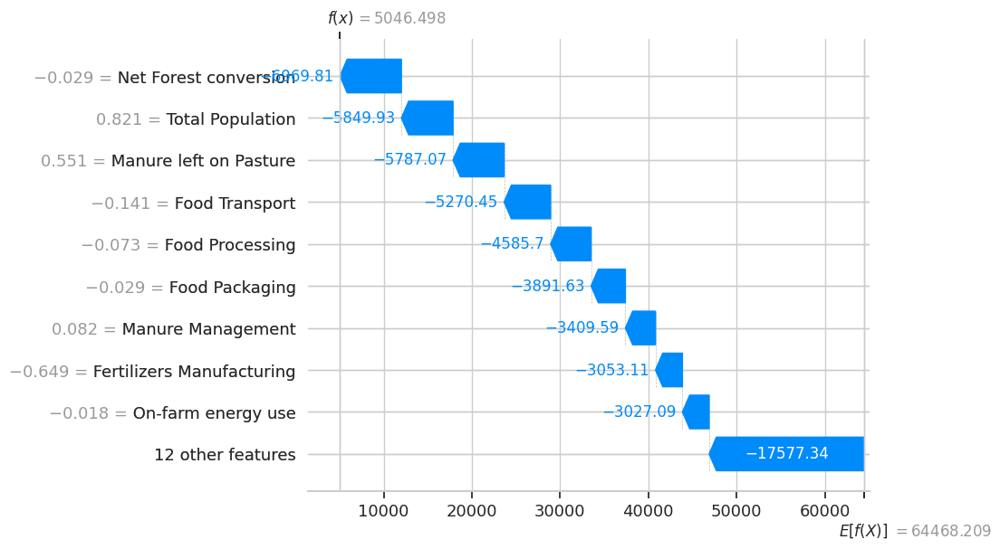

In [261]:
shap.plots.waterfall(shap_values[2], max_display=10)

#####
- E[f(X)]   --->    is Average prediction of Total Emission trough whole dataset
- f(x)      --->    is predicted value for the particular observation 
- SHAP value ---> of particular feature tell us how that feature contributes to observed prediction compared with average prediction 

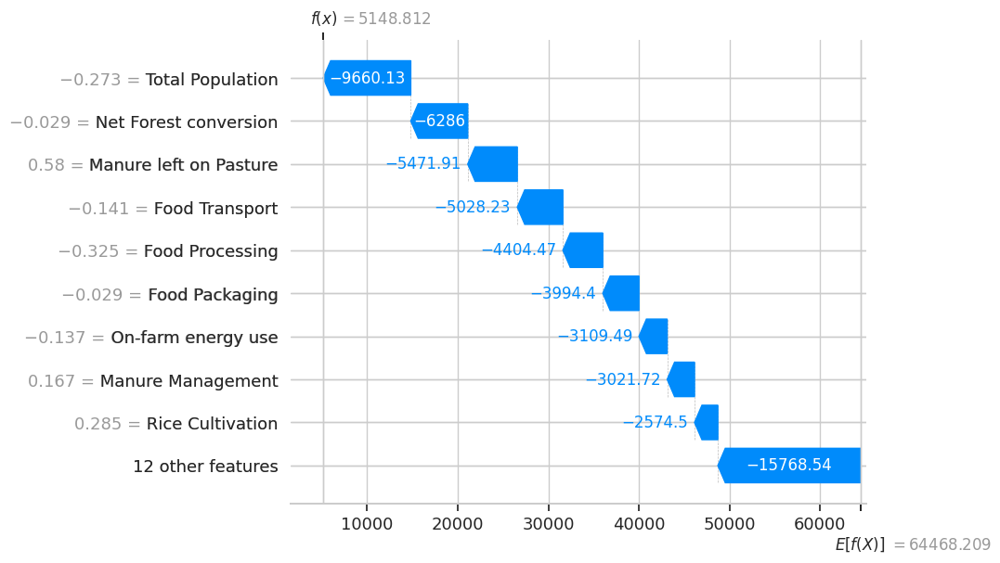

In [280]:
shap.plots.waterfall(shap_values[33], max_display=10)

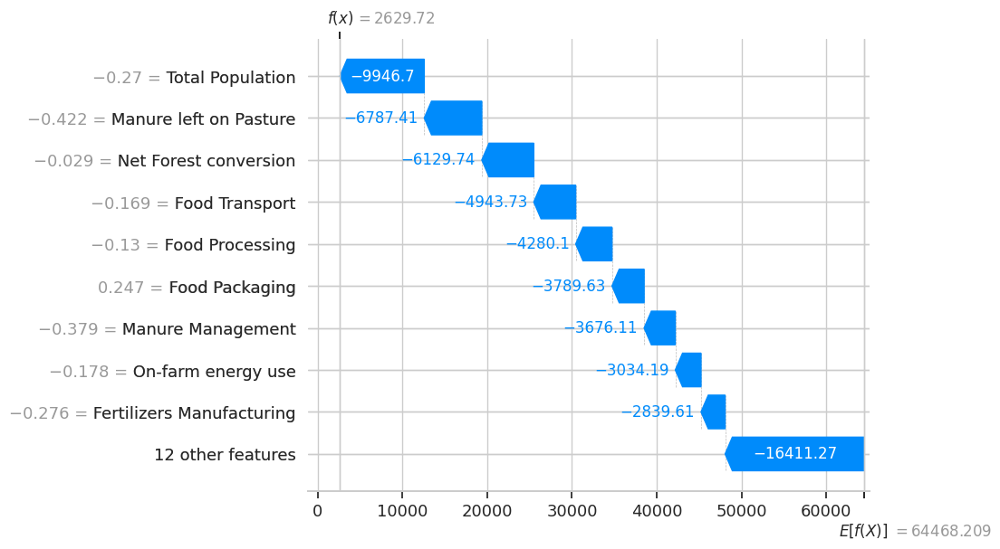

In [281]:
shap.plots.waterfall(shap_values[1233], max_display=10)

### - Force plot - *condensed Waterfall plot*

In [262]:
shap.plots.force(
    shap_values[2],
)

### - Stacked Force plot

In [263]:
shap.plots.force(shap_values[:100], feature_names=x_test_scaled.columns)

### - Absolute Mean SHAP

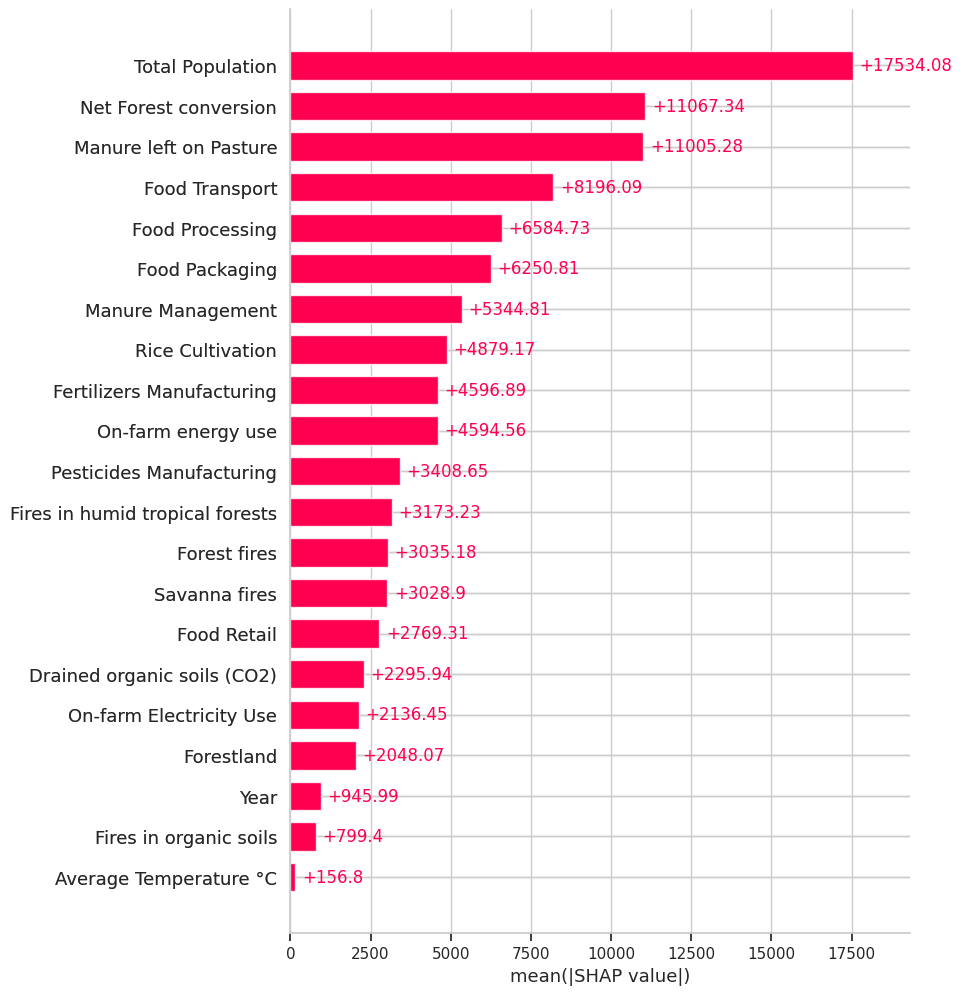

In [264]:
shap.plots.bar(
    shap_values,  max_display=21
)

### - Beeswarm plot

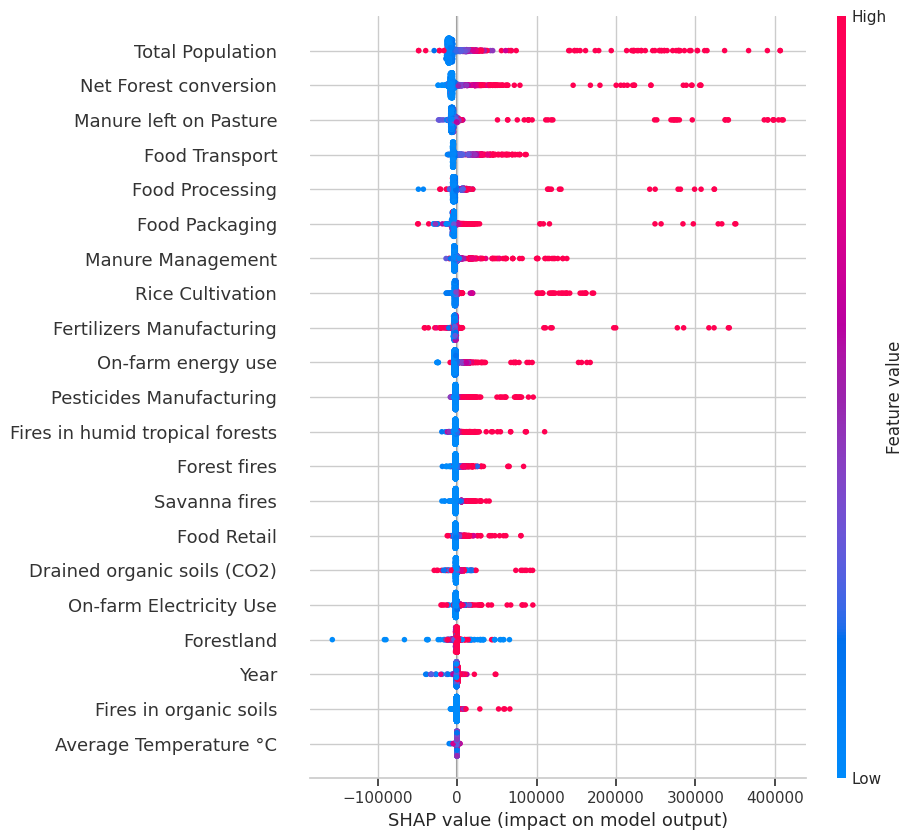

In [265]:
shap.plots.beeswarm(shap_values, max_display=21)

## 4.2 - LIME - Local Exploration of Predictions of Test Observations with biggest Quadrat Error

In [266]:
from lime.lime_tabular import LimeTabularExplainer

In [267]:
x_test_scaled = x_test_scaled.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

In [268]:
def top5_squared_error_indices(model, X, y, top_n=5):
    """
    Fits `model` on (X_train, y_train), computes per-row squared error on (X, y),
    and returns the indices of the top_n rows with the largest squared error.
    """
    y_pred = model.predict(X)
    se = (y - y_pred)**2          # y is a pandas Series
    return se.nlargest(top_n).index.tolist(), y_pred

In [269]:
indices, y_pred = top5_squared_error_indices(best_model, x_test_scaled, y_test, top_n=5)

In [270]:
indices

[680, 674, 194, 319, 298]

In [271]:
real_values = y_test.iloc[indices].values
predicted_values = y_pred[indices].tolist()
final_results = pd.DataFrame(
    {
        "Index": indices,
        "Real Value": real_values,
        "Predicted Value": predicted_values,
    }
)

In [272]:
final_results.round(2)

,Index,Real Value,Predicted Value
0,680,708778.78,910926.49
1,674,408618.68,525544.17
2,194,650855.48,761191.05
3,319,2229615.22,2130137.98
4,298,2305207.92,2211835.56


In [273]:
lime_explainer = LimeTabularExplainer(x_test_scaled.values,
                                        feature_names=x_test_scaled.columns.tolist(),
                                        mode='regression',
                                        random_state=0)

In [274]:
exp = lime_explainer.explain_instance(x_test_scaled.iloc[indices[0]].values,
                                    best_model.predict,
                                    labels=x_test_scaled.columns.tolist())
print(final_results.iloc[0].round(2))
exp.show_in_notebook(show_table=True)

Index                 680.00
Real Value         708778.78
Predicted Value    910926.49
Name: 0, dtype: float64


In [275]:
exp = lime_explainer.explain_instance(x_test_scaled.iloc[indices[1]].values,
                                    best_model.predict,
                                    labels=x_test_scaled.columns.tolist())
print(final_results.iloc[1].round(2))
exp.show_in_notebook(show_table=True)

Index                 674.00
Real Value         408618.68
Predicted Value    525544.17
Name: 1, dtype: float64


In [276]:
exp = lime_explainer.explain_instance(x_test_scaled.iloc[indices[2]].values,
                                    best_model.predict,
                                    labels=x_test_scaled.columns.tolist())
print(final_results.iloc[2].round(2))
exp.show_in_notebook(show_table=True)

Index                 194.00
Real Value         650855.48
Predicted Value    761191.05
Name: 2, dtype: float64


In [277]:
exp = lime_explainer.explain_instance(x_test_scaled.iloc[indices[3]].values,
                                    best_model.predict,
                                    labels=x_test_scaled.columns.tolist())
print(final_results.iloc[3].round(2))
exp.show_in_notebook(show_table=True)

Index                  319.00
Real Value         2229615.22
Predicted Value    2130137.98
Name: 3, dtype: float64


In [278]:
exp = lime_explainer.explain_instance(x_test_scaled.iloc[indices[4]].values,
                                    best_model.predict,
                                    labels=x_test_scaled.columns.tolist())
print(final_results.iloc[4].round(2))
exp.show_in_notebook(show_table=True)

Index                  298.00
Real Value         2305207.92
Predicted Value    2211835.56
Name: 4, dtype: float64
